# Data

### The Metropolitan Musuem of Art

Citated from: https://metmuseum.github.io/

There are API endpoints available for the following elements:

1. Objects: A listing of all valid Object IDs available for access.  
2. Object: A record for an object, containing all open access data about that object, including its image (if the image is available under Open Access)  
3. Departments: A listing of all valid departments, with their department ID and the department display name  
4. Search: A listing of all Object IDs for objects that contain the search query within the object’s data

In [ ]:
import requests
import time
from tqdm import tqdm

In [ ]:
# API endpoints
url = "https://collectionapi.metmuseum.org/public/collection/v1/objects"

In [ ]:
response = requests.get(url)

# Check if the request was successful
if response.status_code == 200: # When making an HTTP request (e.g., using requests.get()), the server responds with a status code. Status code 200 means "Success." and the server returned the requested data. If the status code is not 200, it means something went wrong (e.g., the server couldn't find the resource, there was a server error, etc.).
    data = response.json() # The Met API returns data in JSON format, which is a structured way of representing data as key-value pairs. response.json() parses the JSON content and converts it into a Python dictionary.
    object_ids = data['objectIDs']  # List of all object IDs
    total_objects = data['total']   # Total number of objects
    print(f"Total objects: {total_objects}")
else:
    print(f"Failed to retrieve data: {response.status_code}")

Total objects: 494428


### Data examples

In [ ]:
import requests
import json
# Exploring Met Museum API Endpoints Code
# API endpoints
url = "https://collectionapi.metmuseum.org/public/collection/v1/objects"

response = requests.get(url)

# Check if the request was successful
if response.status_code == 200: # When making an HTTP request (e.g., using requests.get()), the server responds with a status code. Status code 200 means "Success." and the server returned the requested data. If the status code is not 200, it means something went wrong (e.g., the server couldn't find the resource, there was a server error, etc.).
    data = response.json() # The Met API returns data in JSON format, which is a structured way of representing data as key-value pairs. response.json() parses the JSON content and converts it into a Python dictionary.
    object_ids = data['objectIDs']  # List of all object IDs
    total_objects = data['total']   # Total number of objects
    print(f"Total objects: {total_objects}")
else:
    print(f"Failed to retrieve data: {response.status_code}")

# Example: Fetch details for the first 5 objects
for obj_id in object_ids[2000:2005]:
    object_url = f"https://collectionapi.metmuseum.org/public/collection/v1/objects/{obj_id}"
    object_response = requests.get(object_url)

    if object_response.status_code == 200:
        object_data = object_response.json()
        print(f"Object ID: {obj_id}")
        print(f"Title: {object_data.get('title')}")
        print(f"Date: {object_data.get('objectDate')}")
        print(f"Culture: {object_data.get('culture')}")
        print(f"Image URL: {object_data.get('primaryImage')}")
        print(f"Object URL: {object_data.get('objectURL')}")
        print(f"Element Description: {object_data.get('elementDescription')}")
        print(f"Object Wikidata URL: {object_data.get('objectWikidata_URL')}")
        print("-" * 40)
    else:
        print(f"Failed to retrieve data for Object ID {obj_id}")


Total objects: 494428
Object ID: 3858
Title: Full-size patterns for facsimiles of front and back halves of rim and neck of Bryant Vase
Date: ca. 1875
Culture: American
Image URL: 
Object URL: https://www.metmuseum.org/art/collection/search/3858
Element Description: None
Object Wikidata URL: https://www.wikidata.org/wiki/Q116370143
----------------------------------------
Object ID: 3859
Title: Full-size patterns for facsimiles of front and back halves of foot of Bryant Vase
Date: ca. 1875
Culture: American
Image URL: 
Object URL: https://www.metmuseum.org/art/collection/search/3859
Element Description: None
Object Wikidata URL: https://www.wikidata.org/wiki/Q116370141
----------------------------------------
Object ID: 3860
Title: Funeral spoon
Date: ca. 1688
Culture: American
Image URL: https://images.metmuseum.org/CRDImages/ad/original/DP250625.jpg
Object URL: https://www.metmuseum.org/art/collection/search/3860
Element Description: None
Object Wikidata URL: https://www.wikidata.org/

### Filtering object ids based on column names in the Met metadata csv file

#### The entire data  
484956 objects

In [ ]:
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
met_df = pd.read_csv("/content/drive/My Drive/master_thesis_project/MetObjects.csv", low_memory=False)
met_df.head()

,Object Number,Is Highlight,Is Timeline Work,Is Public Domain,Object ID,Gallery Number,Department,AccessionYear,Object Name,Title,...,River,Classification,Rights and Reproduction,Link Resource,Object Wikidata URL,Metadata Date,Repository,Tags,Tags AAT URL,Tags Wikidata URL
0,1979.486.1,False,False,False,1,NaN,The American Wing,1979,Coin,One-dollar Liberty Head Coin,...,NaN,NaN,NaN,http://www.metmuseum.org/art/collection/search/1,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN
1,1980.264.5,False,False,False,2,NaN,The American Wing,1980,Coin,Ten-dollar Liberty Head Coin,...,NaN,NaN,NaN,http://www.metmuseum.org/art/collection/search/2,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN
2,67.265.9,False,False,False,3,NaN,The American Wing,1967,Coin,Two-and-a-Half Dollar Coin,...,NaN,NaN,NaN,http://www.metmuseum.org/art/collection/search/3,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN
3,67.265.10,False,False,False,4,NaN,The American Wing,1967,Coin,Two-and-a-Half Dollar Coin,...,NaN,NaN,NaN,http://www.metmuseum.org/art/collection/search/4,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN
4,67.265.11,False,False,False,5,NaN,The American Wing,1967,Coin,Two-and-a-Half Dollar Coin,...,NaN,NaN,NaN,http://www.metmuseum.org/art/collection/search/5,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN


In [ ]:
met_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 484956 entries, 0 to 484955
Data columns (total 54 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Object Number            484956 non-null  object 
 1   Is Highlight             484956 non-null  bool   
 2   Is Timeline Work         484956 non-null  bool   
 3   Is Public Domain         484956 non-null  bool   
 4   Object ID                484956 non-null  int64  
 5   Gallery Number           49541 non-null   object 
 6   Department               484956 non-null  object 
 7   AccessionYear            481094 non-null  object 
 8   Object Name              482690 non-null  object 
 9   Title                    456153 non-null  object 
 10  Culture                  208190 non-null  object 
 11  Period                   91143 non-null   object 
 12  Dynasty                  23201 non-null   object 
 13  Reign                    11236 non-null   object 
 14  Port

#### Greek and Roman Art Department + Date 1000 B.C. - 1 A.D. + Public Domain + Non-fragments  
6027 objects

In [ ]:
met_greek_roman_public_nonfragment_date = met_df[
    (met_df["Department"] == "Greek and Roman Art") &
    (met_df["Object Begin Date"] >= -1000) &
    (met_df["Object End Date"] <= 1) &
    (met_df["Is Public Domain"] == True) &
    (~met_df["Title"].astype(str).str.lower().str.contains("fragment", na=False))
]

met_greek_roman_public_nonfragment_date.head()

,Object Number,Is Highlight,Is Timeline Work,Is Public Domain,Object ID,Gallery Number,Department,AccessionYear,Object Name,Title,...,River,Classification,Rights and Reproduction,Link Resource,Object Wikidata URL,Metadata Date,Repository,Tags,Tags AAT URL,Tags Wikidata URL
139013,74.51.3631,False,False,True,239585,171,Greek and Roman Art,1874,Pendant in the form of a vase,Pendant in the form of a vase,...,NaN,Gold and Silver,NaN,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN
139014,74.51.1,False,False,True,239586,NaN,Greek and Roman Art,1874,Bead,Glass bead,...,NaN,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN
139016,74.51.3,False,False,True,239588,NaN,Greek and Roman Art,1874,Bead,Glass eye bead,...,NaN,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN
139021,74.51.8,False,False,True,239593,NaN,Greek and Roman Art,1874,Bead,Glass bead,...,NaN,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN
139023,74.51.11,False,False,True,239596,NaN,Greek and Roman Art,1874,Bead,Glass bead,...,NaN,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN


In [ ]:
met_greek_roman_public_nonfragment_date.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6027 entries, 139013 to 478232
Data columns (total 54 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Object Number            6027 non-null   object 
 1   Is Highlight             6027 non-null   bool   
 2   Is Timeline Work         6027 non-null   bool   
 3   Is Public Domain         6027 non-null   bool   
 4   Object ID                6027 non-null   int64  
 5   Gallery Number           3635 non-null   object 
 6   Department               6027 non-null   object 
 7   AccessionYear            5989 non-null   object 
 8   Object Name              6026 non-null   object 
 9   Title                    6027 non-null   object 
 10  Culture                  5979 non-null   object 
 11  Period                   5620 non-null   object 
 12  Dynasty                  0 non-null      object 
 13  Reign                    0 non-null      object 
 14  Portfolio             

### Download object descriptions

#### Extract descriptions

In [ ]:
import requests
from bs4 import BeautifulSoup
from tqdm import tqdm
import pandas as pd
from time import time

In [ ]:
def fetch_description(object_id, headers):

    """Fetches the description for a single object ID."""

    base_url = "https://www.metmuseum.org/art/collection/search/"
    url = f"{base_url}{object_id}"

    try:
        response = requests.get(url, headers=headers, timeout=10)

        if response.status_code == 200:
            soup = BeautifulSoup(response.text, "html.parser")
            desc_div = soup.find("div", class_="artwork__intro__desc")

            if desc_div:
                return (object_id, desc_div.get_text(strip=True))
            else:
                return (object_id, f"No description found for object id {object_id}")
        else:
            return (object_id, f"Failed to fetch (status {response.status_code})")

    except requests.exceptions.SSLError:
        # Retry once in case of SSL error
        print(f"SSL error for object id {object_id}, retrying...")
        time.sleep(2)  # Wait before retrying
        response = requests.get(url, headers=headers, timeout=10)  # Retry
        if response.status_code == 200:
            soup = BeautifulSoup(response.text, "html.parser")
            desc_div = soup.find("div", class_="artwork__intro__desc")
            if desc_div:
                return (object_id, desc_div.get_text(strip=True))
            else:
                return (object_id, f"No description found for object id {object_id}")
        else:
            return (object_id, f"Failed to fetch (status {response.status_code})")

    except requests.exceptions.RequestException as e:
        print(f"Error for object id {object_id}: {e}")
        return (object_id, f"Error: {e}")

In [ ]:
def extract_object_descriptions(base_url, object_ids, headers):

    """Fetches descriptions for multiple object IDs with retries for errors."""

    results = []

    for object_id in tqdm(object_ids, desc="Extracting descriptions for Met objects"):
        result = fetch_description(object_id, headers)
        results.append(result)

    # Convert to DataFrame
    id_desc_df = pd.DataFrame(results, columns=["Object ID", "Description"])
    return id_desc_df

In [ ]:
base_url = "https://www.metmuseum.org/art/collection/search/"

headers = {
    "Accept": "*/*",
    "Accept-Encoding": "gzip, deflate, br",
    "Accept-Language": "en-GB,en;q=0.9",
    "Connection": "keep-alive",
    "Content-Type": "text/plain",
    "Sec-Fetch-Dest": "empty",
    "Sec-Fetch-Mode": "cors",
    "Sec-Fetch-Site": "cross-site",
    "User-Agent": "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.0 Safari/605.1.15"
}

met_obejcts_ids = met_greek_roman_public_nonfragment_date["Object ID"].tolist()

met_descriptions = extract_object_descriptions(base_url, met_obejcts_ids, headers)

Extracting descriptions for Met objects:  12%|█▏        | 697/6027 [08:41<1:10:58,  1.25it/s]

SSL error for object id 241325, retrying...


Extracting descriptions for Met objects:  19%|█▉        | 1153/6027 [15:07<4:48:20,  3.55s/it]

Error for object id 242406: HTTPSConnectionPool(host='www.metmuseum.org', port=443): Read timed out. (read timeout=10)


Extracting descriptions for Met objects:  19%|█▉        | 1154/6027 [15:17<7:27:00,  5.50s/it]

Error for object id 242407: HTTPSConnectionPool(host='www.metmuseum.org', port=443): Read timed out. (read timeout=10)


Extracting descriptions for Met objects:  26%|██▌       | 1556/6027 [21:21<1:02:32,  1.19it/s]

SSL error for object id 243823, retrying...


Extracting descriptions for Met objects:  28%|██▊       | 1697/6027 [23:20<56:03,  1.29it/s]

SSL error for object id 244487, retrying...


Extracting descriptions for Met objects:  42%|████▏     | 2515/6027 [35:55<4:05:53,  4.20s/it]

Error for object id 246617: HTTPSConnectionPool(host='www.metmuseum.org', port=443): Read timed out.


Extracting descriptions for Met objects:  48%|████▊     | 2873/6027 [41:29<3:40:35,  4.20s/it]

Error for object id 247343: HTTPSConnectionPool(host='www.metmuseum.org', port=443): Read timed out. (read timeout=10)


Extracting descriptions for Met objects:  57%|█████▋    | 3425/6027 [50:05<2:37:12,  3.62s/it]

Error for object id 248789: HTTPSConnectionPool(host='www.metmuseum.org', port=443): Read timed out. (read timeout=10)


Extracting descriptions for Met objects:  59%|█████▉    | 3566/6027 [52:12<31:22,  1.31it/s]

SSL error for object id 249439, retrying...


Extracting descriptions for Met objects:  66%|██████▌   | 3961/6027 [58:14<2:24:49,  4.21s/it]

Error for object id 251177: HTTPSConnectionPool(host='www.metmuseum.org', port=443): Read timed out. (read timeout=10)


Extracting descriptions for Met objects:  90%|████████▉ | 5395/6027 [1:20:12<09:58,  1.06it/s]

SSL error for object id 255575, retrying...


Extracting descriptions for Met objects:  99%|█████████▊| 5947/6027 [1:28:26<05:13,  3.92s/it]

Error for object id 330036: HTTPSConnectionPool(host='www.metmuseum.org', port=443): Read timed out.


Extracting descriptions for Met objects:  99%|█████████▉| 5991/6027 [1:29:03<00:32,  1.09it/s]

SSL error for object id 698245, retrying...


Extracting descriptions for Met objects: 100%|██████████| 6027/6027 [1:29:41<00:00,  1.12it/s]


In [ ]:
met_descriptions.head(10)

,Object ID,Description
0,239585,Gold pendant in the form of a vase.
1,239586,"Translucent deep purple, appearing black; trai..."
2,239588,Stratified double eye bead; two sets of four e...
3,239593,"Uncertain color, probably translucent deep pur..."
4,239596,"Uncertain color, appearing black; trail in opa..."
5,239598,Translucent deep blue; trails in opaque yellow...
6,239706,"Opaque white, opaque green and turquoise blue ..."
7,239897,Coloress with pale greenish tinge.Rim with eve...
8,239901,The beads formed a necklace that probably had ...
9,239904,Translucent light blue with greenish tinge; op...


#### Merge descriptions dataframe with the original metadata dateframe together, convert the merged dataframe to a csv file and save it to google drive

In [ ]:
merged_df = pd.merge(met_greek_roman_public_nonfragment_date, met_descriptions, on="Object ID", how="left")

csv_file_path = '/content/drive/My Drive/master_thesis_project/met_metadata.csv'

merged_df.to_csv(csv_file_path, index=False)

print(f"File saved to Google Drive at: {csv_file_path}")

File saved to Google Drive at: /content/drive/My Drive/master_thesis_project/met_metadata.csv


#### Load the met metadata from google drive

In [ ]:
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
met_metadata = pd.read_csv('/content/drive/My Drive/master_thesis_project/met_metadata_w_https_error.csv', low_memory=False)
met_metadata.head()

,Object Number,Is Highlight,Is Timeline Work,Is Public Domain,Object ID,Gallery Number,Department,AccessionYear,Object Name,Title,...,Classification,Rights and Reproduction,Link Resource,Object Wikidata URL,Metadata Date,Repository,Tags,Tags AAT URL,Tags Wikidata URL,Description
0,74.51.3631,False,False,True,239585,171.0,Greek and Roman Art,1874.0,Pendant in the form of a vase,Pendant in the form of a vase,...,Gold and Silver,NaN,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,Gold pendant in the form of a vase.
1,74.51.1,False,False,True,239586,NaN,Greek and Roman Art,1874.0,Bead,Glass bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,"Translucent deep purple, appearing black; trai..."
2,74.51.3,False,False,True,239588,NaN,Greek and Roman Art,1874.0,Bead,Glass eye bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,Stratified double eye bead; two sets of four e...
3,74.51.8,False,False,True,239593,NaN,Greek and Roman Art,1874.0,Bead,Glass bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,"Uncertain color, probably translucent deep pur..."
4,74.51.11,False,False,True,239596,NaN,Greek and Roman Art,1874.0,Bead,Glass bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa..."


#### If removing objects with missing descriptions (update: as discussed, keep these objects)

In [ ]:
missing_desc_ids = met_metadata.loc[met_metadata['Description'].isna(), 'Object ID'].tolist()

In [ ]:
print(f"Number of objects that don't have descriptions: {len(missing_desc_ids)}")

Number of objects that don't have descriptions: 763


verify whether these objects have descriptions

In [ ]:
for obj_id in missing_desc_ids:
    desc = met_metadata.loc[met_metadata["Object ID"] == obj_id, "Description"].values
    print(f"Object ID {obj_id}: {desc[0] if len(desc) > 0 else 'Not found'}")

Object ID 240278: nan
Object ID 240301: nan
Object ID 240302: nan
Object ID 240393: nan
Object ID 240405: nan
Object ID 240420: nan
Object ID 240425: nan
Object ID 240427: nan
Object ID 240434: nan
Object ID 240435: nan
Object ID 240436: nan
Object ID 240437: nan
Object ID 240439: nan
Object ID 240440: nan
Object ID 240441: nan
Object ID 240442: nan
Object ID 240443: nan
Object ID 240444: nan
Object ID 240449: nan
Object ID 240450: nan
Object ID 240451: nan
Object ID 240452: nan
Object ID 240454: nan
Object ID 240460: nan
Object ID 240469: nan
Object ID 240470: nan
Object ID 240471: nan
Object ID 240472: nan
Object ID 240473: nan
Object ID 240474: nan
Object ID 240475: nan
Object ID 240477: nan
Object ID 240478: nan
Object ID 240480: nan
Object ID 240481: nan
Object ID 240482: nan
Object ID 240483: nan
Object ID 240485: nan
Object ID 240488: nan
Object ID 240489: nan
Object ID 240490: nan
Object ID 240491: nan
Object ID 240510: nan
Object ID 240511: nan
Object ID 240512: nan
Object ID 

In [ ]:
# Remove objects with missing descriptions
met_greek_roman_public_nonfragment_date_desc = met_metadata[~met_metadata["Object ID"].isin(missing_desc_ids)]

In [ ]:
# Check the updated DataFrame to see how many rows remain
print(met_greek_roman_public_nonfragment_date_desc.shape)

(5264, 55)


#### Measure Met descriptions length by characters

In [ ]:
met_greek_roman_public_nonfragment_date_desc.loc[:, "Desc Length"] = met_greek_roman_public_nonfragment_date_desc["Description"].str.len()

longest_met_desc = met_greek_roman_public_nonfragment_date_desc["Desc Length"].max()
shortest_met_desc = met_greek_roman_public_nonfragment_date_desc["Desc Length"].min()
average_met_desc = met_greek_roman_public_nonfragment_date_desc["Desc Length"].mean()

print(f"Longest Met Description Length: {longest_met_desc}")
print(f"Shortest Met Description Length: {shortest_met_desc}")
print(f"Average Met Description Length: {average_met_desc:.2f}")

Longest Met Description Length: 8722
Shortest Met Description Length: 4
Average Met Description Length: 243.56


In [ ]:
# Find the index of the longest and shortest description
longest_desc_index = met_greek_roman_public_nonfragment_date_desc["Desc Length"].idxmax()
shortest_desc_index = met_greek_roman_public_nonfragment_date_desc["Desc Length"].idxmin()

# Get the Object ID of the longest and shortest description
longest_met_desc_object_id = met_greek_roman_public_nonfragment_date_desc.loc[longest_desc_index, "Object ID"]
shortest_met_desc_object_id = met_greek_roman_public_nonfragment_date_desc.loc[shortest_desc_index, "Object ID"]

# Get the longest and shortest description
longest_met_desc = met_greek_roman_public_nonfragment_date_desc.loc[longest_desc_index, "Description"]
shortest_met_desc = met_greek_roman_public_nonfragment_date_desc.loc[shortest_desc_index, "Description"]

print(f"Longest Met Description:\nObject ID: {longest_met_desc_object_id}\nDescription: {longest_met_desc}")
print()
print(f"Shortest Met Description:\nObject ID: {shortest_met_desc_object_id}\nDescription: {shortest_met_desc}")

Longest Met Description:
Object ID: 247020
Description: Scenes from the life of the Greek hero AchillesThe AcquisitionIn 1902, a landowner working on his property accidentally discovered a subterranean built tomb covered by a tumulus (mound). His investigations revealed the remains of a parade chariot as well as bronze, ceramic, and iron utensils together with other grave goods. Following the discovery, the finds passed through the hands of several Italian owners and dealers who were responsible for the appearance of the chariot and related material on the Paris art market. There they were purchased in 1903 by General Luigi Palma di Cesnola, the first director of The Metropolitan Museum of Art. The Monteleone chariot is the best preserved example of its kind from ancient Italy before the Roman period. The relatively good condition of its major parts--the panels of the car, the pole, and the wheels--has made it possible to undertake a new reconstruction based on the most recent scholars

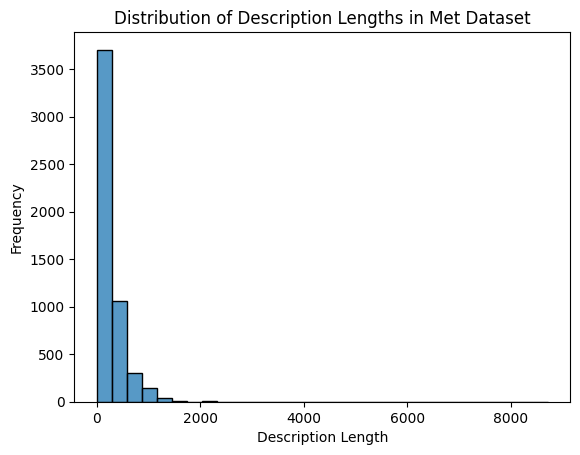

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(met_greek_roman_public_nonfragment_date_desc["Desc Length"], bins=30, kde=False)
plt.xlabel("Description Length")
plt.ylabel("Number of objects")
plt.title("Distribution of Description Lengths in Met Dataset")
plt.show()

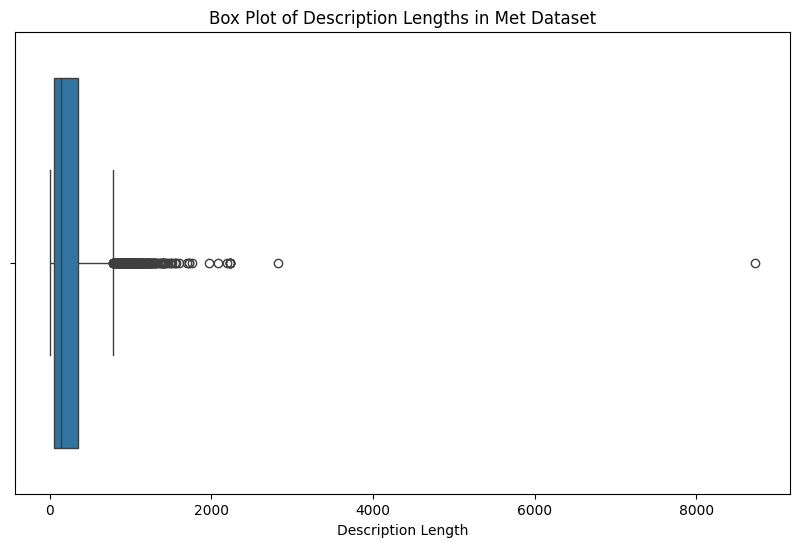

In [ ]:
# Take a look at the outlier
plt.figure(figsize=(10, 6))
sns.boxplot(x=met_greek_roman_public_nonfragment_date_desc["Desc Length"])
plt.xlabel("Description Length")
plt.title("Box Plot of Description Lengths in Met Dataset")
plt.show()

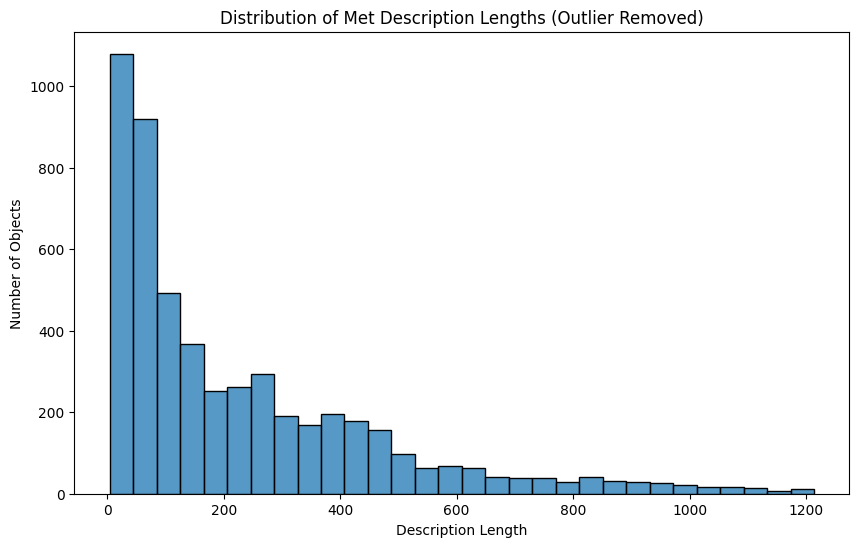

In [ ]:
# Remove the outlier: Filter out values above the 99th percentile
threshold = met_greek_roman_public_nonfragment_date_desc["Desc Length"].quantile(0.99)
filtered_data = met_greek_roman_public_nonfragment_date_desc[met_greek_roman_public_nonfragment_date_desc["Desc Length"] <= threshold]

plt.figure(figsize=(10, 6))
sns.histplot(filtered_data["Desc Length"], bins=30, kde=False)
plt.xlabel("Description Length")
plt.ylabel("Number of Objects")
plt.title("Distribution of Met Description Lengths (Outlier Removed)")
plt.show()

#### Measure Met descriptions length by tokens

##### No Truncation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from transformers import AutoTokenizer

In [ ]:
# Compute statistics
def compute_stats(lengths):
    return {
        "min": np.min(lengths),
        "max": np.max(lengths),
        "mean": np.mean(lengths),
        "median": np.median(lengths)
    }

In [ ]:
bert_tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
bert_lengths = [
    len(bert_tokenizer.encode(desc))
    for desc in met_greek_roman_public_nonfragment_date_desc["Description"]]

bert_stats = compute_stats(bert_lengths)

print("BERT Token Lengths Statistics:", bert_stats)

Token indices sequence length is longer than the specified maximum sequence length for this model (1784 > 512). Running this sequence through the model will result in indexing errors


BERT Token Lengths Statistics: {'min': np.int64(3), 'max': np.int64(1784), 'mean': np.float64(56.05357142857143), 'median': np.float64(35.0)}


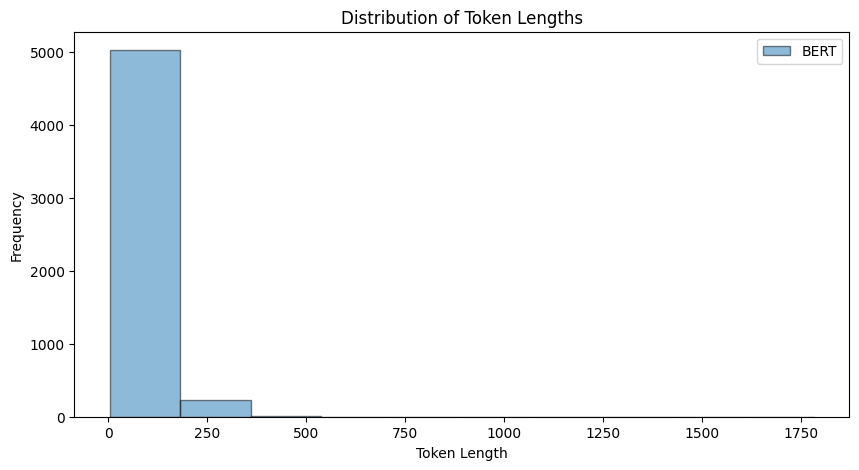

In [ ]:
# Visualization
plt.figure(figsize=(10, 5))
plt.hist(bert_lengths, bins=10, alpha=0.5, label="BERT", edgecolor='black')
plt.xlabel("Token Length")
plt.ylabel("Frequency")
plt.title("Distribution of Token Lengths")
plt.legend()
plt.show()

In [ ]:
# Compute token lengths
met_greek_roman_public_nonfragment_date_desc["token_length"] = met_greek_roman_public_nonfragment_date_desc["Description"].apply(
    lambda x: len(bert_tokenizer.encode(x))
)

# Find the longest and shortest descriptions based on token length
longest_row = met_greek_roman_public_nonfragment_date_desc.loc[met_greek_roman_public_nonfragment_date_desc["token_length"].idxmax()]
shortest_row = met_greek_roman_public_nonfragment_date_desc.loc[met_greek_roman_public_nonfragment_date_desc["token_length"].idxmin()]

longest_desc_id = longest_row["Object ID"]
longest_desc = longest_row["Description"]
longest_token_length = longest_row["token_length"]

shortest_desc_id = shortest_row["Object ID"]
shortest_desc = shortest_row["Description"]
shortest_token_length = shortest_row["token_length"]

# Print results
print(f"Longest description ID: {longest_desc_id}\nDescription: {longest_desc}\nToken Length: {longest_token_length}\n")
print(f"Shortest description ID: {shortest_desc_id}\nDescription: {shortest_desc}\nToken Length: {shortest_token_length}\n")

Longest description ID: 247020
Description: Scenes from the life of the Greek hero AchillesThe AcquisitionIn 1902, a landowner working on his property accidentally discovered a subterranean built tomb covered by a tumulus (mound). His investigations revealed the remains of a parade chariot as well as bronze, ceramic, and iron utensils together with other grave goods. Following the discovery, the finds passed through the hands of several Italian owners and dealers who were responsible for the appearance of the chariot and related material on the Paris art market. There they were purchased in 1903 by General Luigi Palma di Cesnola, the first director of The Metropolitan Museum of Art. The Monteleone chariot is the best preserved example of its kind from ancient Italy before the Roman period. The relatively good condition of its major parts--the panels of the car, the pole, and the wheels--has made it possible to undertake a new reconstruction based on the most recent scholarship. Moreove

<ipython-input-31-f438a1921223>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  met_greek_roman_public_nonfragment_date_desc["token_length"] = met_greek_roman_public_nonfragment_date_desc["Description"].apply(


In [ ]:
bert_tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
ram_tokens = bert_tokenizer.tokenize("Ram.")
swan_tokens = bert_tokenizer.tokenize("Swan")

print(f"Tokens for 'Ram.': {ram_tokens}")
print(f"Tokens for 'Swan': {swan_tokens}")
# Swan token length is 3 due to special characters ['CLS', 'swan', 'SEP']

Tokens for 'Ram.': ['ram', '.']
Tokens for 'Swan': ['swan']


##### Set Truncation=True, max_length=512

In [ ]:
bert_tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
bert_lengths = [
    len(bert_tokenizer.encode(desc, truncation=True, max_length=512))
    for desc in met_greek_roman_public_nonfragment_date_desc["Description"]]

bert_stats = compute_stats(bert_lengths)

print("BERT Token Lengths Statistics:", bert_stats)

BERT Token Lengths Statistics: {'min': np.int64(3), 'max': np.int64(512), 'mean': np.float64(55.78248480243161), 'median': np.float64(35.0)}


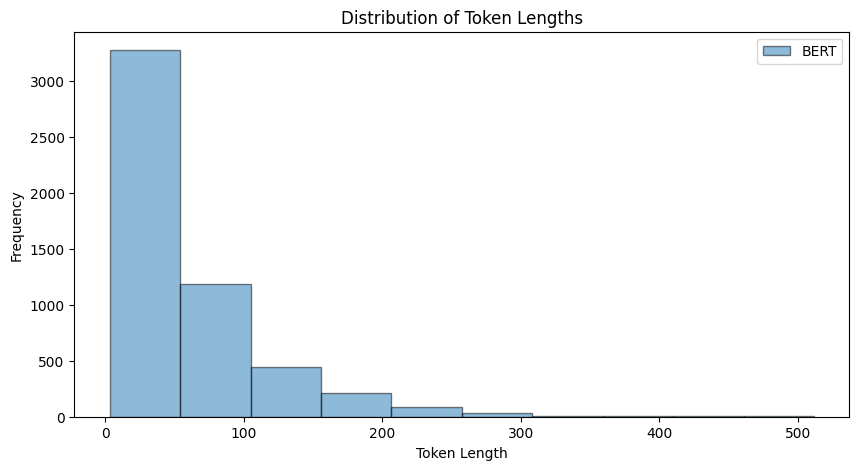

In [ ]:
# Visualization
plt.figure(figsize=(10, 5))
plt.hist(bert_lengths, bins=10, alpha=0.5, label="BERT", edgecolor='black')
plt.xlabel("Token Length")
plt.ylabel("Frequency")
plt.title("Distribution of Token Lengths")
plt.legend()
plt.show()

### Download Met images

#### Download Met images and save them to google drive

In [ ]:
import requests
import os
from tqdm import tqdm

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Base URL for the Met API
base_url = "https://collectionapi.metmuseum.org/public/collection/v1/objects/"

# Directory to save images in Google Drive
image_dir = "/content/drive/MyDrive/master_thesis_project/met_images"
os.makedirs(image_dir, exist_ok=True)
print("Images will be saved to:", os.path.abspath(image_dir))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Images will be saved to: /content/drive/MyDrive/met_images


In [ ]:
# Function to download an image
def download_image(url, file_path):
    try:
        response = requests.get(url)
        if response.status_code == 200:
            with open(file_path, "wb") as img_file:
                img_file.write(response.content)
            return True  # Success
        else:
            print(f"Skipped (HTTP {response.status_code}): {url}")
            return False  # Failed
    except Exception as e:
        print(f"Error downloading {url}: {e}")
        return False  # Failed

In [ ]:
# Function to fetch and download images for an object, "primaryImageSmall" is the thumbnail version of the primary image, it is not downloaded
def download_met_images(object_id):
    url = base_url + str(object_id)
    response = requests.get(url)
    if response.status_code == 200:
        data = response.json()

        # Check if the object is in the public domain
        if data.get('isPublicDomain', False):
            # Download primary image
            primary_image_url = data.get('primaryImage')
            if primary_image_url:
                success = download_image(primary_image_url, f"{image_dir}/{object_id}_primary.jpg")
                if not success:
                    print(f"Failed to download primary image for Object ID {object_id}")

            # Download additional images
            additional_images = data.get('additionalImages', [])
            for idx, image_url in enumerate(additional_images):
                if image_url:
                    success = download_image(image_url, f"{image_dir}/{object_id}_additional_{idx}.jpg")
                    if not success:
                        print(f"Failed to download additional image {idx} for Object ID {object_id}")
        else:
            print(f"Skipped (Not Public Domain): Object ID {object_id}")
    else:
        print(f"Failed to fetch image data for Object ID {object_id}: HTTP {response.status_code}")

In [ ]:
# Loop through the filtered DataFrame and download images with tqdm progress bar
for object_id in tqdm(met_greek_roman_public_nonfragment_date['Object ID'], desc="Downloading images"):
    download_met_images(object_id)

print("Download complete.")

Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/55831.jpg
Failed to download primary image for Object ID 240138


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/LC-74_51_724.jpg
Failed to download primary image for Object ID 240311


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/56255.jpg
Failed to download primary image for Object ID 240437


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/56209.jpg
Failed to download primary image for Object ID 240450


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/11857.jpg
Failed to download additional image 0 for Object ID 240467


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/54525.jpg
Failed to download primary image for Object ID 240536


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/LC-74_51_979.jpg
Failed to download primary image for Object ID 240567


Skipped (Not Public Domain): Object ID 244295


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19514-001.jpg
Failed to download additional image 0 for Object ID 244557
Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19514-002.jpg
Failed to download additional image 1 for Object ID 244557


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP145774.jpg
Failed to download additional image 0 for Object ID 250655


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19157-001.jpg
Failed to download primary image for Object ID 251022


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19158-001.jpg
Failed to download primary image for Object ID 252543
Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19158-002.jpg
Failed to download additional image 0 for Object ID 252543


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19158-003.jpg
Failed to download additional image 1 for Object ID 252543
Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19158-004.jpg
Failed to download additional image 2 for Object ID 252543


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19513-001.jpg
Failed to download primary image for Object ID 252975


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19511-001.jpg
Failed to download primary image for Object ID 253484
Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19511-002.jpg
Failed to download additional image 0 for Object ID 253484
Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19511-003.jpg
Failed to download additional image 1 for Object ID 253484


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19159-001.jpg
Failed to download primary image for Object ID 254174
Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19159-002.jpg
Failed to download additional image 0 for Object ID 254174


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19168-001.jpg
Failed to download primary image for Object ID 254360
Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19168-002.jpg
Failed to download additional image 0 for Object ID 254360
Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19168-003.jpg
Failed to download additional image 1 for Object ID 254360


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19168-004.jpg
Failed to download additional image 2 for Object ID 254360


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19512-001.jpg
Failed to download primary image for Object ID 254699


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19160-001.jpg
Failed to download primary image for Object ID 255116


Failed to fetch data for Object ID 255367: HTTP 404


Failed to fetch data for Object ID 255652: HTTP 404


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19154-001.jpg
Failed to download primary image for Object ID 255688


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19161-001.jpg
Failed to download primary image for Object ID 255802


Failed to fetch data for Object ID 256063: HTTP 404
Failed to fetch data for Object ID 256064: HTTP 404


Failed to fetch data for Object ID 256067: HTTP 404
Failed to fetch data for Object ID 256068: HTTP 404


Failed to fetch data for Object ID 256069: HTTP 404
Failed to fetch data for Object ID 256070: HTTP 404


Failed to fetch data for Object ID 256071: HTTP 404
Failed to fetch data for Object ID 256072: HTTP 404


Failed to fetch data for Object ID 256073: HTTP 404
Failed to fetch data for Object ID 256074: HTTP 404


Failed to fetch data for Object ID 256075: HTTP 404
Failed to fetch data for Object ID 256077: HTTP 404
Failed to fetch data for Object ID 256078: HTTP 404


Failed to fetch data for Object ID 256080: HTTP 404
Failed to fetch data for Object ID 256081: HTTP 404


Failed to fetch data for Object ID 256082: HTTP 404
Failed to fetch data for Object ID 256083: HTTP 404
Failed to fetch data for Object ID 256084: HTTP 404


Failed to fetch data for Object ID 256085: HTTP 404
Failed to fetch data for Object ID 256086: HTTP 404


Failed to fetch data for Object ID 256087: HTTP 404
Failed to fetch data for Object ID 256088: HTTP 404
Failed to fetch data for Object ID 256089: HTTP 404


Failed to fetch data for Object ID 256090: HTTP 404
Failed to fetch data for Object ID 256091: HTTP 404


Failed to fetch data for Object ID 256092: HTTP 404
Failed to fetch data for Object ID 256093: HTTP 404
Failed to fetch data for Object ID 256096: HTTP 404


Failed to fetch data for Object ID 256101: HTTP 404
Failed to fetch data for Object ID 256104: HTTP 404


Failed to fetch data for Object ID 256106: HTTP 404
Failed to fetch data for Object ID 256108: HTTP 404


Failed to fetch data for Object ID 256109: HTTP 404
Failed to fetch data for Object ID 256110: HTTP 404


Failed to fetch data for Object ID 256111: HTTP 404
Failed to fetch data for Object ID 256112: HTTP 404
Failed to fetch data for Object ID 256114: HTTP 404


Failed to fetch data for Object ID 256117: HTTP 404


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/DP-19165-001.jpg
Failed to download primary image for Object ID 256590


Failed to fetch data for Object ID 257783: HTTP 404


Failed to fetch data for Object ID 257787: HTTP 404


Failed to fetch data for Object ID 257804: HTTP 404


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/LC-2021_40_71-2.jpg
Failed to download additional image 1 for Object ID 330056


Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/KN362A.JPG
Failed to download primary image for Object ID 330167
Skipped (HTTP 404): https://images.metmuseum.org/CRDImages/gr/original/KN362.JPG
Failed to download additional image 0 for Object ID 330167


Download complete.


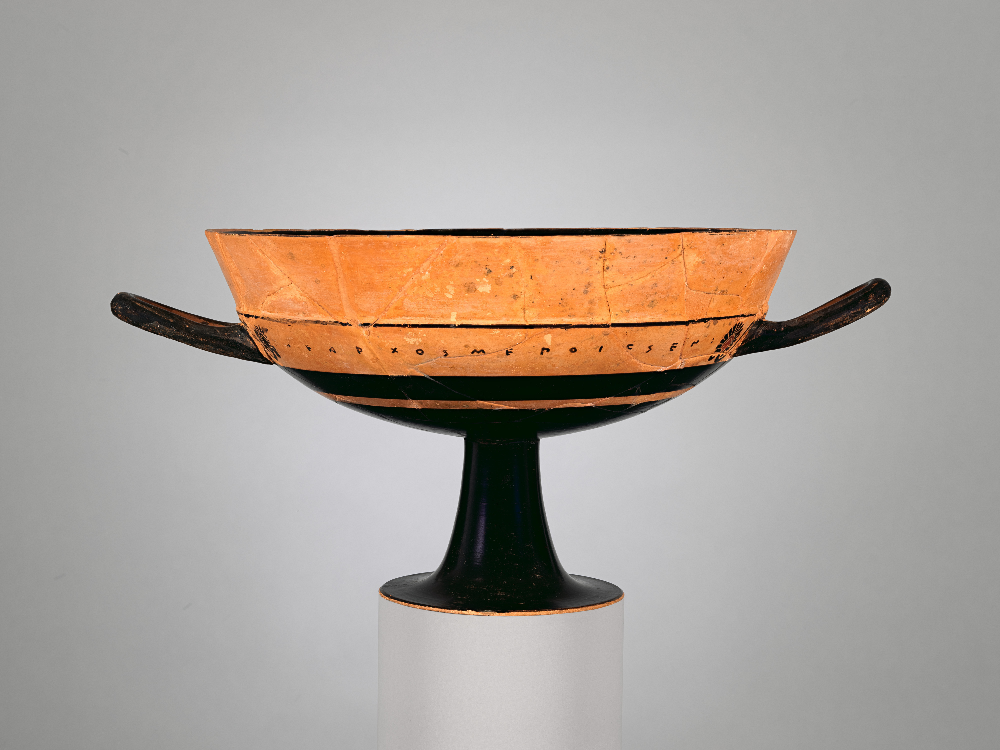

In [ ]:
# just take a look at a random image
from PIL import Image
from IPython.display import display

file = "255098_additional_0.jpg"
file_path = os.path.join(image_dir, file)

img = Image.open(file_path)
display(img)

#### Deleting image duplicates

##### Before deleting duplicates

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
image_dir = "/content/drive/MyDrive/master_thesis_project/met_images"

In [ ]:
image_files = [file for file in os.listdir(image_dir) if file.lower().endswith(".jpg")]
print(f"Number of images in {image_dir}: {len(image_files)}" )

Number of images in /content/drive/MyDrive/master_thesis_project/met_images: 9872


##### After deleting duplicates

Hash

A hash is a unique string or number generated from data (like an image file). The idea is that even a small change in the input (such as changing one pixel in an image) will produce a completely different hash.  

In the case of image files, hashing is used to create a "fingerprint" of the content of the file. If two images are exactly the same, they will generate the same hash. If the images differ in any way, even slightly, their hashes will be different.  

Here’s how hashing works in a simplified way:  

Input: provide the file (e.g., an image).  
Process: The hashing function processes the file’s data (bits of the image) in a complex mathematical way.  
Output: The result is a fixed-size string or number, known as the hash (e.g., an MD5 hash might look like this: e99a18c428cb38d5f260853678922e03).

Example of Hashing in Action:  
Image 1: hash("image1.jpg") → e99a18c428cb38d5f260853678922e03  
Image 2: hash("image2.jpg") → 9a7c2e73b8399c833d635b9d5333b7ad  

If two images have the same hash, they are identical. If their hashes are different, they are not.

In [ ]:
import os
import hashlib
from collections import defaultdict
import shutil
import pandas as pd
from tqdm import tqdm

In [ ]:
def get_image_hash(image_path):
    """Function to compute MD5 hash of an image file."""

    hash_md5 = hashlib.md5() # Initialize MD5 Hash Object, creates a new hash object using the MD5 algorithm (Message-Digest Algorithm 5), MD5 is a widely used cryptographic hash function that outputs a 128-bit hash value, which is typically represented as a 32-character hexadecimal number.
    with open(image_path, 'rb') as f: # opens the file at image_path in binary mode ('rb' stands for "read binary")
        for chunk in iter(lambda: f.read(4096), b""): # reads the image file in chunks of 4096 bytes (4 KB) at a time
            hash_md5.update(chunk) # updates the hash object with each chunk of data. This adds the data to the hash computation
    return hash_md5.hexdigest() # converts the hash value into a hexadecimal string. This string is the final MD5 hash of the file.

In [ ]:
def find_duplicate_images(image_folder):
    """Function to find duplicate images in a folder"""

    image_hashes = defaultdict(list) # Dictionary to store image hashes and their corresponding file paths
    file_sizes = defaultdict(list)  # Store file sizes for quick comparison

    for image_file in tqdm(sorted(os.listdir(image_folder)), desc="Finding duplicate images"):
        image_path = os.path.join(image_folder, image_file)

        if os.path.isfile(image_path): # Make sure to only process files (not directories)
            file_size = os.path.getsize(image_path)  # Get the file size

            # Skip hashing if file sizes don't match
            if file_size in file_sizes:
                try:
                    image_hash = get_image_hash(image_path) # Get hash of the image
                    image_hashes[image_hash].append(image_path) # Store the image file path in the hash dictionary
                except Exception as e:
                    print(f"Error processing {image_path}: {e}")
            else:
                file_sizes[file_size].append(image_path)

    duplicates = {hash: files for hash, files in image_hashes.items() if len(files) > 1} # Find duplicates

    return duplicates

Reading images from google drive make this procedure very slow. Copy the entire met_images directory from Google Drive to local storage in Colab to speed up the processing

In [ ]:
# This might take up to 18 mins
source_dir = '/content/drive/MyDrive/master_thesis_project/met_images'
local_dir = '/content/met_images'

shutil.copytree(source_dir, local_dir)

print(f"Images copied to {local_dir}")

Images copied to /content/met_images


In [ ]:
duplicates = find_duplicate_images(local_dir)

# Print duplicate images for manual check
for image_hash, files in duplicates.items():
    print(f"Duplicate images (hash: {image_hash}):")
    for file in files:
        print(f"  {file}")

Finding duplicate images: 100%|██████████| 9872/9872 [00:01<00:00, 8545.76it/s] 

Duplicate images (hash: 8a26f60ab88c024d9d7476a323625351):
  /content/met_images/242613_primary.jpg
  /content/met_images/242668_primary.jpg
  /content/met_images/242670_primary.jpg
  /content/met_images/242817_additional_0.jpg
  /content/met_images/242818_additional_0.jpg
Duplicate images (hash: fa988fa9326027e7ed3f2f844da0a3aa):
  /content/met_images/242714_additional_0.jpg
  /content/met_images/242989_additional_0.jpg
  /content/met_images/242990_additional_0.jpg
  /content/met_images/242991_additional_0.jpg
  /content/met_images/242992_additional_0.jpg
  /content/met_images/242997_additional_0.jpg
  /content/met_images/242998_additional_0.jpg
  /content/met_images/242999_additional_0.jpg
  /content/met_images/243000_additional_0.jpg
  /content/met_images/243001_additional_0.jpg
  /content/met_images/243002_additional_0.jpg
  /content/met_images/243004_additional_0.jpg
  /content/met_images/243005_additional_0.jpg
Duplicate images (hash: 53494bb6c6cc69b4c97f6a94a3826664):
  /content

Save the hash name and their corresponsing file names into a dictionary for later use.

In [ ]:
duplicate_files_dict = {}

for image_hash, files in duplicates.items():
    duplicate_files_dict[image_hash] = files

print(duplicate_files_dict)

{'8a26f60ab88c024d9d7476a323625351': ['/content/met_images/242613_primary.jpg', '/content/met_images/242668_primary.jpg', '/content/met_images/242670_primary.jpg', '/content/met_images/242817_additional_0.jpg', '/content/met_images/242818_additional_0.jpg'], 'fa988fa9326027e7ed3f2f844da0a3aa': ['/content/met_images/242714_additional_0.jpg', '/content/met_images/242989_additional_0.jpg', '/content/met_images/242990_additional_0.jpg', '/content/met_images/242991_additional_0.jpg', '/content/met_images/242992_additional_0.jpg', '/content/met_images/242997_additional_0.jpg', '/content/met_images/242998_additional_0.jpg', '/content/met_images/242999_additional_0.jpg', '/content/met_images/243000_additional_0.jpg', '/content/met_images/243001_additional_0.jpg', '/content/met_images/243002_additional_0.jpg', '/content/met_images/243004_additional_0.jpg', '/content/met_images/243005_additional_0.jpg'], '53494bb6c6cc69b4c97f6a94a3826664': ['/content/met_images/242801_additional_1.jpg', '/conten

In [ ]:
image_duplicates_obj_ids = []

for image_hash, files in duplicate_files_dict.items():
  for file in files:
      object_id = int(file.split('_')[1].split('/')[1])
      image_duplicates_obj_ids.append(object_id)

duplicate_object_ids_series = pd.Series(image_duplicates_obj_ids) # Convert the list of duplicate object IDs to a pandas Series

duplicate_object_ids_series.shape # Number of obejcts that have duplicate images

(235,)

In [ ]:
len(set(duplicate_object_ids_series)) # unique objects ids, because there are primary and additional images from the same object

216

In [ ]:
met_metadata = met_metadata[~met_metadata["Object ID"].isin(duplicate_object_ids_series)] # Remove rows from the DataFrame where 'Object ID' is in the list of duplicate IDs

In [ ]:
met_metadata.shape

(5811, 55)

#### Count images for each object

In [ ]:
import requests
import pandas as pd
from tqdm import tqdm
import time

In [ ]:
def count_images_for_objects(object_ids):
    """counts the number of images for each object."""

    base_url = "https://collectionapi.metmuseum.org/public/collection/v1/objects/"
    results = []
    failed_object_ids = []

    for object_id in tqdm(object_ids, desc="Counting images for each object"):
        url = f"{base_url}{object_id}"

        try:
            response = requests.get(url, timeout=10)

            if response.status_code == 200:
                data = response.json()
                num_images = len(data.get("additionalImages", [])) + (1 if data.get("primaryImage") else 0)
            else:
                num_images = None  # Mark as failed
                print(f"\nFailed to count the number of imgaes for object id {object_id}")
                failed_object_ids.append(object_id)

        except requests.exceptions.RequestException:
            num_images = None  # Mark as failed
            failed_object_ids.append(object_id)

        results.append((object_id, num_images))

        time.sleep(0.0125)  # 1/80 = 12.5ms delay to stay within 80 requests per second

        image_counts_df = pd.DataFrame(results, columns=["Object ID", "Image Count"]).astype({"Image Count": "Int64"})
        image_counts_df = image_counts_df.dropna(subset=["Image Count"])  # Remove rows with failed counts

    return image_counts_df, failed_object_ids

In [ ]:
image_counts_df, failed_object_ids = count_images_for_objects(met_metadata["Object ID"])
# At this step, there are 5811 objects

Counting images for each object:  88%|████████▊ | 5118/5811 [10:00<01:28,  7.81it/s]


Failed to count the number of imgaes for object id 255367


Counting images for each object:  90%|█████████ | 5240/5811 [10:14<01:03,  9.04it/s]


Failed to count the number of imgaes for object id 255652


Counting images for each object:  93%|█████████▎| 5405/5811 [10:35<00:41,  9.85it/s]


Failed to count the number of imgaes for object id 256063

Failed to count the number of imgaes for object id 256064


Counting images for each object:  93%|█████████▎| 5408/5811 [10:35<00:41,  9.79it/s]


Failed to count the number of imgaes for object id 256067

Failed to count the number of imgaes for object id 256068

Failed to count the number of imgaes for object id 256069


Counting images for each object:  93%|█████████▎| 5412/5811 [10:35<00:37, 10.51it/s]


Failed to count the number of imgaes for object id 256070

Failed to count the number of imgaes for object id 256071

Failed to count the number of imgaes for object id 256072


Counting images for each object:  93%|█████████▎| 5414/5811 [10:35<00:37, 10.61it/s]


Failed to count the number of imgaes for object id 256073

Failed to count the number of imgaes for object id 256074

Failed to count the number of imgaes for object id 256075


Counting images for each object:  93%|█████████▎| 5416/5811 [10:36<00:37, 10.45it/s]


Failed to count the number of imgaes for object id 256077

Failed to count the number of imgaes for object id 256078


Counting images for each object:  93%|█████████▎| 5418/5811 [10:36<00:40,  9.68it/s]


Failed to count the number of imgaes for object id 256080

Failed to count the number of imgaes for object id 256081

Failed to count the number of imgaes for object id 256082


Counting images for each object:  93%|█████████▎| 5422/5811 [10:36<00:37, 10.36it/s]


Failed to count the number of imgaes for object id 256083

Failed to count the number of imgaes for object id 256084

Failed to count the number of imgaes for object id 256085


Counting images for each object:  93%|█████████▎| 5426/5811 [10:37<00:36, 10.62it/s]


Failed to count the number of imgaes for object id 256086

Failed to count the number of imgaes for object id 256087

Failed to count the number of imgaes for object id 256088


Counting images for each object:  93%|█████████▎| 5428/5811 [10:37<00:35, 10.66it/s]


Failed to count the number of imgaes for object id 256089

Failed to count the number of imgaes for object id 256090

Failed to count the number of imgaes for object id 256091


Counting images for each object:  93%|█████████▎| 5430/5811 [10:37<00:37, 10.18it/s]


Failed to count the number of imgaes for object id 256092

Failed to count the number of imgaes for object id 256093

Failed to count the number of imgaes for object id 256096


Counting images for each object:  94%|█████████▎| 5434/5811 [10:37<00:36, 10.28it/s]


Failed to count the number of imgaes for object id 256101

Failed to count the number of imgaes for object id 256104

Failed to count the number of imgaes for object id 256106


Counting images for each object:  94%|█████████▎| 5436/5811 [10:38<00:35, 10.50it/s]


Failed to count the number of imgaes for object id 256108

Failed to count the number of imgaes for object id 256109

Failed to count the number of imgaes for object id 256110


Counting images for each object:  94%|█████████▎| 5440/5811 [10:38<00:34, 10.70it/s]


Failed to count the number of imgaes for object id 256111

Failed to count the number of imgaes for object id 256112

Failed to count the number of imgaes for object id 256114


Counting images for each object:  94%|█████████▎| 5442/5811 [10:38<00:35, 10.52it/s]


Failed to count the number of imgaes for object id 256117


Counting images for each object:  97%|█████████▋| 5654/5811 [11:04<00:21,  7.38it/s]


Failed to count the number of imgaes for object id 257783


Counting images for each object:  97%|█████████▋| 5657/5811 [11:04<00:17,  8.96it/s]


Failed to count the number of imgaes for object id 257787


Counting images for each object:  98%|█████████▊| 5671/5811 [11:06<00:16,  8.35it/s]


Failed to count the number of imgaes for object id 257804


Counting images for each object: 100%|██████████| 5811/5811 [11:22<00:00,  8.51it/s]


In [ ]:
image_counts_df.head(10)

,Object ID,Image Count
0,239585,1
1,239586,1
2,239588,1
3,239593,1
4,239596,1
5,239598,1
6,239706,1
7,239897,3
8,239901,1
9,239904,1


##### Total number of Met images after removing duplicate images and unavailable images

In [ ]:
total_images = image_counts_df["Image Count"].sum()
print(f"Total number of images: {total_images}")

Total number of images: 9500


##### convert the new dataframe to a csv file and save it to google drive

In [ ]:
# Remove failed objects from the main dataframe
met_metadata = met_metadata[~met_metadata["Object ID"].isin(failed_object_ids)]

In [ ]:
# Number of remaining objects: 5768
met_metadata.shape

(5768, 55)

In [ ]:
csv_path = "/content/drive/MyDrive/master_thesis_project/met_metadata.csv"
met_metadata.to_csv(csv_path, index=False)

##### Visualization: Image counts distribution

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Merge imgaes counts with the previous dataframe
met_metadata_df = pd.merge(
    met_metadata,
    image_counts_df,
    on="Object ID",
    how="left"
)

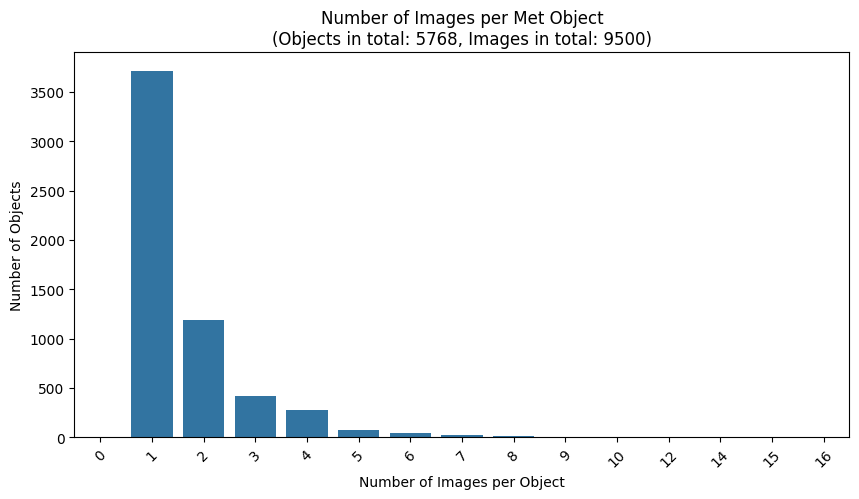

In [ ]:
image_count_freq = image_counts_df["Image Count"].value_counts().sort_index()

plt.figure(figsize=(10, 5))
sns.barplot(x=image_count_freq.index, y=image_count_freq.values)

plt.xlabel("Number of Images per Object")
plt.ylabel("Number of Objects")
plt.title("Number of Images per Met Object\n(Objects in total: 5768, Images in total: 9500)")
plt.xticks(rotation=45)
plt.show()

#### Replace the HTTPS errors with real descriptions  
When downloading the descriptions, there are 7 objects withe errors:  
HTTPSConnectionPool(host='www.metmuseum.org', port=443): Read timed out. (read timeout=10)

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
met_metadata = pd.read_csv('/content/drive/My Drive/master_thesis_project/met_metadata.csv', low_memory=False)
met_metadata.head()

,Object Number,Is Highlight,Is Timeline Work,Is Public Domain,Object ID,Gallery Number,Department,AccessionYear,Object Name,Title,...,Classification,Rights and Reproduction,Link Resource,Object Wikidata URL,Metadata Date,Repository,Tags,Tags AAT URL,Tags Wikidata URL,Description
0,74.51.3631,False,False,True,239585,171.0,Greek and Roman Art,1874.0,Pendant in the form of a vase,Pendant in the form of a vase,...,Gold and Silver,NaN,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,Gold pendant in the form of a vase.
1,74.51.1,False,False,True,239586,NaN,Greek and Roman Art,1874.0,Bead,Glass bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,"Translucent deep purple, appearing black; trai..."
2,74.51.3,False,False,True,239588,NaN,Greek and Roman Art,1874.0,Bead,Glass eye bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,Stratified double eye bead; two sets of four e...
3,74.51.8,False,False,True,239593,NaN,Greek and Roman Art,1874.0,Bead,Glass bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,"Uncertain color, probably translucent deep pur..."
4,74.51.11,False,False,True,239596,NaN,Greek and Roman Art,1874.0,Bead,Glass bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa..."


In [ ]:
# Verify whether the Object IDs are same as the ones with error while running the extract_object_descriptions function
for index, desc in enumerate(met_metadata["Description"]):
    if "error" in str(desc).lower():  # Ensure desc is a string
        print(met_metadata.loc[index, "Object ID"])

242406
242407
246617
247343
248789
251177
330036


In [ ]:
desc_to_replace = {
    "242406": "The sphinxes of this gravestone, while modeled on Classical Greek prototypes, also reveal an Egyptian influence with their pose of hind legs tucked under their bodies. During the Archaic and the Classical periods, pairs of opposing sphinxes were common on funerary monuments but also may appear as guardians of heroons or shrines.",
    "242407": "The relief comes from the top of a funerary stele, on which the seated sphinxes acted as guardians watching over the tomb.",
    "246617": "Decorated with punctured dots.",
    "247343": "Many traces of paint remain on this sphinx: pale blue on the wings and the eyes, red on the lips, and gold on the fillet.",
    "248789": "The handle is in the form of two youths carrying a dead companion.",
    "251177": "This oval-shaped container has solid-cast feet, each of which terminates in a depiction of a comic theater mask, an unusual subject for cista feet. They may show the influence of Greek New Comedy playwrights such as Menander. A solid-cast figure of a nude woman doing a back-bend serves as the handle.",
    "330036": "Originally, this bronze figure may have belonged to a cista (bronze or wooden toiletries box). Fashioned in hammered bronze or wood sheathed in bronze or silver, and frequently adorned with solid cast figures, these vessels were expertly crafted by master bronze smiths and attest to the significant technical achievements of Etruscan artisans."
}

In [ ]:
# Convert Object IDs to strings if they are not already
met_metadata["Object ID"] = met_metadata["Object ID"].astype(str)

# Replace descriptions where Object ID matches
met_metadata["Description"] = met_metadata["Object ID"].apply(lambda x: desc_to_replace.get(x, met_metadata.loc[met_metadata["Object ID"] == x, "Description"].values[0]))

# Verify changes
met_metadata.loc[met_metadata["Object ID"].isin(desc_to_replace.keys()), ["Object ID", "Description"]]

,Object ID,Description
1152,242406,"The sphinxes of this gravestone, while modeled..."
1153,242407,The relief comes from the top of a funerary st...
2445,246617,Decorated with punctured dots.
2750,247343,Many traces of paint remain on this sphinx: pa...
3278,248789,The handle is in the form of two youths carryi...
3795,251177,This oval-shaped container has solid-cast feet...
5693,330036,"Originally, this bronze figure may have belong..."


In [ ]:
csv_path = "/content/drive/MyDrive/master_thesis_project/met_metadata.csv"
met_metadata.to_csv(csv_path, index=False)

## The Archäologische Sammlung UZH Data

### Filter object ids

#### Greek + Roman
Extrac all the object ids of Greek (589) and Roman (73) artifacts withourt any filtering

In [ ]:
import requests
import json
from google.colab import drive
from tqdm import tqdm
import re

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def extract_object_ids(url):
    response = requests.get(url)

    if response.status_code == 200:
        data = response.json()

        # Extract object IDs
        object_ids = [obj["oid"] for obj in data['response']['docs'] if "oid" in obj]

        print(f"Number of objects found: {len(object_ids)}")
        return object_ids
    else:
        print(f"Failed to fetch data. Status code: {response.status_code}")

In [ ]:
uzh_greek_url = f"https://archaeologische-sammlung-uzh.zetcom.net/solr/published/select?fl=oid,score&fq=culture_node_de_ss:(76459%2076495)&fq=type:Object&q=*:*&rows=589&sort=title_de_sml%20asc&start=0"

uzh_greek_ids = extract_object_ids(uzh_greek_url)

Number of objects found: 589


In [ ]:
uzh_roman_url = f"https://archaeologische-sammlung-uzh.zetcom.net/solr/published/select?fl=oid,score&fq=culture_node_en_ss:(76548)&fq=type:Object&q=*:*&rows=73&sort=title_en_sml%20asc&start=0"

uzh_roman_ids = extract_object_ids(uzh_roman_url)

Number of objects found: 73


In [ ]:
uzh_greek_roman_ids = uzh_greek_ids + uzh_roman_ids

In [ ]:
# A same object appears in both uzh_greek_ids and uzh_roman_ids
print(len(uzh_greek_roman_ids))
print(len(set(uzh_greek_roman_ids)))

662
661


In [ ]:
# find the object that appears in both uzh_greek_ids and uzh_roman_ids
for id in uzh_roman_ids:
  if id in uzh_greek_ids:
    print(id)

1665


#### Greek + Roman + date

In [ ]:
def filter_objects_by_date(object_ids, base_url, headers):
    valid_ids = set()
    invalid_ids = set()
    object_ids = set(object_ids)

    for id in tqdm(object_ids, desc="Filtering objects by date"):
        object_url = f"{base_url}{id}.json"
        response = requests.get(object_url, headers=headers)

        if response.status_code == 200:
            data = response.json()

            # Extract date information
            date_info = data.get("pageProps", {}).get("data", {}).get("item", {}).get("ObjDateGrp", [])

            matched = False

            for d in date_info:
                date_text = d.get("ObjDateTxt", "")

                if "v. Chr." in date_text:
                    # Match century ranges, format 1 (e.g., "Spätes 4. – frühes 3. Jh. v. Chr.")
                    match_century_range_1 = re.search(r"(\d+)\.?\s*–\s*[^\d]*?(\d+)\.?\s*Jhs?\.?\s*v\.\s*Chr\.", date_text)
                    if match_century_range_1:
                        first_century = int(match_century_range_1.group(1))
                        second_century = int(match_century_range_1.group(2))
                        if 1 <= first_century <= 10 or 1 <= second_century <= 10:
                            valid_ids.add(id)
                            matched = True

                    # Match century ranges, format 2 (e.g., "7. Jh. v. Chr. – 6. Jh. v. Chr.")
                    # match_century_range_2 = re.search(r"(\d+)\.?\s*Jh\.?\s*v\.\s*Chr\.\s*–\s*(\d+)\.?\s*Jh\.?\s*v\.\s*Chr\.", date_text)
                    # Match a century range (e.g., "7. Jh. v. Chr. – 6. Jh. v. Chr." or "7 v. Chr. – 79 n. Chr.")
                    match_century_range_2 = re.search(r"(\d+)\.?\s*(Jh\.\s*)?v\.\s*Chr\.\s*–\s*(\d+)\.?\s*(Jh\.\s*)?(v\.|n\.)\s*Chr\.", date_text)
                    if match_century_range_2:
                        start_century = int(match_century_range_2.group(1))
                        end_century = int(match_century_range_2.group(3))
                        if 1 <= start_century <= 10 or 1 <= end_century <= 10:
                            valid_ids.add(id)
                            matched = True

                    # Match a century (e.g., "4. Jh. v. Chr.")
                    match_century = re.search(r"(\d+)\.?\s*Jhs?\.\s*v\.\s*Chr\.", date_text)
                    if match_century:
                        century = int(match_century.group(1))
                        if 1 <= century <= 10:
                            valid_ids.add(id)
                            matched = True

                    # Match year ranges (e.g., "620 – 600 v. Chr.")
                    match_year_range = re.search(r"(\d+)\s*–\s*(\d+)\s*v\.\s*Chr\.", date_text)
                    if match_year_range:
                        start_year, end_year = -int(match_year_range.group(1)), -int(match_year_range.group(2))
                        if end_year >= -1000 and start_year <= 1:
                            valid_ids.add(id)
                            matched = True

                    # Match a year (e.g., "Um 430 v. Chr." or "Ca. 530 v. Chr.")
                    # match_year = re.search(r"(Ca\.\s*|Um\s*)(\d+)\s*v\.\s*Chr\.", date_text)
                    # Match a year (e.g., "Um 430 v. Chr." or "um 430 v. Chr." or "430 v. Chr." or "Ca. 530 v. Chr.")
                    match_year = re.search(r"(Ca\.\s*|Um\s*)?(\d+)\s*v\.\s*Chr\.", date_text, re.IGNORECASE)
                    if match_year:
                        year = -int(match_year.group(2))
                        if -1000 <= year <= -1:
                            valid_ids.add(id)
                            matched = True

            if not matched:
                invalid_ids.add(id)

    # Find IDs that were not processed
    unprocessed_ids = object_ids - valid_ids - invalid_ids
    print(f"Unprocessed IDs: {unprocessed_ids}")

    return valid_ids, invalid_ids

In [ ]:
# Base URL for the artifact metadata
base_url = "https://archaeologische-sammlung-uzh.zetcom.net/_next/data/o48uyH7AWr2bgeAa2mCfB/de/collection/item/"

# Request headers
headers = {
    "User-Agent": "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.0 Safari/605.1.15",
    "Accept": "*/*",
    "Accept-Encoding": "gzip, deflate, br",
    "Accept-Language": "en-GB,en;q=0.9",
    "Connection": "keep-alive",
    "Host": "archaeologische-sammlung-uzh.zetcom.net",
    "Referer": "https://archaeologische-sammlung-uzh.zetcom.net/de/collection/?f=Greek-Magna-Grecia&om=1&v=2",
}

valid_ids, invalid_ids = filter_objects_by_date(uzh_greek_roman_ids, base_url, headers)

Filtering objects by date: 100%|██████████| 661/661 [04:11<00:00,  2.63it/s]

Unprocessed IDs: set()


In [ ]:
print(f"Number of valid ids: {len(valid_ids)}")
print(f"Number of invalid ids: {len(invalid_ids)}")
print("Number of processed objects:", len(valid_ids) + len(invalid_ids)) # see whether the all the objects are processed
print("The invalid ids are:\n", invalid_ids)

Number of valid ids: 582
Number of invalid ids: 79
Number of processed objects: 661
The invalid ids are:
 {'6801', '7859', '7109', '6193', '8338', '3513', '6622', '6965', '3983', '7160', '3854', '3855', '8691', '5224', '5846', '3503', '6923', '3851', '2865', '3560', '6327', '7077', '8181', '5662', '35974', '3448', '4662', '3609', '7738', '7582', '2837', '7242', '3997', '5918', '5092', '3978', '6007', '5558', '5221', '4593', '4574', '6678', '3587', '7933', '7520', '4327', '5709', '7378', '2761', '5021', '4045', '8371', '7692', '7331', '6770', '6373', '8242', '8584', '6340', '5871', '171', '5609', '7888', '7456', '6462', '35968', '7115', '6500', '7203', '3379', '8671', '6897', '3004', '5922', '4301', '3038', '7995', '3124', '8804'}


#### Greek + Roman + Date + Non-fragment

In [ ]:
def filter_objects_by_fragment(object_ids, base_url, headers):

    non_fragments_ids = []

    for id in tqdm(object_ids, desc="Filtering objects by non-fragment"):
        object_url = f"{base_url}{id}.json"
        response = requests.get(object_url, headers=headers)

        if response.status_code == 200:
            data = response.json()

            # Extract object title, because the key word "fragment" is contained in the object title
            title = data.get("pageProps", {}).get("data", {}).get("item", {}).get("ObjTitleTxt", "").lower()

            if "fragment" not in title:
                non_fragments_ids.append(id)

    return non_fragments_ids

In [ ]:
uzh_greek_roman_date_ids = list(valid_ids)

base_url = "https://archaeologische-sammlung-uzh.zetcom.net/_next/data/o48uyH7AWr2bgeAa2mCfB/de/collection/item/"

headers = {
    "User-Agent": "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.0 Safari/605.1.15",
    "Accept": "*/*",
    "Accept-Encoding": "gzip, deflate, br",
    "Accept-Language": "en-GB,en;q=0.9",
    "Connection": "keep-alive",
    "Host": "archaeologische-sammlung-uzh.zetcom.net",
    "Referer": "https://archaeologische-sammlung-uzh.zetcom.net/de/collection/?f=Greek-Magna-Grecia&om=1&v=2",
}

In [ ]:
uzh_greek_roman_date_nonfragment_ids = filter_objects_by_fragment(uzh_greek_roman_date_ids, base_url, headers)

Filtering objects by non-fragment: 100%|██████████| 582/582 [03:40<00:00,  2.64it/s]


In [ ]:
print(f"Found {len(uzh_greek_roman_date_nonfragment_ids)} non-fragments between 1000 B.C. and 1 A.D.")

Found 495 non-fragments between 1000 B.C. and 1 A.D.


### Extract metadata

#### Extract metadata and save them to google drive

In [ ]:
def extract_metadata(base_url, object_ids, headers, output_file):
    """Fetch metadata and save as a JSON file."""

    all_data = []

    for object_id in tqdm(object_ids, desc="Fetching metadata for artifacts"):
        object_url = f"{base_url}{object_id}.json"
        response = requests.get(object_url, headers=headers)

        if response.status_code == 200:
            data = response.json()
            all_data.append(data)
        else:
            print(f"Failed to fetch data for artifact ID {object_id}")

    # Save all collected data to the output file
    with open(output_file, "w", encoding="utf-8") as f:
        json.dump(all_data, f, indent=4, ensure_ascii=False)  # ensure_ascii=False keeps German characters without replacing them into unicode

    print(f"Data saved to: {output_file}")

In [ ]:
base_url = "https://archaeologische-sammlung-uzh.zetcom.net/_next/data/o48uyH7AWr2bgeAa2mCfB/de/collection/item/" # this part 'o48uyH7AWr2bgeAa2mCfB' is dynamic and keeps changing on a regular basis, seems like 24 hours per change

headers = {
    "User-Agent": "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.0 Safari/605.1.15",
    "Accept": "*/*",
    "Accept-Encoding": "gzip, deflate, br",
    "Accept-Language": "en-GB,en;q=0.9",
    "Connection": "keep-alive",
    "Host": "archaeologische-sammlung-uzh.zetcom.net",
    "Referer": "https://archaeologische-sammlung-uzh.zetcom.net/de/collection/?f=Greek-Magna-Grecia&om=1&v=2",
}

# Save to Google Drive
output_path = "/content/drive/My Drive/master_thesis_project/uzh_metadata.json"
extract_metadata(base_url, uzh_greek_roman_date_nonfragment_ids, headers, output_path)

Fetching metadata for artifacts: 100%|██████████| 495/495 [03:09<00:00,  2.62it/s]


Data saved to: /content/drive/My Drive/uzh_artifacts.json


#### Count description length

##### Count description length by characters

In [1]:
import pandas as pd

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
uzh_metadata_file = "/content/drive/My Drive/master_thesis_project/uzh_metadata.json"

In [3]:
uzh_metadata_json = pd.read_json(uzh_metadata_file)

In [4]:
uzh_metadata_json.head(1)  # Check the metadata content of the first object

,pageProps,__N_SSG
0,"{'lng': 'de', 'data': {'ids': [], 'queryParams...",True


In [5]:
uzh_metadata_json.keys()  # Check available keys

Index(['pageProps', '__N_SSG'], dtype='object')

In [ ]:
uzh_metadata_json["pageProps"].keys()  # Check available keys inside 'pageProps'

RangeIndex(start=0, stop=495, step=1)

In [6]:
uzh_metadata_json["pageProps"].head()

,pageProps
0,"{'lng': 'de', 'data': {'ids': [], 'queryParams..."
1,"{'lng': 'de', 'data': {'ids': [], 'queryParams..."
2,"{'lng': 'de', 'data': {'ids': [], 'queryParams..."
3,"{'lng': 'de', 'data': {'ids': [], 'queryParams..."
4,"{'lng': 'de', 'data': {'ids': [], 'queryParams..."


In [7]:
uzh_metadata_df = pd.read_json(uzh_metadata_file)
uzh_metadata_step1 = uzh_metadata_df["pageProps"].apply(lambda x: x["data"])
uzh_metadata_step1.head()

,pageProps
0,"{'ids': [], 'queryParams': {}, 'item': {'ObjIn..."
1,"{'ids': [], 'queryParams': {}, 'item': {'ObjIn..."
2,"{'ids': [], 'queryParams': {}, 'item': {'ObjIn..."
3,"{'ids': [], 'queryParams': {}, 'item': {'ObjIn..."
4,"{'ids': [], 'queryParams': {}, 'item': {'ObjIn..."


In [8]:
uzh_metadata_step2 = uzh_metadata_step1.apply(pd.Series)
uzh_metadata_step2.head()

,ids,queryParams,item,lng
0,[],{},"{'ObjInventoryNumberTxt': '3960', 'ObjConditio...",de
1,[],{},"{'ObjInventoryNumberTxt': '2502', 'ObjConditio...",de
2,[],{},"{'ObjInventoryNumberTxt': '2730', 'ObjConditio...",de
3,[],{},"{'ObjInventoryNumberTxt': '2734', 'ObjConditio...",de
4,[],{},"{'ObjInventoryNumberTxt': '2753', 'ObjConditio...",de


In [9]:
uzh_metadata_step3 = uzh_metadata_step2["item"].apply(pd.Series)
uzh_metadata_step3.head()

,ObjInventoryNumberTxt,ObjConditionNoteTxt,ObjConservationTxt,ObjFindSpotFilterTxt,ObjTitleTxt,ObjDescriptionTxt,ObjBriefDescriptionTxt,ObjObjectARef,ObjInventoryNumberLenderTxt,DefaultThumbnail,...,ObjMaterialTechniqueTxt,__lastModified,ObjCategoryVoc,ObjProductionSiteTxt,ObjPersonRef,DefaultImage,Id,ObjExhibitionRef,Carousel,ObjInscriptionTxt
0,3960,Gefäss ungebrochen. Mündung aussen abgeschliff...,,,"Aryballos, frühprotokorinthisch",Aryballos mit eiförmigem Körper auf kleinem Ri...,"Aryballos, Silhouettenmalerei mit Aussparungen",{'Items': [{'Multimedia': [{'thumb': 'multimed...,,multimedia/1/multimedia-73311.small.jpg,...,"Ton, gebrannt",2023-09-26 13:50:39.489,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/1/multimedia-73311.large.jpg,6213,{'Items': [{'LinkLabelTxt_en': 'Dauerausstellu...,[{'thumb': 'multimedia/1/multimedia-73311.smal...,NaN
1,2502,Aus zahlreichen Fragmenten zusammengesetzt. Di...,,Unbekannt,"Pelike der Eumenides Gruppe, rotfigurig, attis...",Die Mündung ist innen gefirnisst (Glanzton). A...,Pelike,"{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/4/multimedia-158074.small.jpg,...,"Ton, gebrannt",2023-09-26 15:45:07.850,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,{'Items': [{'LinkLabelTxt_en': 'Cannot invoke ...,multimedia/4/multimedia-158074.large.jpg,7190,{'Items': [{'LinkLabelTxt_en': 'Dauerausstellu...,[{'thumb': 'multimedia/4/multimedia-158074.sma...,NaN
2,2730,Der Henkel und ein Teil des Fussringes fehlen....,,,"Lekythos, Glanzton / Schwarzfirnis, kampanisch...",Die Mündung ist innen gefirnisst (Glanzton). A...,Lekythos,"{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/7/multimedia-158267.small.jpg,...,"Ton, gebrannt",2023-09-26 15:51:53.184,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/7/multimedia-158267.large.jpg,7474,"{'Items': [], 'ModuleTxt': 'Exhibition', 'Tota...",[{'thumb': 'multimedia/7/multimedia-158267.sma...,NaN
3,2734,Ungebrochen. Der Fuss ist bestossen.,,,"Balsamarium / Unguentarium, Glanzton / Schwarz...",Die Mündung ist innen gefirnisst (Glanzton). D...,"Balsamarium, Unguentarium","{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/5/multimedia-158295.small.jpg,...,"Ton, gebrannt",2023-09-26 13:49:01.266,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/5/multimedia-158295.large.jpg,6160,"{'Items': [], 'ModuleTxt': 'Exhibition', 'Tota...",[{'thumb': 'multimedia/5/multimedia-158295.sma...,NaN
4,2753,Der grösste Teil des Henkels fehlt. Sonst unge...,,Unbekannt,"Einhenkliger Napf (one-handler), Glanzton / Sc...",Das ganze Gefäss ist mit Firnis / Glanzton übe...,"Napf, one-handler","{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/7/multimedia-159177.small.jpg,...,"Ton, gebrannt",2025-03-10 12:33:41.462,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/7/multimedia-159177.large.jpg,5430,"{'Items': [], 'ModuleTxt': 'Exhibition', 'Tota...",[{'thumb': 'multimedia/7/multimedia-159177.sma...,NaN


In [33]:
uzh_metadata_step3.columns

Index(['ObjInventoryNumberTxt', 'ObjConditionNoteTxt', 'ObjConservationTxt',
       'ObjFindSpotFilterTxt', 'ObjTitleTxt', 'ObjDescriptionTxt',
       'ObjBriefDescriptionTxt', 'ObjObjectARef',
       'ObjInventoryNumberLenderTxt', 'DefaultThumbnail', 'ObjFindSpotTxt_en',
       'ObjGypsumPlaceTxt', 'ObjInventoryNumberLenderTxt_en',
       'ObjOnDisplayBoo', 'ObjConferaturTxt', 'ObjProductionSiteTxt_en',
       'ObjDateGrp', 'ObjCurrentLocation', 'ObjFindSpotFilterTxt_en',
       'ObjCultureCircleGrp', 'ObjGypsumMaterialTxt', 'ObjBibliographyTxt',
       'ObjGypsumOriginalTxt', 'ObjGypsumConditionTxt', 'ObjConferaturTxt_en',
       'Multimedia', 'ObjTypeVoc', 'ObjCurrentLocation_en', 'ObjFindSpotTxt',
       'ObjMultimediaRef', 'ObjObjectBRef', 'ObjBibliographyTxt_en',
       'ObjTechniqueVoc', 'ObjDimensionTxt', 'ObjDateSortTxt',
       'ObjMaterialTechniqueTxt', '__lastModified', 'ObjCategoryVoc',
       'ObjProductionSiteTxt', 'ObjPersonRef', 'DefaultImage', 'Id',
       'ObjExhibit

In [10]:
uzh_obj_desc = pd.DataFrame()

uzh_obj_desc["FullDescription"] = uzh_metadata_step3['ObjDescriptionTxt']
uzh_obj_desc["ObjBriefDescriptionTxt"] = uzh_metadata_step3['ObjBriefDescriptionTxt']

# Compute description lengths
uzh_obj_desc["FullDescLength"] = uzh_obj_desc["FullDescription"].str.len()
uzh_obj_desc["BriefDescLength"] = uzh_obj_desc["ObjBriefDescriptionTxt"].str.len()

# Display summary
uzh_obj_desc[["FullDescLength", "BriefDescLength"]].describe().astype(int)

,FullDescLength,BriefDescLength
count,495,494
mean,939,34
std,892,27
min,221,4
25%,478,10
50%,696,27
75%,1046,54
max,9686,139


In [11]:
# Create the DataFrame with Id, FullDescription and the length of FullDescription
uzh_id_desc = pd.DataFrame({
    "Id": uzh_metadata_step3["Id"],
    "FullDescription": uzh_metadata_step3["ObjDescriptionTxt"],
    "FullDescLength": uzh_metadata_step3["ObjDescriptionTxt"].str.len()
})

In [ ]:
uzh_id_desc.head()

,Id,FullDescription,FullDescLength
0,6213,Aryballos mit eiförmigem Körper auf kleinem Ri...,1062
1,7190,Die Mündung ist innen gefirnisst (Glanzton). A...,674
2,7474,Die Mündung ist innen gefirnisst (Glanzton). A...,494
3,6160,Die Mündung ist innen gefirnisst (Glanzton). D...,424
4,5430,Das ganze Gefäss ist mit Firnis / Glanzton übe...,393


In [12]:
# Find the row with the longest description
max_length_row = uzh_id_desc.loc[uzh_id_desc['FullDescLength'].idxmax()]

print(f"The longest full description of UZH object {max_length_row['Id']} contains {max_length_row['FullDescLength']} characters:\n{max_length_row['FullDescription']}")

The longest full description of UZH object 23983 contains 9686 characters:
Typologisch gehört das Fragment zu den aus zwei schmalen, rechteckigen und figürlich verzierten Stützen sowie einer flachen rechteckigen Deckplatte bestehenden Prunktischen aus Marmor.

Die Unterseite der Tischstütze ist grob abgeflacht; die Spuren des Spitzeisens sind deutlich erkennbar. Die Löwenklaue und die kniende Figur ruhen auf einer plinthenartigen, oben eher unregelmässig begrenzten und nach oben leicht abgeschrägten Standfläche, die auf den Längsseiten nur grob geglättet ist; sie weist hier neben Pickspuren auch deutliche Spuren eines Zahneisens auf. Auf den beiden Schmalseiten ist sie sorgfältiger abgeflacht. 
Die Stütze endet auf der einen Schmalseite in der für zahlreiche entsprechende Tischstützen kanonischen Weise in einer grossformatigen Löwenklaue, die plastisch eher summarisch angelegt ist und hinten kantig endet; ihre Oberfläche weist deutliche ‚Raspelspuren‘ auf. Auf der gegenüberliegenden, g

In [13]:
# Find the row with the shortest description
min_length_row = uzh_id_desc.loc[uzh_id_desc['FullDescLength'].idxmin()]

print(f"The shortest full description of UZH object {min_length_row['Id']} contains {min_length_row['FullDescLength']} characters:\n{min_length_row['FullDescription']}")

The shortest full description of UZH object 6268 contains 221 characters:
Vorderer, abgesägter Teil eines Stirnziegel (Antefix) mit Gorgoneion.

Hellgrüner, leicht gemagerter Ton.

Nach: Bloesch 1974, 30 Nr. 179 Taf. 28.
Zur Kontextualisierung in der Literatur: Bloesch 1974, 30 Nr. 179 Taf. 28.


In [14]:
average_length = uzh_obj_desc['FullDescLength'].mean()

print(f"The average full description length of UZH objects is {average_length:.2f} characters.")

The average full description length of UZH objects is 939.05 characters.


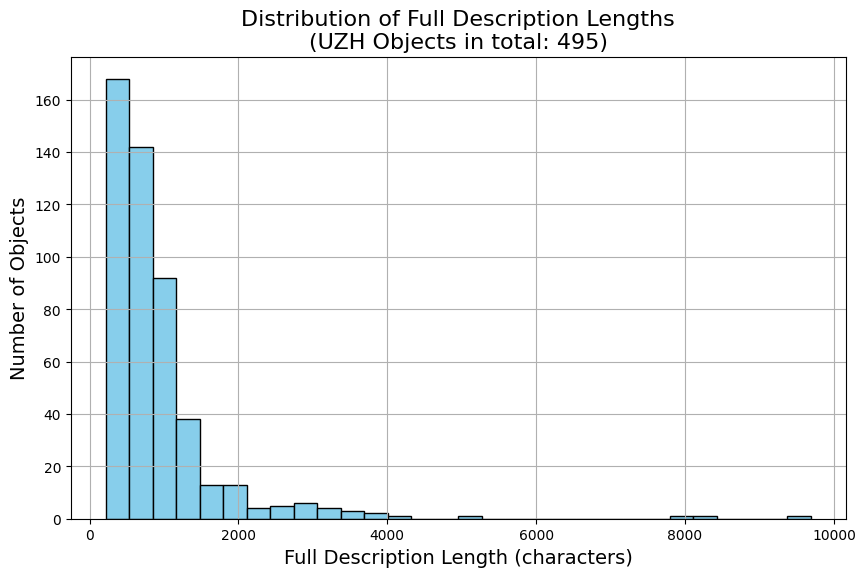

In [15]:
import matplotlib.pyplot as plt

# Plot histogram of Full Description Lengths
plt.figure(figsize=(10, 6))
plt.hist(uzh_obj_desc['FullDescLength'], bins=30, color='skyblue', edgecolor='black')

plt.title('Distribution of Full Description Lengths\n(UZH Objects in total: 495)', fontsize=16)
plt.xlabel('Full Description Length (characters)', fontsize=14)
plt.ylabel('Number of Objects', fontsize=14)

plt.grid(True)
plt.show()

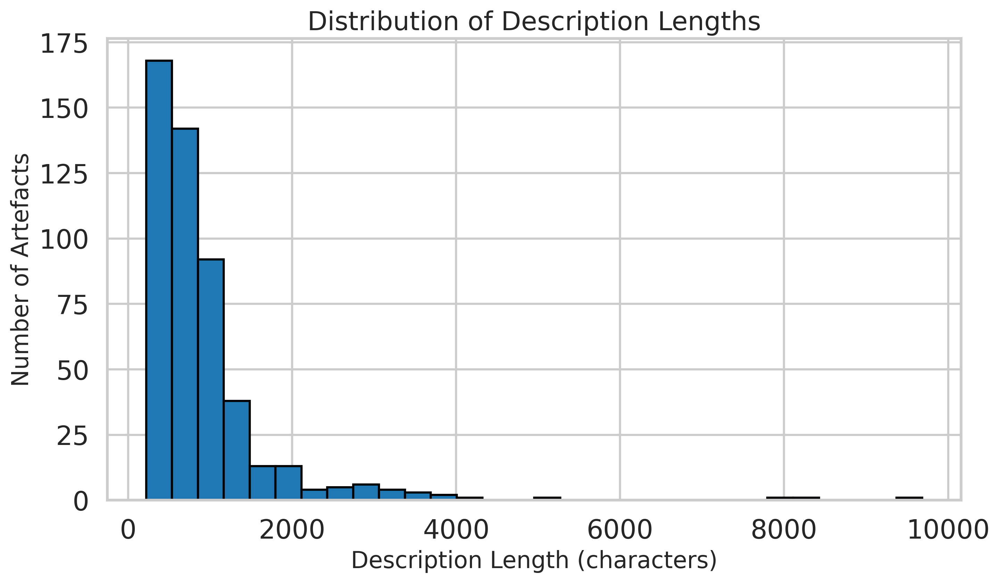

In [32]:
# print in a better way
import matplotlib.pyplot as plt
import os

plt.figure(figsize=(10, 6), dpi=300)

plt.hist(
    uzh_obj_desc['FullDescLength'],
    bins=30,
    edgecolor='black'
)

plt.title('Distribution of Description Lengths', fontsize=18)
plt.xlabel('Description Length (characters)', fontsize=16)
plt.ylabel('Number of Artefacts', fontsize=16)

plt.tight_layout()

# Save BEFORE show
save_dir = "/content/drive/My Drive/master_thesis_project/images_for_thesis"
os.makedirs(save_dir, exist_ok=True)
plt.savefig(f"{save_dir}/uzh_description_length_distribution.png", dpi=300)

plt.show()

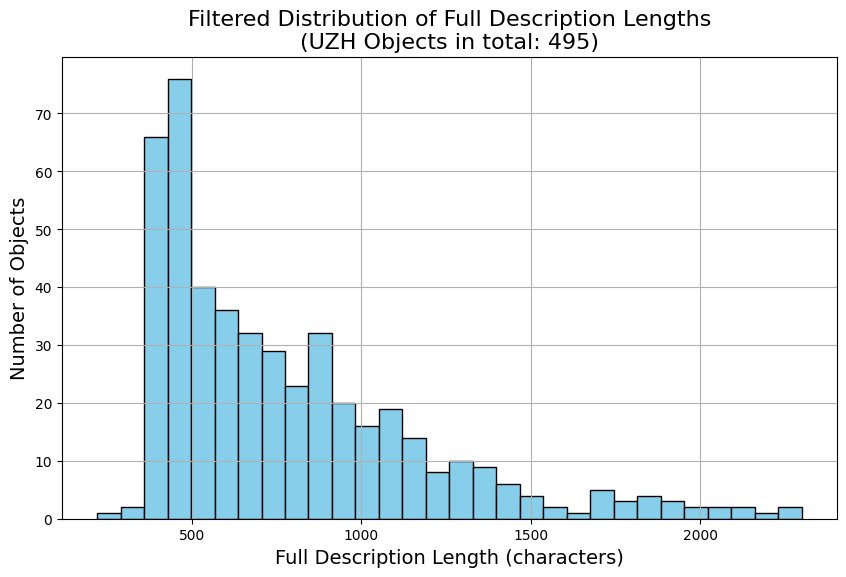

In [ ]:
import numpy as np

# Define upper limit (e.g., 95th percentile)
upper_limit = np.percentile(uzh_obj_desc['FullDescLength'], 95)

# Filter data
filtered_data = uzh_obj_desc[uzh_obj_desc['FullDescLength'] <= upper_limit]

# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(filtered_data['FullDescLength'], bins=30, color='skyblue', edgecolor='black')

plt.title('Filtered Distribution of Full Description Lengths\n(UZH Objects in total: 495)', fontsize=16)
plt.xlabel('Full Description Length (characters)', fontsize=14)
plt.ylabel('Number of Objects', fontsize=14)
plt.grid(True)
plt.show()

##### count description length by tokens

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from transformers import AutoTokenizer

In [ ]:
uzh_metadata_step3.head()

,ObjInventoryNumberTxt,ObjConditionNoteTxt,ObjConservationTxt,ObjFindSpotFilterTxt,ObjTitleTxt,ObjDescriptionTxt,ObjBriefDescriptionTxt,ObjObjectARef,ObjInventoryNumberLenderTxt,DefaultThumbnail,...,ObjMaterialTechniqueTxt,__lastModified,ObjCategoryVoc,ObjProductionSiteTxt,ObjPersonRef,DefaultImage,Id,ObjExhibitionRef,Carousel,ObjInscriptionTxt
0,3960,Gefäss ungebrochen. Mündung aussen abgeschliff...,,,"Aryballos, frühprotokorinthisch",Aryballos mit eiförmigem Körper auf kleinem Ri...,"Aryballos, Silhouettenmalerei mit Aussparungen",{'Items': [{'Multimedia': [{'thumb': 'multimed...,,multimedia/1/multimedia-73311.small.jpg,...,"Ton, gebrannt",2023-09-26 13:50:39.489,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/1/multimedia-73311.large.jpg,6213,{'Items': [{'LinkLabelTxt_en': 'Dauerausstellu...,[{'thumb': 'multimedia/1/multimedia-73311.smal...,NaN
1,2502,Aus zahlreichen Fragmenten zusammengesetzt. Di...,,Unbekannt,"Pelike der Eumenides Gruppe, rotfigurig, attis...",Die Mündung ist innen gefirnisst (Glanzton). A...,Pelike,"{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/4/multimedia-158074.small.jpg,...,"Ton, gebrannt",2023-09-26 15:45:07.850,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,{'Items': [{'LinkLabelTxt_en': 'Cannot invoke ...,multimedia/4/multimedia-158074.large.jpg,7190,{'Items': [{'LinkLabelTxt_en': 'Dauerausstellu...,[{'thumb': 'multimedia/4/multimedia-158074.sma...,NaN
2,2730,Der Henkel und ein Teil des Fussringes fehlen....,,,"Lekythos, Glanzton / Schwarzfirnis, kampanisch...",Die Mündung ist innen gefirnisst (Glanzton). A...,Lekythos,"{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/7/multimedia-158267.small.jpg,...,"Ton, gebrannt",2023-09-26 15:51:53.184,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/7/multimedia-158267.large.jpg,7474,"{'Items': [], 'ModuleTxt': 'Exhibition', 'Tota...",[{'thumb': 'multimedia/7/multimedia-158267.sma...,NaN
3,2734,Ungebrochen. Der Fuss ist bestossen.,,,"Balsamarium / Unguentarium, Glanzton / Schwarz...",Die Mündung ist innen gefirnisst (Glanzton). D...,"Balsamarium, Unguentarium","{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/5/multimedia-158295.small.jpg,...,"Ton, gebrannt",2023-09-26 13:49:01.266,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/5/multimedia-158295.large.jpg,6160,"{'Items': [], 'ModuleTxt': 'Exhibition', 'Tota...",[{'thumb': 'multimedia/5/multimedia-158295.sma...,NaN
4,2753,Der grösste Teil des Henkels fehlt. Sonst unge...,,Unbekannt,"Einhenkliger Napf (one-handler), Glanzton / Sc...",Das ganze Gefäss ist mit Firnis / Glanzton übe...,"Napf, one-handler","{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/7/multimedia-159177.small.jpg,...,"Ton, gebrannt",2025-03-10 12:33:41.462,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/7/multimedia-159177.large.jpg,5430,"{'Items': [], 'ModuleTxt': 'Exhibition', 'Tota...",[{'thumb': 'multimedia/7/multimedia-159177.sma...,NaN


In [ ]:
# Create the DataFrame with Id and FullDescription
uzh_id_desc = pd.DataFrame({
    "Id": uzh_metadata_step3["Id"],
    "FullDescription": uzh_metadata_step3["ObjDescriptionTxt"]
})

In [ ]:
uzh_id_desc.head()

,Id,FullDescription
0,6213,Aryballos mit eiförmigem Körper auf kleinem Ri...
1,7190,Die Mündung ist innen gefirnisst (Glanzton). A...
2,7474,Die Mündung ist innen gefirnisst (Glanzton). A...
3,6160,Die Mündung ist innen gefirnisst (Glanzton). D...
4,5430,Das ganze Gefäss ist mit Firnis / Glanzton übe...


In [ ]:
# Compute statistics
def compute_stats(lengths):
    return {
        "min": np.min(lengths),
        "max": np.max(lengths),
        "mean": np.mean(lengths),
        "median": np.median(lengths)
    }

In [ ]:
bert_tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
bert_lengths = [
    len(bert_tokenizer.encode(desc))
    for desc in uzh_id_desc["FullDescription"]]

bert_stats = compute_stats(bert_lengths)

print("BERT Token Lengths Statistics:", bert_stats)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (1804 > 512). Running this sequence through the model will result in indexing errors


BERT Token Lengths Statistics: {'min': np.int64(86), 'max': np.int64(3365), 'mean': np.float64(338.32525252525255), 'median': np.float64(253.0)}


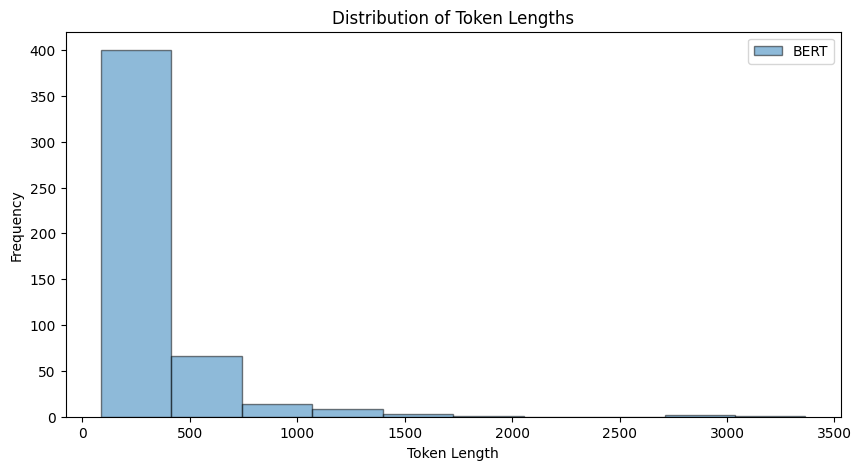

In [ ]:
# Visualization
plt.figure(figsize=(10, 5))
plt.hist(bert_lengths, bins=10, alpha=0.5, label="BERT", edgecolor='black')
plt.xlabel("Token Length")
plt.ylabel("Frequency")
plt.title("Distribution of Token Lengths")
plt.legend()
plt.show()

In [ ]:
# Compute token lengths
uzh_id_desc["token_length"] = uzh_id_desc["FullDescription"].apply(lambda x: len(bert_tokenizer.encode(x)))

# Find the longest and shortest descriptions based on token length
longest_row = uzh_id_desc.loc[uzh_id_desc["token_length"].idxmax()]
shortest_row = uzh_id_desc.loc[uzh_id_desc["token_length"].idxmin()]

longest_desc_id = longest_row["Id"]
longest_desc = longest_row["FullDescription"]
longest_token_length = longest_row["token_length"]

shortest_desc_id = shortest_row["Id"]
shortest_desc = shortest_row["FullDescription"]
shortest_token_length = shortest_row["token_length"]

# Print results
print(f"Longest description ID: {longest_desc_id}\nDescription: {longest_desc}\nToken Length: {longest_token_length}\n")
print(f"Shortest description ID: {shortest_desc_id}\nDescription: {shortest_desc}\nToken Length: {shortest_token_length}\n")

Longest description ID: 23983
Description: Typologisch gehört das Fragment zu den aus zwei schmalen, rechteckigen und figürlich verzierten Stützen sowie einer flachen rechteckigen Deckplatte bestehenden Prunktischen aus Marmor.

Die Unterseite der Tischstütze ist grob abgeflacht; die Spuren des Spitzeisens sind deutlich erkennbar. Die Löwenklaue und die kniende Figur ruhen auf einer plinthenartigen, oben eher unregelmässig begrenzten und nach oben leicht abgeschrägten Standfläche, die auf den Längsseiten nur grob geglättet ist; sie weist hier neben Pickspuren auch deutliche Spuren eines Zahneisens auf. Auf den beiden Schmalseiten ist sie sorgfältiger abgeflacht. 
Die Stütze endet auf der einen Schmalseite in der für zahlreiche entsprechende Tischstützen kanonischen Weise in einer grossformatigen Löwenklaue, die plastisch eher summarisch angelegt ist und hinten kantig endet; ihre Oberfläche weist deutliche ‚Raspelspuren‘ auf. Auf der gegenüberliegenden, geringfügig breiteren Schmalseite

### Download UZH images

#### Download UZH images and save them to google drive

In [ ]:
import requests
import os
from tqdm import tqdm

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def download_uzh_images(object_ids, object_base_url, image_base_url, image_dir, object_headers, image_headers):

    os.makedirs(image_dir, exist_ok=True)  # Ensure the directory exists, if not exist, this line creates one automatically

    for obj_id in tqdm(object_ids, desc="Downloading images"):

        object_url = f"{object_base_url}{obj_id}.json"
        response = requests.get(object_url, headers=object_headers)

        if response.status_code == 200:
            data = response.json()
            images = data.get("pageProps", {}).get("data", {}).get("item", {}).get("Carousel", [])

            if not images:
                print(f"No multimedia found for Object ID {obj_id}")

            for idx, img in enumerate(images):
                img_url = f'{image_base_url}{img.get("full")}'  # only download full images, ignore thumb images
                if img_url:
                    img_name = f"{obj_id}_image_{idx}.jpg"
                    img_path = os.path.join(image_dir, img_name)

                    img_response = requests.get(img_url, headers=image_headers, stream=True)

                    if img_response.status_code == 200:
                        with open(img_path, "wb") as img_file:
                            for chunk in img_response.iter_content(1024):
                                img_file.write(chunk)
                    else:
                        print(f"Failed to download image for Object ID {obj_id}, status code: {img_response.status_code}, image url: {img_url}")
                else:
                    print(f"No valid image found for object {obj_id}")
        else:
            print(f"Failed to fetch image data for object {obj_id}")

In [ ]:
object_base_url = "https://archaeologische-sammlung-uzh.zetcom.net/_next/data/o48uyH7AWr2bgeAa2mCfB/de/collection/item/" # this part 'o48uyH7AWr2bgeAa2mCfB' is dynamic and keeps changing on a regular basis, seems like 24 hours per change
imge_base_url = "https://archaeologische-sammlung-uzh.zetcom.net/"

object_headers = {
    "User-Agent": "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.0 Safari/605.1.15",
    "Accept": "*/*",
    "Accept-Encoding": "gzip, deflate, br",
    "Accept-Language": "en-GB,en;q=0.9",
    "Connection": "keep-alive",
    "Host": "archaeologische-sammlung-uzh.zetcom.net",
    "Referer": "https://archaeologische-sammlung-uzh.zetcom.net/de/collection/?f=Greek-Magna-Grecia&om=1&v=2",
}

image_headers = {
    "User-Agent": "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.0 Safari/605.1.15",
    "Accept": "image/webp,image/avif,image/jxl,image/heic,image/heic-sequence,video/*;q=0.8,image/png,image/svg+xml,image/*;q=0.8,*/*;q=0.5",
    "Accept-Encoding": "gzip, deflate, br",
    "Accept-Language": "en-GB,en;q=0.9",
    "Connection": "keep-alive",
    "Host": "archaeologische-sammlung-uzh.zetcom.net",
    "Referer": "https://archaeologische-sammlung-uzh.zetcom.net/de/collection/item/6137/",
    "Sec-Fetch-Dest": "image",
    "Sec-Fetch-Mode": "no-cors",
    "Sec-Fetch-Site": "same-origin"
}

# Directory to save images in Google Drive
image_dir = "/content/drive/MyDrive/master_thesis_project/uzh_images"

download_uzh_images(uzh_greek_roman_date_nonfragment_ids, object_base_url, imge_base_url, image_dir, object_headers, image_headers)

#### Count UZH Images

In [17]:
import pandas as pd
from tqdm import tqdm
import os
from collections import defaultdict

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [18]:
def count_images_per_object(image_folder):
    """Counts the number of images per object."""
    image_counts = defaultdict(int)

    for filename in os.listdir(image_folder):
        object_id = filename.split("_image_")[0]  # image file format: 2240_image_0, extract object ID
        image_counts[object_id] += 1

    # Convert to DataFrame
    image_counts_df = pd.DataFrame(image_counts.items(), columns=["Object ID", "Image Count"])

    return image_counts_df

In [19]:
image_dir = "/content/drive/MyDrive/master_thesis_project/uzh_images"
image_counts_df = count_images_per_object(image_dir)

image_counts_df.head(10)

,Object ID,Image Count
0,2240,36
1,5667,7
2,4375,10
3,6829,7
4,1866,23
5,64974,15
6,1903,21
7,6856,8
8,8907,4
9,7114,45


In [ ]:
print(f"Total number of objects: {image_counts_df.shape[0]}")

Total number of objects: 495


In [ ]:
print(f"Total number of UZH images: {image_counts_df['Image Count'].sum()}")
print(f"Average number of images per UZH object: {image_counts_df['Image Count'].mean()}")

Total number of UZH images: 4675
Average number of images per UZH object: 9.444444444444445


In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

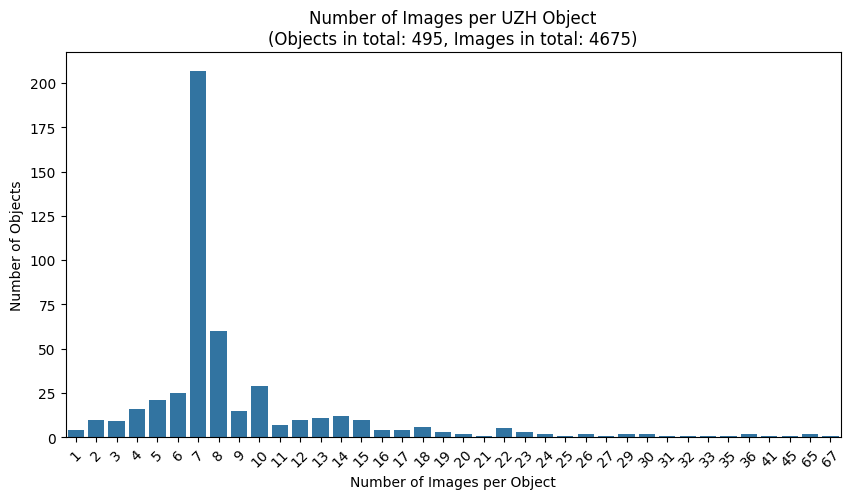

In [ ]:
image_count_freq = image_counts_df["Image Count"].value_counts().sort_index()

plt.figure(figsize=(10, 5))
sns.barplot(x=image_count_freq.index, y=image_count_freq.values)

plt.xlabel("Number of Images per Object")
plt.ylabel("Number of Objects")
plt.title("Number of Images per UZH Object\n(Objects in total: 495, Images in total: 4675)")
plt.xticks(rotation=45)
plt.show()

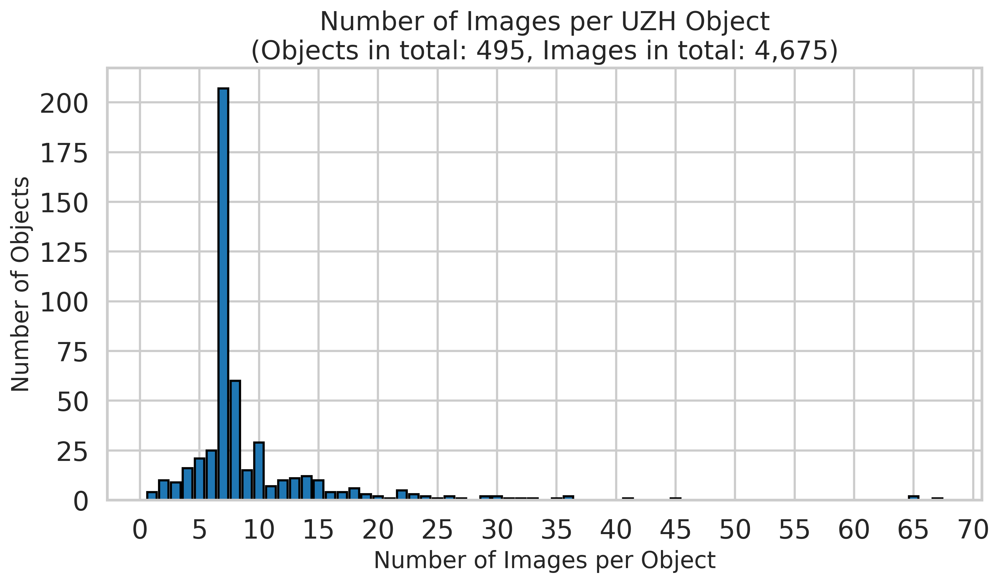

In [31]:
import matplotlib.pyplot as plt
import os
from matplotlib.ticker import MultipleLocator

# --- Prepare data ---
image_count_freq = image_counts_df["Image Count"].value_counts().sort_index()

# --- Create figure ---
plt.figure(figsize=(10, 6), dpi=300)

plt.bar(
    image_count_freq.index,
    image_count_freq.values,
    edgecolor='black'   # same as your histogram
)

plt.title('Number of Images per UZH Object\n(Objects in total: 495, Images in total: 4,675)', fontsize=18)
plt.xlabel('Number of Images per Object', fontsize=16)
plt.ylabel('Number of Objects', fontsize=16)

# --- Tick scale (no grid) ---
ax = plt.gca()
ax.xaxis.set_major_locator(MultipleLocator(5))    # horizontal scale: 5, 10, 15, ...
ax.yaxis.set_major_locator(MultipleLocator(25))   # vertical scale: 25, 50, 75, ...

plt.tight_layout()

# --- Save BEFORE show ---
save_dir = "/content/drive/My Drive/master_thesis_project/images_for_thesis"
os.makedirs(save_dir, exist_ok=True)
plt.savefig(f"{save_dir}/uzh_image_count_distribution.png", dpi=300)

plt.show()

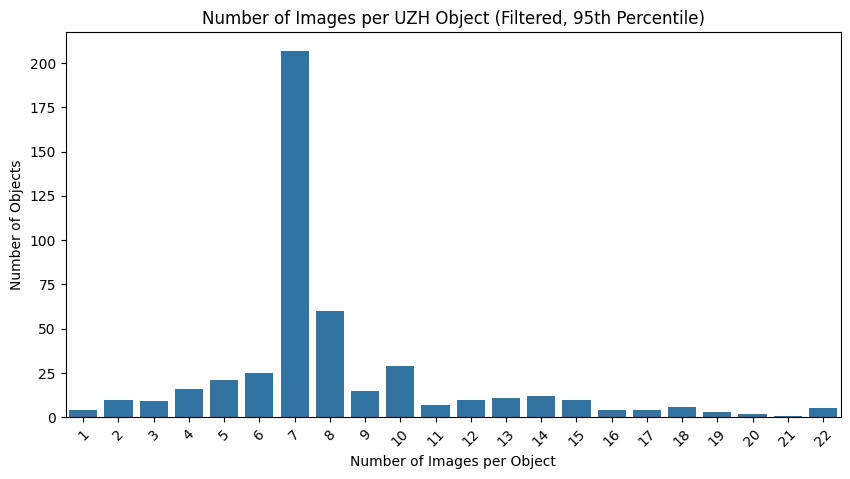

In [ ]:
import numpy as np

# Compute the 95th percentile threshold
threshold = np.percentile(image_counts_df["Image Count"], 95)

# Filter the data to exclude outliers
filtered_counts = image_counts_df[image_counts_df["Image Count"] <= threshold]

# Recompute the frequency distribution
image_count_freq = filtered_counts["Image Count"].value_counts().sort_index()

# Plot
plt.figure(figsize=(10, 5))
sns.barplot(x=image_count_freq.index, y=image_count_freq.values)

plt.xlabel("Number of Images per Object")
plt.ylabel("Number of Objects")
plt.title("Number of Images per UZH Object (95th Percentile)")
plt.xticks(rotation=45)
plt.show()

## The Metropolitan Museum Collection Data

### Load the metadata file

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [34]:
met_all = pd.read_csv('/content/drive/My Drive/master_thesis_project/met_metadata.csv', low_memory=False)
met_all.head()

,Object Number,Is Highlight,Is Timeline Work,Is Public Domain,Object ID,Gallery Number,Department,AccessionYear,Object Name,Title,...,Classification,Rights and Reproduction,Link Resource,Object Wikidata URL,Metadata Date,Repository,Tags,Tags AAT URL,Tags Wikidata URL,Description
0,74.51.3631,False,False,True,239585,171.0,Greek and Roman Art,1874.0,Pendant in the form of a vase,Pendant in the form of a vase,...,Gold and Silver,NaN,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,Gold pendant in the form of a vase.
1,74.51.1,False,False,True,239586,NaN,Greek and Roman Art,1874.0,Bead,Glass bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,"Translucent deep purple, appearing black; trai..."
2,74.51.3,False,False,True,239588,NaN,Greek and Roman Art,1874.0,Bead,Glass eye bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,Stratified double eye bead; two sets of four e...
3,74.51.8,False,False,True,239593,NaN,Greek and Roman Art,1874.0,Bead,Glass bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,"Uncertain color, probably translucent deep pur..."
4,74.51.11,False,False,True,239596,NaN,Greek and Roman Art,1874.0,Bead,Glass bead,...,Glass,NaN,http://www.metmuseum.org/art/collection/search...,NaN,NaN,"Metropolitan Museum of Art, New York, NY",NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa..."


### Selecting columns

In [ ]:
met_all.columns

Index(['Object Number', 'Is Highlight', 'Is Timeline Work', 'Is Public Domain',
       'Object ID', 'Gallery Number', 'Department', 'AccessionYear',
       'Object Name', 'Title', 'Culture', 'Period', 'Dynasty', 'Reign',
       'Portfolio', 'Constituent ID', 'Artist Role', 'Artist Prefix',
       'Artist Display Name', 'Artist Display Bio', 'Artist Suffix',
       'Artist Alpha Sort', 'Artist Nationality', 'Artist Begin Date',
       'Artist End Date', 'Artist Gender', 'Artist ULAN URL',
       'Artist Wikidata URL', 'Object Date', 'Object Begin Date',
       'Object End Date', 'Medium', 'Dimensions', 'Credit Line',
       'Geography Type', 'City', 'State', 'County', 'Country', 'Region',
       'Subregion', 'Locale', 'Locus', 'Excavation', 'River', 'Classification',
       'Rights and Reproduction', 'Link Resource', 'Object Wikidata URL',
       'Metadata Date', 'Repository', 'Tags', 'Tags AAT URL',
       'Tags Wikidata URL', 'Description'],
      dtype='object')

In [35]:
met_metadata = pd.DataFrame(met_all,
                            columns=[
                                    'Object Number', 'Object ID', 'Object Name', 'Title', 'Culture',
                                    'Period', 'Object Date', 'Medium', 'Dimensions', 'Geography Type',
                                    'City', 'Country', 'Classification', 'Link Resource',
                                    'Object Wikidata URL', 'Tags', 'Tags AAT URL', 'Description'
                                    ])

In [36]:
met_metadata.head()

,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Geography Type,City,Country,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description
0,74.51.3631,239585,Pendant in the form of a vase,Pendant in the form of a vase,Greek,Classical,5th–4th century BCE,Gold,Other: 9/16 in. (1.4 cm),NaN,NaN,NaN,Gold and Silver,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN,Gold pendant in the form of a vase.
1,74.51.1,239586,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),NaN,NaN,NaN,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Translucent deep purple, appearing black; trai..."
2,74.51.3,239588,Bead,Glass eye bead,"Phoenician, Cypriot",Archaic or Classical,6th–4th century BCE,Glass,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),NaN,NaN,NaN,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Stratified double eye bead; two sets of four e...
3,74.51.8,239593,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,NaN,NaN,NaN,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, probably translucent deep pur..."
4,74.51.11,239596,Bead,Glass bead,Cypriot,Archaic or Classical,ca. 750–300 BCE,Glass,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),NaN,NaN,NaN,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa..."


In [ ]:
met_metadata.shape

(5768, 18)

In [ ]:
met_metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5768 entries, 0 to 5767
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Object Number        5768 non-null   object 
 1   Object ID            5768 non-null   int64  
 2   Object Name          5767 non-null   object 
 3   Title                5768 non-null   object 
 4   Culture              5720 non-null   object 
 5   Period               5381 non-null   object 
 6   Object Date          5645 non-null   object 
 7   Medium               5767 non-null   object 
 8   Dimensions           5734 non-null   object 
 9   Geography Type       0 non-null      float64
 10  City                 0 non-null      float64
 11  Country              0 non-null      float64
 12  Classification       5768 non-null   object 
 13  Link Resource        5768 non-null   object 
 14  Object Wikidata URL  3613 non-null   object 
 15  Tags                 3449 non-null   o

In [ ]:
met_nan_counts = met_metadata.isna().sum()
met_nan_counts

,0
Object Number,0
Object ID,0
Object Name,1
Title,0
Culture,48
Period,387
Object Date,123
Medium,1
Dimensions,34
Geography Type,5768


In [38]:
# Remove the 3 columns that are all NaN values
met_metadata= met_metadata.drop(['Geography Type', 'City', 'Country'], axis=1)

In [ ]:
met_metadata.shape

(5768, 15)

In [39]:
met_metadata.head()

,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description
0,74.51.3631,239585,Pendant in the form of a vase,Pendant in the form of a vase,Greek,Classical,5th–4th century BCE,Gold,Other: 9/16 in. (1.4 cm),Gold and Silver,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN,Gold pendant in the form of a vase.
1,74.51.1,239586,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Translucent deep purple, appearing black; trai..."
2,74.51.3,239588,Bead,Glass eye bead,"Phoenician, Cypriot",Archaic or Classical,6th–4th century BCE,Glass,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Stratified double eye bead; two sets of four e...
3,74.51.8,239593,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, probably translucent deep pur..."
4,74.51.11,239596,Bead,Glass bead,Cypriot,Archaic or Classical,ca. 750–300 BCE,Glass,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa..."


### Remove objects that have invalid dates (CE/AD), still keep objects whose dates are NaN values

According to Phillip, these objects are actually BCE, in the correct period.:  
 '2nd or 3rd quarter of the 6th century',  
 'ca. 575–550',  
 '2nd half of the 6th century',  
 'early 7th century',  
 '7th century or later',  
 '9th century',  

These objects:  
 '1st or 2nd century CE',  
 '1st century CE',  
 '8th–7th century CE',  
 '1st–2nd century CE',  
 '6th century or later',  
 'early 1st century CE'    
 are invalid dates, but just keep them.



In [ ]:
dates_list = list(met_metadata['Object Date'].unique())

In [ ]:
dates_list

['5th–4th century BCE',
 'ca. 330–70 BCE',
 '6th–4th century BCE',
 'ca. 750–300 BCE',
 'ca. 625–600 BCE',
 '2nd–1st century BCE',
 '1st century BCE',
 '2nd–mid-1st century BCE',
 '3rd century BCE',
 '5th century BCE',
 '2nd century BCE',
 'late 3rd–mid-2nd century BCE',
 '6th century BCE',
 '750–600 BCE',
 'ca. 3rd–2nd century BCE',
 'ca. 550 BCE',
 '600–480 BCE',
 '480–400 BCE',
 'ca. 750–600 BCE',
 'mid-6th century BCE',
 'ca. 750–480 BCE',
 'ca. late 3rd–mid 1st century BCE',
 '310–30 BCE',
 'ca. 500–300 BCE',
 'late 2nd–early 1st century BCE',
 '480–310 BCE',
 '850–700 BCE',
 '400–310 BCE',
 'late 4th century BCE',
 '600–400 BCE',
 'ca. 400 BCE',
 '600–480 BCE?',
 'ca. 900–700 BCE',
 '850–750 BCE',
 '150–50 BCE',
 '750–480 BCE',
 'ca. 600–480 BCE',
 'ca. 850–750 BCE',
 '8th century BCE',
 nan,
 '750–310 BCE',
 '850–600 BCE',
 'ca. 550–525 BCE',
 '7th–6th century BCE',
 'ca. 80–1 BCE',
 '310–150 BCE',
 '650–480 BCE',
 'ca. 475–400 BCE',
 'ca. 400–323 BCE',
 'ca. 750 BCE',
 '1st hal

In [ ]:
invalid_dates = []

for date in dates_list:
  if not any(term in str(date) for term in ["BCE", "BC", "B.C", "B,C."]):
    invalid_dates.append(date)

invalid_dates

[nan,
 '2nd or 3rd quarter of the 6th century',
 'ca. 575–550',
 '2nd half of the 6th century',
 'early 7th century',
 '7th century or later',
 '1st or 2nd century CE',
 '1st century CE',
 '8th–7th century CE',
 '1st–2nd century CE',
 '9th century',
 '6th century or later',
 'early 1st century CE']

In [ ]:
invalid_dates_dict = met_metadata.set_index("Object ID")["Object Date"].to_dict()
invalid_ids = []

for id, date in invalid_dates_dict.items():
    if pd.notna(date) and date in invalid_dates:  # Ignore NaN and check for invalid dates
        invalid_ids.append(id)
        print(f"Object ID: {id}, Invalid Date: {date}")

Object ID: 242082, Invalid Date: 2nd or 3rd quarter of the 6th century
Object ID: 244846, Invalid Date: ca. 575–550
Object ID: 246145, Invalid Date: 2nd half of the 6th century
Object ID: 246360, Invalid Date: early 7th century
Object ID: 247432, Invalid Date: 7th century or later
Object ID: 248700, Invalid Date: 1st or 2nd century CE
Object ID: 248990, Invalid Date: 1st century CE
Object ID: 249888, Invalid Date: 8th–7th century CE
Object ID: 250705, Invalid Date: 1st or 2nd century CE
Object ID: 251516, Invalid Date: 1st–2nd century CE
Object ID: 251818, Invalid Date: 1st–2nd century CE
Object ID: 251896, Invalid Date: 9th century
Object ID: 252659, Invalid Date: 6th century or later
Object ID: 254538, Invalid Date: 1st or 2nd century CE
Object ID: 257877, Invalid Date: early 1st century CE
Object ID: 258555, Invalid Date: 1st–2nd century CE


In [ ]:
# Remove rows where 'Object ID' is in invalid_ids
met_metadata = met_metadata.loc[~met_metadata["Object ID"].isin(invalid_ids)]

# Reset index for clean dataframe
met_metadata = met_metadata.reset_index(drop=True)

### Convert the Date format to begin_date - end_date BCE, e.g. 499-300 BCE

#### Add two columns "Object Begin Date" and "Object End Date"  

In [ ]:
met_objects = pd.read_csv('/content/drive/My Drive/master_thesis_project/MetObjects.csv', low_memory=False)

In [ ]:
met_objects.columns

Index(['Object Number', 'Is Highlight', 'Is Timeline Work', 'Is Public Domain',
       'Object ID', 'Gallery Number', 'Department', 'AccessionYear',
       'Object Name', 'Title', 'Culture', 'Period', 'Dynasty', 'Reign',
       'Portfolio', 'Constituent ID', 'Artist Role', 'Artist Prefix',
       'Artist Display Name', 'Artist Display Bio', 'Artist Suffix',
       'Artist Alpha Sort', 'Artist Nationality', 'Artist Begin Date',
       'Artist End Date', 'Artist Gender', 'Artist ULAN URL',
       'Artist Wikidata URL', 'Object Date', 'Object Begin Date',
       'Object End Date', 'Medium', 'Dimensions', 'Credit Line',
       'Geography Type', 'City', 'State', 'County', 'Country', 'Region',
       'Subregion', 'Locale', 'Locus', 'Excavation', 'River', 'Classification',
       'Rights and Reproduction', 'Link Resource', 'Object Wikidata URL',
       'Metadata Date', 'Repository', 'Tags', 'Tags AAT URL',
       'Tags Wikidata URL'],
      dtype='object')

In [ ]:
# Create dictionary lookups for 'Object Begin Date' and 'Object End Date'
begin_date_dict = met_objects.set_index('Object ID')['Object Begin Date'].to_dict()
end_date_dict = met_objects.set_index('Object ID')['Object End Date'].to_dict()

# Map the values from the dictionaries to the DataFrame
met_metadata['Object Begin Date'] = met_metadata['Object ID'].map(begin_date_dict)
met_metadata['Object End Date'] = met_metadata['Object ID'].map(end_date_dict)

In [ ]:
met_metadata.head()

,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description,Object Begin Date,Object End Date
0,74.51.3631,239585,Pendant in the form of a vase,Pendant in the form of a vase,Greek,Classical,5th–4th century BCE,Gold,Other: 9/16 in. (1.4 cm),Gold and Silver,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN,Gold pendant in the form of a vase.,-499,-300
1,74.51.1,239586,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Translucent deep purple, appearing black; trai...",-330,-70
2,74.51.3,239588,Bead,Glass eye bead,"Phoenician, Cypriot",Archaic or Classical,6th–4th century BCE,Glass,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Stratified double eye bead; two sets of four e...,-599,-300
3,74.51.8,239593,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, probably translucent deep pur...",-330,-70
4,74.51.11,239596,Bead,Glass bead,Cypriot,Archaic or Classical,ca. 750–300 BCE,Glass,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa...",-750,-300


In [ ]:
met_metadata.shape

(5768, 17)

In [ ]:
dates_list = list(met_metadata['Object Date'].unique())
dates_list

['5th–4th century BCE',
 'ca. 330–70 BCE',
 '6th–4th century BCE',
 'ca. 750–300 BCE',
 'ca. 625–600 BCE',
 '2nd–1st century BCE',
 '1st century BCE',
 '2nd–mid-1st century BCE',
 '3rd century BCE',
 '5th century BCE',
 '2nd century BCE',
 'late 3rd–mid-2nd century BCE',
 '6th century BCE',
 '750–600 BCE',
 'ca. 3rd–2nd century BCE',
 'ca. 550 BCE',
 '600–480 BCE',
 '480–400 BCE',
 'ca. 750–600 BCE',
 'mid-6th century BCE',
 'ca. 750–480 BCE',
 'ca. late 3rd–mid 1st century BCE',
 '310–30 BCE',
 'ca. 500–300 BCE',
 'late 2nd–early 1st century BCE',
 '480–310 BCE',
 '850–700 BCE',
 '400–310 BCE',
 'late 4th century BCE',
 '600–400 BCE',
 'ca. 400 BCE',
 '600–480 BCE?',
 'ca. 900–700 BCE',
 '850–750 BCE',
 '150–50 BCE',
 '750–480 BCE',
 'ca. 600–480 BCE',
 'ca. 850–750 BCE',
 '8th century BCE',
 nan,
 '750–310 BCE',
 '850–600 BCE',
 'ca. 550–525 BCE',
 '7th–6th century BCE',
 'ca. 80–1 BCE',
 '310–150 BCE',
 '650–480 BCE',
 'ca. 475–400 BCE',
 'ca. 400–323 BCE',
 'ca. 750 BCE',
 '1st hal

In [ ]:
met_metadata["Formatted Date"] = met_metadata.apply(
    lambda row: (
        f"{abs(int(row['Object Begin Date']))} BCE"
        if int(row["Object Begin Date"]) == int(row["Object End Date"])
        else f"{abs(int(row['Object Begin Date']))}-{abs(int(row['Object End Date']))} BCE"
    ) if pd.notna(row["Object Begin Date"]) and pd.notna(row["Object End Date"]) else None,
    axis=1
)

In [ ]:
met_metadata.head()

,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description,Object Begin Date,Object End Date,Formatted Date
0,74.51.3631,239585,Pendant in the form of a vase,Pendant in the form of a vase,Greek,Classical,5th–4th century BCE,Gold,Other: 9/16 in. (1.4 cm),Gold and Silver,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN,Gold pendant in the form of a vase.,-499,-300,499-300 BCE
1,74.51.1,239586,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Translucent deep purple, appearing black; trai...",-330,-70,330-70 BCE
2,74.51.3,239588,Bead,Glass eye bead,"Phoenician, Cypriot",Archaic or Classical,6th–4th century BCE,Glass,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Stratified double eye bead; two sets of four e...,-599,-300,599-300 BCE
3,74.51.8,239593,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, probably translucent deep pur...",-330,-70,330-70 BCE
4,74.51.11,239596,Bead,Glass bead,Cypriot,Archaic or Classical,ca. 750–300 BCE,Glass,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa...",-750,-300,750-300 BCE


Take a look at the objects whose dates are NaN values.  
Found out they have a begin date and an end date.

In [ ]:
# Filter for rows where either 'Object Begin Date' or 'Object End Date' is NaN
nan_dates_objects = met_metadata[met_metadata['Object Date'].isna()]

nan_dates_objects


,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description,Object Begin Date,Object End Date,Formatted Date
103,74.51.485,240071,Amphora,Amphora,Cypriot,Cypro-Archaic I,NaN,Terracotta,8 7/8in. (22.6cm),Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Krater with bands, wavy lines, and triangle or...",-750,-600,750-600 BCE
177,74.51.569,240156,Jug,Jug,Cypriot,Hellenic,NaN,Terracotta,H. 6 9/16 in. (16.7 cm),Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Jug with spout, and body painted, in white, as...",-507,-323,507-323 BCE
179,74.51.571,240158,Jug,Jug,Cypriot,Hellenic,NaN,Terracotta,H. 5 1/16 in. (12.9 cm),Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Jug with spout, black slip, and body painted a...",-507,-323,507-323 BCE
203,74.51.600,240187,Bowl,Bowl,Cypriot,Hellenic,NaN,Terracotta,H. 6 7/16 in. (16.4 cm)\r\ndiameter of mouth ...,Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Deep bowl with foot, two handles and concentri...",-507,-323,507-323 BCE
204,74.51.602,240189,Oinochoe,Oinochoe,Cypriot,Hellenic,NaN,Terracotta,H.: 13 3/8 in. (34 cm),Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Concentric circles and details in white.,-507,-323,507-323 BCE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5034,67.11.6,255238,Jug,Jug,"Italic-Native, South Italian (Daunian)",NaN,NaN,Terracotta,H. with handle 21.79 cm.,Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,NaN,-900,-100,900-100 BCE
5074,1970.11.9,255306,Oinochoe,Oinochoe,"Italic-Native, South Italian (Daunian)",NaN,NaN,Terracotta,H. 8.71 cm.; diameter 6.4 cm.,Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,NaN,-900,-100,900-100 BCE
5159,1972.118.115,255426,Relief of Daedalus and Icarus,Relief of Daedalus and Icarus,NaN,NaN,NaN,Marble,Other: 27 1/2 × 21 15/16 in. (69.9 × 55.7 cm),Stone Sculpture,http://www.metmuseum.org/art/collection/search...,NaN,Male Nudes|Men,http://vocab.getty.edu/page/aat/300189568|http...,NaN,0,0,0-0 BCE
5506,X.21.95,256659,Handle in the form of a nude girl,Handle in the form of a nude girl,Etruscan,NaN,NaN,Bronze,length 7.59 cm.,Bronzes,http://www.metmuseum.org/art/collection/search...,NaN,Female Nudes,http://vocab.getty.edu/page/aat/300189568,NaN,-900,-100,900-100 BCE


In [ ]:
nan_dates_objects[["Object ID", "Title", "Object Date", "Object Begin Date", "Object End Date", "Formatted Date"]]

,Object ID,Title,Object Date,Object Begin Date,Object End Date,Formatted Date
103,240071,Amphora,NaN,-750,-600,750-600 BCE
177,240156,Jug,NaN,-507,-323,507-323 BCE
179,240158,Jug,NaN,-507,-323,507-323 BCE
203,240187,Bowl,NaN,-507,-323,507-323 BCE
204,240189,Oinochoe,NaN,-507,-323,507-323 BCE
...,...,...,...,...,...,...
5034,255238,Jug,NaN,-900,-100,900-100 BCE
5074,255306,Oinochoe,NaN,-900,-100,900-100 BCE
5159,255426,Relief of Daedalus and Icarus,NaN,0,0,0-0 BCE
5506,256659,Handle in the form of a nude girl,NaN,-900,-100,900-100 BCE


Correct the dates for object 251074

In [ ]:
# Filter for rows where both 'Object Begin Date' and 'Object End Date' are 0
zero_dates_objects = met_metadata[(met_metadata['Object Begin Date'] == 0) & (met_metadata['Object End Date'] == 0)]

zero_dates_objects[["Object ID", "Title", "Object Date", "Object Begin Date", "Object End Date", "Formatted Date"]]

,Object ID,Title,Object Date,Object Begin Date,Object End Date,Formatted Date
814,241987,Limestone inscribed block,NaN,0,0,0-0 BCE
1048,242287,Limestone statuette of Pan,NaN,0,0,0-0 BCE
1252,242814,Earring disc,NaN,0,0,0-0 BCE
1253,242815,Earring stud,NaN,0,0,0-0 BCE
1975,245797,Glass horn,NaN,0,0,0-0 BCE
3739,251074,Sard ring stone,50–25 BCE,0,0,0-0 BCE
5145,255426,Relief of Daedalus and Icarus,NaN,0,0,0-0 BCE


In [ ]:
len(zero_dates_objects) # Only 7 objects are formatted as 0-0 BCE, 6 have NaN dates, object 251074 has a date

7

In [ ]:
# Find the specific object with Object ID 251074
row = met_metadata[met_metadata['Object ID'] == 251074]

# Extract the 'Object Date' for that object
object_date = row['Object Date'].values[0]

# Split the 'Object Date' into 'Object Begin Date' and 'Object End Date'
start_date, end_date = object_date.split('–')

# Update the 'Object Begin Date' and 'Object End Date' directly in the DataFrame
met_metadata.loc[met_metadata['Object ID'] == 251074, 'Object Begin Date'] = -int(start_date)
met_metadata.loc[met_metadata['Object ID'] == 251074, 'Object End Date'] = -int(end_date.split()[0])

# Update the 'Formatted Date'
met_metadata.loc[met_metadata['Object ID'] == 251074, 'Formatted Date'] = f"{abs(int(start_date))}-{abs(int(end_date.split()[0]))} BCE"

met_metadata[met_metadata['Object ID'] == 251074]

,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description,Object Begin Date,Object End Date,Formatted Date
3739,21.88.48,251074,Intaglio,Sard ring stone,Roman,Late Republican,50–25 BCE,Sard,Length: 7/16 in. (1.1 cm),Gems,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116289638,Men|Portraits,http://vocab.getty.edu/page/aat/300025928|http...,Portrait head of Marcus Junius Brutus.,-50,-25,50-25 BCE


In [ ]:
met_metadata

,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description,Object Begin Date,Object End Date,Formatted Date
0,74.51.3631,239585,Pendant in the form of a vase,Pendant in the form of a vase,Greek,Classical,5th–4th century BCE,Gold,Other: 9/16 in. (1.4 cm),Gold and Silver,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN,Gold pendant in the form of a vase.,-499,-300,499-300 BCE
1,74.51.1,239586,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Translucent deep purple, appearing black; trai...",-330,-70,330-70 BCE
2,74.51.3,239588,Bead,Glass eye bead,"Phoenician, Cypriot",Archaic or Classical,6th–4th century BCE,Glass,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Stratified double eye bead; two sets of four e...,-599,-300,599-300 BCE
3,74.51.8,239593,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, probably translucent deep pur...",-330,-70,330-70 BCE
4,74.51.11,239596,Bead,Glass bead,Cypriot,Archaic or Classical,ca. 750–300 BCE,Glass,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa...",-750,-300,750-300 BCE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5747,2011.604.23.2,776274,Bone fragment,Bone,NaN,NaN,6th–4th centuries? BCE,Bone,NaN,"Miscellaneous-Bone, Ivory",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Bone cylinder,-700,-300,700-300 BCE
5748,"12.232.8a, 12.232.8b, 08.258.31, 26.60.30–26.6...",814422,6 Reliefs,Terracotta plaques,Roman,Augustan or Julio-Claudian,27 BCE–68 CE,Terracotta,NaN,Terracottas,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116445211,NaN,NaN,NaN,-27,-27,27-27 BCE
5749,2019.434,837724,Situla,Bronze situla (bucket),Etruscan,NaN,ca. late 5th–early 4th century BC,Bronze,"10 in. × 6 in., 41.266oz., 4 1/4 in. × 4 5/8 i...",Bronzes,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116445466,NaN,NaN,"The decoration of the vessel, particularly the...",-435,-371,435-371 BCE
5750,2021.121,852284,fibula,Fibula,Greek,Geometric,ca. 8th century BC,Bronze,"5 3/8 in., 200g (13.7 cm, 200g)",Bronzes,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116445562,NaN,NaN,The bow fibula shares distinctive characterist...,-800,-700,800-700 BCE


In [ ]:
columns_to_show = ['Object ID', 'Title', 'Object Date', 'Object Begin Date', 'Object End Date', 'Formatted Date']
met_metadata.loc[met_metadata['Object ID'] == 814422, columns_to_show]

,Object ID,Title,Object Date,Object Begin Date,Object End Date,Formatted Date
5748,814422,Terracotta plaques,27 BCE–68 CE,-27,-27,27-27 BCE


In [ ]:
columns_to_show = ['Object ID', 'Title', 'Object Date', 'Object Begin Date', 'Object End Date', 'Formatted Date']
met_metadata.loc[met_metadata['Object ID'] == 856618, columns_to_show]

,Object ID,Title,Object Date,Object Begin Date,Object End Date,Formatted Date
5751,856618,Statuette of a standing goddess,ca. 525–500 BC,-530,-495,530-495 BCE


### Download References

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
met_metadata = pd.read_csv('/content/drive/My Drive/master_thesis_project/met_metadata_0408.csv', low_memory=False)
met_metadata.head()

,ID,Inventory Number,Title,Medium,Date,Standardized Date,Dimension,Period,Culture,Category,Description,Bibliography,Link Resource,Object Wikidata URL,Tags,Tags AAT URL
0,239585,74.51.3631,Pendant in the form of a vase,Gold,5th–4th century BCE,499-300 BCE,Other: 9/16 in. (1.4 cm),Classical,Greek,Gold and Silver,Gold pendant in the form of a vase.,"Myres, John L. 1914.\nHandbook of the Cesnola ...",http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN
1,239586,74.51.1,Glass bead,Glass,ca. 330–70 BCE,330-70 BCE,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),Hellenistic,Greek,Glass,"Translucent deep purple, appearing black; trai...","Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN
2,239588,74.51.3,Glass eye bead,Glass,6th–4th century BCE,599-300 BCE,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),Archaic or Classical,"Phoenician, Cypriot",Glass,Stratified double eye bead; two sets of four e...,"Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN
3,239593,74.51.8,Glass bead,Glass,ca. 330–70 BCE,330-70 BCE,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,Hellenistic,Greek,Glass,"Uncertain color, probably translucent deep pur...","Myres, John L. 1914.\nHandbook of the Cesnola ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN
4,239596,74.51.11,Glass bead,Glass,ca. 750–300 BCE,750-300 BCE,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),Archaic or Classical,Cypriot,Glass,"Uncertain color, appearing black; trail in opa...","Myres, John L. 1914.\nHandbook of the Cesnola ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN


In [ ]:
import requests
from bs4 import BeautifulSoup
from tqdm import tqdm

In [ ]:
## helper function
def extract_references_from_body(body):
    references = []
    current_ref = []

    br_count = 0
    for elem in body.children:
        if getattr(elem, 'name', None) == 'br':
            br_count += 1
            if br_count == 2:  # End of a reference
                if current_ref:
                    references.append(" ".join(current_ref).strip())
                    current_ref = []
                br_count = 0
        elif isinstance(elem, str):
            text = elem.strip()
            if text:
                current_ref.append(text)
            br_count = 0  # reset if actual content
        elif elem.name in ['i', 'b', 'em']:
            text = elem.get_text(strip=True)
            if text:
                current_ref.append(text)
            br_count = 0

    # Add the last reference if it exists
    if current_ref:
        references.append(" ".join(current_ref).strip())

    return references

In [ ]:
def fetch_references(object_id, headers):
    """Fetches the reference list from the MET object page."""
    url = f"https://www.metmuseum.org/art/collection/search/{object_id}"
    try:
        response = requests.get(url, headers=headers, timeout=10)

        if response.status_code == 200:
            soup = BeautifulSoup(response.text, "html.parser")

            # Find the references section
            references_section = soup.find("section", id="references")
            if references_section:
                body = references_section.find("div", class_="show-more__body")
                if body:
                    references_list = extract_references_from_body(body)
                    return (object_id, "\n\n".join(references_list))
                else:
                    return (object_id, "No reference body found.")
            else:
                return (object_id, "No references section found.")
        else:
            return (object_id, f"Failed to fetch (status {response.status_code})")

    except requests.exceptions.RequestException as e:
        return (object_id, f"Request error: {e}")

In [ ]:
def extract_object_references(object_ids, headers):
    """Fetches references for multiple object IDs."""
    results = []

    for object_id in tqdm(object_ids, desc="Extracting references for Met objects"):
        result = fetch_references(object_id, headers)
        results.append(result)

    # Convert to DataFrame
    id_refs_df = pd.DataFrame(results, columns=["ID", "References"])
    return id_refs_df

In [ ]:
headers = {
    "Accept": "*/*",
    "Accept-Encoding": "gzip, deflate, br",
    "Accept-Language": "en-GB,en;q=0.9",
    "Connection": "keep-alive",
    "Content-Type": "text/plain",
    "Sec-Fetch-Dest": "empty",
    "Sec-Fetch-Mode": "cors",
    "Sec-Fetch-Site": "cross-site",
    "User-Agent": "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.0 Safari/605.1.15"
}

# List of Met object IDs
met_objects_ids = met_metadata["ID"].tolist()

# Call the references extraction function
met_references = extract_object_references(met_objects_ids, headers)

Extracting references for Met objects: 100%|██████████| 5746/5746 [1:32:47<00:00,  1.03it/s]


In [ ]:
# Merge the references into the original dataframe
met_metadata = pd.merge(met_metadata, met_references, on="ID", how="left")

In [ ]:
met_metadata.head()

,ID,Inventory Number,Title,Medium,Date,Standardized Date,Dimension,Period,Culture,Category,Description,Bibliography,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,References
0,239585,74.51.3631,Pendant in the form of a vase,Gold,5th–4th century BCE,499-300 BCE,Other: 9/16 in. (1.4 cm),Classical,Greek,Gold and Silver,Gold pendant in the form of a vase.,"Myres, John L. 1914.\nHandbook of the Cesnola ...",http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN,"Myres, John L. 1914. Handbook of the Cesnola C..."
1,239586,74.51.1,Glass bead,Glass,ca. 330–70 BCE,330-70 BCE,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),Hellenistic,Greek,Glass,"Translucent deep purple, appearing black; trai...","Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Cesnola, Luigi Palma di. 1903. A Descriptive A..."
2,239588,74.51.3,Glass eye bead,Glass,6th–4th century BCE,599-300 BCE,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),Archaic or Classical,"Phoenician, Cypriot",Glass,Stratified double eye bead; two sets of four e...,"Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Cesnola, Luigi Palma di. 1903. A Descriptive A..."
3,239593,74.51.8,Glass bead,Glass,ca. 330–70 BCE,330-70 BCE,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,Hellenistic,Greek,Glass,"Uncertain color, probably translucent deep pur...","Myres, John L. 1914.\nHandbook of the Cesnola ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Myres, John L. 1914. Handbook of the Cesnola C..."
4,239596,74.51.11,Glass bead,Glass,ca. 750–300 BCE,750-300 BCE,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),Archaic or Classical,Cypriot,Glass,"Uncertain color, appearing black; trail in opa...","Myres, John L. 1914.\nHandbook of the Cesnola ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Myres, John L. 1914. Handbook of the Cesnola C..."


In [ ]:
# Remove the old "Bibliography" column, which has a format issue
met_metadata = met_metadata.drop(columns=["Bibliography"])

In [ ]:
# Rename the newly scraped "References" column to "Bibliography"
met_metadata.rename(columns={"References": "Bibliography"}, inplace=True)

In [ ]:
# save it to a new CSV
met_metadata.to_csv('/content/drive/My Drive/master_thesis_project/met_metadata_0509.csv', index=False)

## The Archäologische Sammlung UZH Data

### Load the data json file

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
uzh_json = pd.read_json('/content/drive/My Drive/master_thesis_project/uzh_metadata.json')
uzh_json.head()

,pageProps,__N_SSG
0,"{'lng': 'de', 'data': {'ids': [], 'queryParams...",True
1,"{'lng': 'de', 'data': {'ids': [], 'queryParams...",True
2,"{'lng': 'de', 'data': {'ids': [], 'queryParams...",True
3,"{'lng': 'de', 'data': {'ids': [], 'queryParams...",True
4,"{'lng': 'de', 'data': {'ids': [], 'queryParams...",True


In [ ]:
uzh_all = uzh_json["pageProps"].apply(lambda x: x["data"]).apply(pd.Series)["item"].apply(pd.Series)
uzh_all.head()

,ObjInventoryNumberTxt,ObjConditionNoteTxt,ObjConservationTxt,ObjFindSpotFilterTxt,ObjTitleTxt,ObjDescriptionTxt,ObjBriefDescriptionTxt,ObjObjectARef,ObjInventoryNumberLenderTxt,DefaultThumbnail,...,ObjMaterialTechniqueTxt,__lastModified,ObjCategoryVoc,ObjProductionSiteTxt,ObjPersonRef,DefaultImage,Id,ObjExhibitionRef,Carousel,ObjInscriptionTxt
0,3960,Gefäss ungebrochen. Mündung aussen abgeschliff...,,,"Aryballos, frühprotokorinthisch",Aryballos mit eiförmigem Körper auf kleinem Ri...,"Aryballos, Silhouettenmalerei mit Aussparungen",{'Items': [{'Multimedia': [{'thumb': 'multimed...,,multimedia/1/multimedia-73311.small.jpg,...,"Ton, gebrannt",2023-09-26 13:50:39.489,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/1/multimedia-73311.large.jpg,6213,{'Items': [{'LinkLabelTxt_en': 'Dauerausstellu...,[{'thumb': 'multimedia/1/multimedia-73311.smal...,NaN
1,2502,Aus zahlreichen Fragmenten zusammengesetzt. Di...,,Unbekannt,"Pelike der Eumenides Gruppe, rotfigurig, attis...",Die Mündung ist innen gefirnisst (Glanzton). A...,Pelike,"{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/4/multimedia-158074.small.jpg,...,"Ton, gebrannt",2023-09-26 15:45:07.850,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,{'Items': [{'LinkLabelTxt_en': 'Cannot invoke ...,multimedia/4/multimedia-158074.large.jpg,7190,{'Items': [{'LinkLabelTxt_en': 'Dauerausstellu...,[{'thumb': 'multimedia/4/multimedia-158074.sma...,NaN
2,2730,Der Henkel und ein Teil des Fussringes fehlen....,,,"Lekythos, Glanzton / Schwarzfirnis, kampanisch...",Die Mündung ist innen gefirnisst (Glanzton). A...,Lekythos,"{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/7/multimedia-158267.small.jpg,...,"Ton, gebrannt",2023-09-26 15:51:53.184,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/7/multimedia-158267.large.jpg,7474,"{'Items': [], 'ModuleTxt': 'Exhibition', 'Tota...",[{'thumb': 'multimedia/7/multimedia-158267.sma...,NaN
3,2734,Ungebrochen. Der Fuss ist bestossen.,,,"Balsamarium / Unguentarium, Glanzton / Schwarz...",Die Mündung ist innen gefirnisst (Glanzton). D...,"Balsamarium, Unguentarium","{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/5/multimedia-158295.small.jpg,...,"Ton, gebrannt",2023-09-26 13:49:01.266,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/5/multimedia-158295.large.jpg,6160,"{'Items': [], 'ModuleTxt': 'Exhibition', 'Tota...",[{'thumb': 'multimedia/5/multimedia-158295.sma...,NaN
4,2753,Der grösste Teil des Henkels fehlt. Sonst unge...,,Unbekannt,"Einhenkliger Napf (one-handler), Glanzton / Sc...",Das ganze Gefäss ist mit Firnis / Glanzton übe...,"Napf, one-handler","{'Items': [], 'ModuleTxt': 'Object', 'TotalSiz...",,multimedia/7/multimedia-159177.small.jpg,...,"Ton, gebrannt",2025-03-10 12:33:41.462,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",,"{'Items': [], 'ModuleTxt': 'Person', 'TotalSiz...",multimedia/7/multimedia-159177.large.jpg,5430,"{'Items': [], 'ModuleTxt': 'Exhibition', 'Tota...",[{'thumb': 'multimedia/7/multimedia-159177.sma...,NaN


In [ ]:
uzh_all.columns

Index(['ObjInventoryNumberTxt', 'ObjConditionNoteTxt', 'ObjConservationTxt',
       'ObjFindSpotFilterTxt', 'ObjTitleTxt', 'ObjDescriptionTxt',
       'ObjBriefDescriptionTxt', 'ObjObjectARef',
       'ObjInventoryNumberLenderTxt', 'DefaultThumbnail', 'ObjFindSpotTxt_en',
       'ObjGypsumPlaceTxt', 'ObjInventoryNumberLenderTxt_en',
       'ObjOnDisplayBoo', 'ObjConferaturTxt', 'ObjProductionSiteTxt_en',
       'ObjDateGrp', 'ObjCurrentLocation', 'ObjFindSpotFilterTxt_en',
       'ObjCultureCircleGrp', 'ObjGypsumMaterialTxt', 'ObjBibliographyTxt',
       'ObjGypsumOriginalTxt', 'ObjGypsumConditionTxt', 'ObjConferaturTxt_en',
       'Multimedia', 'ObjTypeVoc', 'ObjCurrentLocation_en', 'ObjFindSpotTxt',
       'ObjMultimediaRef', 'ObjObjectBRef', 'ObjBibliographyTxt_en',
       'ObjTechniqueVoc', 'ObjDimensionTxt', 'ObjDateSortTxt',
       'ObjMaterialTechniqueTxt', '__lastModified', 'ObjCategoryVoc',
       'ObjProductionSiteTxt', 'ObjPersonRef', 'DefaultImage', 'Id',
       'ObjExhibit

### Count NaN values

In [ ]:
uzh_all.shape

(495, 45)

In [ ]:
uzh_nan_counts = uzh_all.isna().sum()
uzh_nan_counts

,0
ObjInventoryNumberTxt,0
ObjConditionNoteTxt,0
ObjConservationTxt,0
ObjFindSpotFilterTxt,1
ObjTitleTxt,0
ObjDescriptionTxt,0
ObjBriefDescriptionTxt,1
ObjObjectARef,0
ObjInventoryNumberLenderTxt,0
DefaultThumbnail,0


### Select columns

In [ ]:
uzh_metadata = pd.DataFrame(uzh_all,
                            columns=[
                                    'ObjInventoryNumberTxt', 'Id', 'ObjTitleTxt', 'ObjCultureCircleGrp',
                                    'ObjDateGrp', 'ObjMaterialTechniqueTxt', 'ObjDimensionTxt',
                                    'ObjFindSpotTxt', 'ObjCurrentLocation', 'ObjCategoryVoc', 'ObjTypeVoc',
                                    'ObjBibliographyTxt', 'ObjBriefDescriptionTxt', 'ObjDescriptionTxt'
                                    ])

In [ ]:
uzh_metadata.head()

,ObjInventoryNumberTxt,Id,ObjTitleTxt,ObjCultureCircleGrp,ObjDateGrp,ObjMaterialTechniqueTxt,ObjDimensionTxt,ObjFindSpotTxt,ObjCurrentLocation,ObjCategoryVoc,ObjTypeVoc,ObjBibliographyTxt,ObjBriefDescriptionTxt,ObjDescriptionTxt
0,3960,6213,"Aryballos, frühprotokorinthisch",[{'ObjCircleVoc': {'LabelTxt_en': 'Corinthian'...,"[{'ObjDateTxt': '710 – 700 v. Chr.'}, {'ObjDat...","Ton, gebrannt","H: 5,2 cm\n Dm Fuss / Dm max Gefäss / Dm Mündu...",,"Ausgestellt\nRämistrasse 73 (RAK), Zürich, Aus...","{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...","{'LabelTxt_en': 'Antique original', 'NodeId': ...","S. Buzzi, Corpus vasorum antiquorum. Schweiz 9...","Aryballos, Silhouettenmalerei mit Aussparungen",Aryballos mit eiförmigem Körper auf kleinem Ri...
1,2502,7190,"Pelike der Eumenides Gruppe, rotfigurig, attis...","[{'ObjCircleVoc': {'LabelTxt_en': 'Apulian', '...","[{'ObjDateTxt': 'Ende 5. Jh. v. Chr.'}, {'ObjD...","Ton, gebrannt","H: 20,1 cm\n Dm Fuss / Dm Körper / Dm Mündung:...",Unbekannt,Aktuell nicht ausgestellt,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...","{'LabelTxt_en': 'Antique original', 'NodeId': ...",Beazley Archive Pottery Database (BAPD). Beson...,Pelike,Die Mündung ist innen gefirnisst (Glanzton). A...
2,2730,7474,"Lekythos, Glanzton / Schwarzfirnis, kampanisch...","[{'ObjCircleVoc': {'LabelTxt_en': 'Campanian',...","[{'ObjDateTxt': '4. Jh. v. Chr.'}, {'ObjDateTx...","Ton, gebrannt","H: 7,6 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",,Aktuell nicht ausgestellt,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...","{'LabelTxt_en': 'Antique original', 'NodeId': ...",Beazley Archive Pottery Database (BAPD). Beson...,Lekythos,Die Mündung ist innen gefirnisst (Glanzton). A...
3,2734,6160,"Balsamarium / Unguentarium, Glanzton / Schwarz...","[{'ObjCircleVoc': {'LabelTxt_en': 'Apulian', '...",[{'ObjDateTxt': 'Spätes 4. – frühes 3. Jh. v. ...,"Ton, gebrannt","H: 9,0 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",,Aktuell nicht ausgestellt,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...","{'LabelTxt_en': 'Antique original', 'NodeId': ...",Beazley Archive Pottery Database (BAPD). Beson...,"Balsamarium, Unguentarium",Die Mündung ist innen gefirnisst (Glanzton). D...
4,2753,5430,"Einhenkliger Napf (one-handler), Glanzton / Sc...","[{'ObjCircleVoc': {'LabelTxt_en': 'Apulian', '...",[{'ObjDateTxt': '2. Hälfte 5. Jh. v. Chr. – 1....,"Ton, gebrannt","H: 4,3 cm\n Dm Fuss / Dm Körper: 4,7 / 8,3 cm",Unbekannt,Aktuell nicht ausgestellt,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...","{'LabelTxt_en': 'Antique original', 'NodeId': ...",Beazley Archive Pottery Database (BAPD). Beson...,"Napf, one-handler",Das ganze Gefäss ist mit Firnis / Glanzton übe...


### Extract culture names

In [ ]:
def extract_cultures(culture_group):
    """extract culture names in German and English from 'ObjCultureCircleGrp'"""
    if isinstance(culture_group, list) and len(culture_group) > 0:
        culture_en = culture_group[0].get("ObjCircleVoc", {}).get("LabelTxt_en", None)
        culture_de = culture_group[0].get("ObjCircleVoc", {}).get("LabelTxt", None)
        return pd.Series([culture_en, culture_de])
    return pd.Series([None, None])

uzh_metadata[["Culture EN", "Culture DE"]] = uzh_metadata["ObjCultureCircleGrp"].apply(extract_cultures)

In [ ]:
uzh_metadata[["ObjCultureCircleGrp", "Culture EN", "Culture DE"]].head()

,ObjCultureCircleGrp,Culture EN,Culture DE
0,[{'ObjCircleVoc': {'LabelTxt_en': 'Corinthian'...,Corinthian,Korinthisch
1,"[{'ObjCircleVoc': {'LabelTxt_en': 'Apulian', '...",Apulian,Apulisch
2,"[{'ObjCircleVoc': {'LabelTxt_en': 'Campanian',...",Campanian,Kampanisch
3,"[{'ObjCircleVoc': {'LabelTxt_en': 'Apulian', '...",Apulian,Apulisch
4,"[{'ObjCircleVoc': {'LabelTxt_en': 'Apulian', '...",Apulian,Apulisch


### Extract dates

In [ ]:
def extract_period_and_date(date_group):
    """extract period and date"""
    period = None
    date = None

    if isinstance(date_group, list):
        for entry in date_group:
            text = entry.get("ObjDateTxt", "").strip()
            if text:  # Ignore empty strings
                if any(c.isdigit() for c in text):  # If it contains numbers, it's a date
                    date = text
                else:  # Otherwise, it's a period name
                    period = text

    return pd.Series([period, date])

In [ ]:
uzh_metadata[["Period", "Date"]] = uzh_metadata["ObjDateGrp"].apply(extract_period_and_date)

uzh_metadata[["ObjDateGrp", "Period", "Date"]].head()

,ObjDateGrp,Period,Date
0,"[{'ObjDateTxt': '710 – 700 v. Chr.'}, {'ObjDat...",None,710 – 700 v. Chr.
1,"[{'ObjDateTxt': 'Ende 5. Jh. v. Chr.'}, {'ObjD...",None,Ende 5. Jh. v. Chr.
2,"[{'ObjDateTxt': '4. Jh. v. Chr.'}, {'ObjDateTx...",None,4. Jh. v. Chr.
3,[{'ObjDateTxt': 'Spätes 4. – frühes 3. Jh. v. ...,None,Spätes 4. – frühes 3. Jh. v. Chr.
4,[{'ObjDateTxt': '2. Hälfte 5. Jh. v. Chr. – 1....,None,2. Hälfte 5. Jh. v. Chr. – 1. Hälfte 4. Jh. v....


### Extract Category and type

In [ ]:
def extract_categories(category_vocabs):
    """Extract category names in German and English from 'ObjCategoryVoc'."""
    if isinstance(category_vocabs, dict):  # Ensure the input is a dictionary
        category_en = category_vocabs.get("LabelTxt_en", None)
        category_de = category_vocabs.get("LabelTxt", None)
        return pd.Series([category_en, category_de])
    return pd.Series([None, None])

uzh_metadata[["Category EN", "Category DE"]] = uzh_metadata["ObjCategoryVoc"].apply(extract_categories)

In [ ]:
uzh_metadata[["ObjCategoryVoc", "Category EN", "Category DE"]].head()

,ObjCategoryVoc,Category EN,Category DE
0,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",Vessel,Gefäss
1,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",Vessel,Gefäss
2,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",Vessel,Gefäss
3,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",Vessel,Gefäss
4,"{'LabelTxt_en': 'Vessel', 'NodeId': '72825', '...",Vessel,Gefäss


In [ ]:
def extract_types(type_vocabs):
    """Extract type names in German and English from 'ObjTypeVoc'."""
    if isinstance(type_vocabs, dict):  # Ensure the input is a dictionary
        type_en = type_vocabs.get("LabelTxt_en", None)
        type_de = type_vocabs.get("LabelTxt", None)
        return pd.Series([type_en, type_de])
    return pd.Series([None, None])

uzh_metadata[["Type EN", "Type DE"]] = uzh_metadata["ObjTypeVoc"].apply(extract_types)

In [ ]:
uzh_metadata[["ObjTypeVoc", "Type EN", "Type DE"]].head()

,ObjTypeVoc,Type EN,Type DE
0,"{'LabelTxt_en': 'Antique original', 'NodeId': ...",Antique original,Antikes Original
1,"{'LabelTxt_en': 'Antique original', 'NodeId': ...",Antique original,Antikes Original
2,"{'LabelTxt_en': 'Antique original', 'NodeId': ...",Antique original,Antikes Original
3,"{'LabelTxt_en': 'Antique original', 'NodeId': ...",Antique original,Antikes Original
4,"{'LabelTxt_en': 'Antique original', 'NodeId': ...",Antique original,Antikes Original


### Remove the columns 'ObjCultureCircleGrp', 'ObjDateGrp', 'ObjCategoryVoc', 'ObjTypeVoc'

In [ ]:
uzh_metadata = uzh_metadata.drop(columns=['ObjCultureCircleGrp', 'ObjDateGrp', 'ObjCategoryVoc', 'ObjTypeVoc'])

In [ ]:
uzh_metadata.head()

,ObjInventoryNumberTxt,Id,ObjTitleTxt,ObjMaterialTechniqueTxt,ObjDimensionTxt,ObjFindSpotTxt,ObjCurrentLocation,ObjBibliographyTxt,ObjBriefDescriptionTxt,ObjDescriptionTxt,Culture EN,Culture DE,Period,Date,Category EN,Category DE,Type EN,Type DE
0,3960,6213,"Aryballos, frühprotokorinthisch","Ton, gebrannt","H: 5,2 cm\n Dm Fuss / Dm max Gefäss / Dm Mündu...",,"Ausgestellt\nRämistrasse 73 (RAK), Zürich, Aus...","S. Buzzi, Corpus vasorum antiquorum. Schweiz 9...","Aryballos, Silhouettenmalerei mit Aussparungen",Aryballos mit eiförmigem Körper auf kleinem Ri...,Corinthian,Korinthisch,None,710 – 700 v. Chr.,Vessel,Gefäss,Antique original,Antikes Original
1,2502,7190,"Pelike der Eumenides Gruppe, rotfigurig, attis...","Ton, gebrannt","H: 20,1 cm\n Dm Fuss / Dm Körper / Dm Mündung:...",Unbekannt,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,Pelike,Die Mündung ist innen gefirnisst (Glanzton). A...,Apulian,Apulisch,None,Ende 5. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original
2,2730,7474,"Lekythos, Glanzton / Schwarzfirnis, kampanisch...","Ton, gebrannt","H: 7,6 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,Lekythos,Die Mündung ist innen gefirnisst (Glanzton). A...,Campanian,Kampanisch,None,4. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original
3,2734,6160,"Balsamarium / Unguentarium, Glanzton / Schwarz...","Ton, gebrannt","H: 9,0 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,"Balsamarium, Unguentarium",Die Mündung ist innen gefirnisst (Glanzton). D...,Apulian,Apulisch,None,Spätes 4. – frühes 3. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original
4,2753,5430,"Einhenkliger Napf (one-handler), Glanzton / Sc...","Ton, gebrannt","H: 4,3 cm\n Dm Fuss / Dm Körper: 4,7 / 8,3 cm",Unbekannt,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,"Napf, one-handler",Das ganze Gefäss ist mit Firnis / Glanzton übe...,Apulian,Apulisch,None,2. Hälfte 5. Jh. v. Chr. – 1. Hälfte 4. Jh. v....,Vessel,Gefäss,Antique original,Antikes Original


### Format dates

In [ ]:
print(len(uzh_metadata['Date'].unique()))
uzh_metadata['Date'].unique()

165


array(['710 – 700 v. Chr.', 'Ende 5. Jh. v. Chr.', '4. Jh. v. Chr.',
       'Spätes 4. – frühes 3. Jh. v. Chr.',
       '2. Hälfte 5. Jh. v. Chr. – 1. Hälfte 4. Jh. v. Chr.',
       '570 – 560 v. Chr.', '4. Jh. v. Chr. – 3. Jh. v. Chr.',
       '640 – 620 v. Chr.', '2. Hälfte 4. Jh. v. Chr. – 3. Jh. v. Chr.',
       '2. bis 3. Viertel 6. Jh. v. Chr.', '3. Viertel 6. Jh. v. Chr.',
       '1. Viertel 5. Jh. v. Chr.', '3. Viertel 4. Jh. v. Chr.',
       'Mittleres 6. Jh. v. Chr.', 'Um 530 v. Chr.', '340 – 320 v. Chr.',
       '620 – 600 v. Chr.', 'Spätes 5. – frühes 4. Jh. v. Chr.',
       '720–680 v. Chr.', '1. Viertel 6. Jh. v. Chr.',
       '3. Drittel 4. Jh. v. Chr.', '750–725 v. Chr.',
       'Spätes 6. Jh. v. Chr.', 'Mitte 4. Jh. v. Chr.',
       '2. – 3. Viertel 6. Jh. v. Chr.', 'Anfang 5. Jh. v. Chr.',
       '2. Hälfte 4. Jh. v. Chr.', '3. Jh. v. Chr.',
       '1. Jh. v. Chr. – 1. Jh. n. Chr.', '500 – 490 v. Chr.',
       'Letztes Viertel 7. Jh. v. Chr. – Anf. 6. Jh. v. Chr.',
  

In [ ]:
import re

def clean_dates(date):
    """Clean up the dates by removing unnecessary words or parts while preserving date information."""

    # Remove fractional qualifiers like "2. Hälfte", "3. Viertel", "3. Drittel", "2. oder 4. Viertel", "Drittes Viertel", etc.
    date = re.sub(r"(\b\d\.?\s*(oder\s*\d\.?)?\s*(Viertel|Hälfte|Drittel)\b|Erstes|Zweites|Drittes|Viertes)\s+(des\s+)?", "", date, flags=re.IGNORECASE)


    # Remove 'Drittes Viertel des'
    date = re.sub(r'\b(Drittes Viertel des|Letzte Jahrzehnt des)\b', '', date, flags=re.IGNORECASE)

    # Remove standalone time division words if they still exist
    date = re.sub(r'\b(Hälfte|Viertel|Drittel)\b', '', date, flags=re.IGNORECASE)

    # Remove 'bis kurz danach' and 'oder später'
    date = re.sub(r'\b(bis kurz danach|oder später)\b', '', date, flags=re.IGNORECASE)

    # Replace 'bis' with dash for range normalization
    date = re.sub(r'\s*(bis|oder|schon)\s*', ' – ', date, flags=re.IGNORECASE)

    # Remove unnecessary qualifiers and descriptors
    clean_date = re.sub(
        r'\b(um|ca\.?|möglicherweise|ev\.?|evtl\.?|frühes|früheres|spätes|mittleres|ende|anfang|anf|mitte|des|letztes)\b\.?\s*',
        '', date,
        flags=re.IGNORECASE
    )

    # Clean up any extra whitespace
    return re.sub(r'\s+', ' ', clean_date).strip()

In [ ]:
def extract_eras(date):
    """Extract the era (v. Chr. or n. Chr.) from the date."""
    eras = re.findall(r'(v\. Chr\.|n\. Chr\.)', date)
    return eras if eras else None

In [ ]:
def convert_century_to_years(century, era):
    """Convert a century notation (e.g., '4. Jh. v. Chr.') to a year range."""
    century = int(century)
    start_year = (century - 1) * 100 + 99
    end_year = (century - 1) * 100

    if era == "v. Chr.":
        return f"{start_year}-{end_year} v. Chr."
    else:  # "n. Chr." This is a stepwise method to convert cases like '3. Jh. v. Chr. – 2. Jh. n. Chr.' first to '299-200 v. Chr. – 199-100 n. Chr.', and then following step convert it to 299 v. Chr. - 100 n. Chr.
        return f"{start_year}-{end_year} n. Chr."

In [ ]:
def convert_bce_to_ce_range(date):
    """Convert a BCE to CE range into the correct format (e.g., '1. Jh. v. Chr. – 1. Jh. n. Chr.' to '99 v. Chr. – 100 n. Chr.')"""
    match_bce_to_ce = re.search(r'(\d+)\. Jh\. v\. Chr\. – (\d+)\. Jh\. (n\. Chr\.|v\. Chr\.)', date)

    if match_bce_to_ce:
        start_century_bce = int(match_bce_to_ce.group(1))
        end_century = int(match_bce_to_ce.group(2))
        end_period = match_bce_to_ce.group(3)

        # Convert BCE to start year
        start_year_bce = (start_century_bce - 1) * 100 + 99

        if end_period == "v. Chr.":
            end_year_bce = (end_century - 1) * 100
            date_converted = f"{start_year_bce}-{end_year_bce} v. Chr."
        else:
            # Handle BCE to CE transition correctly
            end_year_ce = 100 if end_century == 1 else (end_century - 1) * 100 + 100
            date_converted = f"{start_year_bce} v. Chr. – {end_year_ce} n. Chr."

        return date_converted
    else:
        return date  # If the pattern does not match, return the original date

In [ ]:
def normalize_date(date):
    """Normalize various historical date formats into a consistent 'start-end era' format."""
    date = date.strip()
    date = clean_dates(date)

    # handle specific range case "1.  Jh. v. Chr. – 1. Jh. n. Chr." → "100-0. Jh. v. Chr.– 1-100 n. Chr. "
    date = re.sub(r"(\d+)\.\s*Jh\.\s*v\.\s*Chr\.\s*–\s*(\d+)\.\s*Jh\.\s*n\.\s*Chr\.",
              lambda m: f"{((int(m.group(1)) - 1) * 100) + 99}-{(int(m.group(1)) - 1) * 100} v. Chr.–{(int(m.group(2)) - 1) * 100 + 1}-{int(m.group(2)) * 100} n. Chr.", date)

    # Combine BCE to CE transitional ranges like "99-0 v. Chr.–1-100 n. Chr."
    date = re.sub(r"(\d+)-\d+ v\. Chr\.\s*–\s*\d+-(\d+) n\. Chr\.",
              lambda m: f"{m.group(1)} v. Chr. – {m.group(2)} n. Chr.", date)

    # Preserve direct BCE/CE year ranges like "555 – 550 v. Chr."
    date = re.sub(r"(\d{3,4})\s*–\s*(\d{3,4})\s*(v\. Chr\.|n\. Chr\.)", r"\1–\2 \3", date)

    # Keep single BCE/CE years like '510 v. Chr.' as is
    date = re.sub(r"(\d{3,4})\s*(v\. Chr\.|n\. Chr\.)", r"\1 \2", date)

    # Handle specific range case "5. – 4. Jh. v. Chr." → "499-300 v. Chr."
    date = re.sub(r"(\d+)\.\s*–\s*(\d+)\.\s*Jh\.\s*v\.\s*Chr\.",
              lambda m: f"{(int(m.group(1)) - 1) * 100 + 99}-{(int(m.group(2)) - 1) * 100} v. Chr.", date)

    # Convert full centuries like '5. Jh. v. Chr.' → '499-400 v. Chr.'
    date = re.sub(r"(\d+)\.\s*Jhs?\.\s*(v\.\s*Chr\.|n\.\s*Chr\.)",
              lambda m: convert_century_to_years(m.group(1), m.group(2)), date)

    # Merge two BCE ranges like "399-300 v. Chr.– 299-200 v. Chr." → "399-200 v. Chr."
    date = re.sub(r"(\d+)-\d+\s*v\.\s*Chr\.\s*–\s*(\d+)-(\d+)\s*v\.\s*Chr\.",
              lambda m: f"{m.group(1)}-{m.group(3)} v. Chr.", date)

    # There are both hyphen and dash mixed in the converted dates ao far, Normalize hyphen to dash for consistency
    date = date.replace("-", "–")

    # Fix spacing issues
    date = re.sub(r"\s*–\s*", "–", date)
    date = re.sub(r"\s+", " ", date).strip()

    return date

In [ ]:
# This is only used to test
date = re.sub(r"(\d+)\.\s*Jh\.\s*v\.\s*Chr\.\s*–\s*(\d+)\.\s*Jh\.\s*n\.\s*Chr\.",
              lambda m: f"{((int(m.group(1)) - 1) * 100) + 99}-{(int(m.group(1)) - 1) * 100} v. Chr.–{(int(m.group(2)) - 1) * 100 + 1}-{int(m.group(2)) * 100} n. Chr.", "1.  Jh. v. Chr. – 1. Jh. n. Chr.")

date = re.sub(r"(\d+)-\d+ v\. Chr\.\s*–\s*\d+-(\d+) n\. Chr\.",
              lambda m: f"{m.group(1)} v. Chr. – {m.group(2)} n. Chr.", "99-0 v. Chr.–1-100 n. Chr.")
date

'99 v. Chr. – 100 n. Chr.'

In [ ]:
# Applying the normalization function to each date
normalized_dates = [normalize_date(date) for date in uzh_metadata["Date"]]

# Display the results
for date, normalized in zip(uzh_metadata["Date"], normalized_dates):
    print(f"{date} => {normalized}")

710 – 700 v. Chr. => 710–700 v. Chr.
Ende 5. Jh. v. Chr. => 499–400 v. Chr.
4. Jh. v. Chr. => 399–300 v. Chr.
Spätes 4. – frühes 3. Jh. v. Chr. => 399–200 v. Chr.
2. Hälfte 5. Jh. v. Chr. – 1. Hälfte 4. Jh. v. Chr. => 499–300 v. Chr.
570 – 560 v. Chr. => 570–560 v. Chr.
4. Jh. v. Chr. – 3. Jh. v. Chr. => 399–200 v. Chr.
640 – 620 v. Chr. => 640–620 v. Chr.
2. Hälfte 4. Jh. v. Chr. – 3. Jh. v. Chr. => 399–200 v. Chr.
2. bis 3. Viertel 6. Jh. v. Chr. => 199–500 v. Chr.
3. Viertel 6. Jh. v. Chr. => 599–500 v. Chr.
1. Viertel 5. Jh. v. Chr. => 499–400 v. Chr.
Ende 5. Jh. v. Chr. => 499–400 v. Chr.
4. Jh. v. Chr. – 3. Jh. v. Chr. => 399–200 v. Chr.
3. Viertel 4. Jh. v. Chr. => 399–300 v. Chr.
Mittleres 6. Jh. v. Chr. => 599–500 v. Chr.
Um 530 v. Chr. => 530 v. Chr.
340 – 320 v. Chr. => 340–320 v. Chr.
620 – 600 v. Chr. => 620–600 v. Chr.
Spätes 5. – frühes 4. Jh. v. Chr. => 499–300 v. Chr.
720–680 v. Chr. => 720–680 v. Chr.
3. Viertel 6. Jh. v. Chr. => 599–500 v. Chr.
1. Viertel 6. Jh. v. C

In [ ]:
# Apply the function to the dataset
uzh_metadata["Standardized Date"] = uzh_metadata["Date"].apply(normalize_date)

In [ ]:
uzh_metadata[['Date', 'Standardized Date']]

,Date,Standardized Date
0,710 – 700 v. Chr.,710–700 v. Chr.
1,Ende 5. Jh. v. Chr.,499–400 v. Chr.
2,4. Jh. v. Chr.,399–300 v. Chr.
3,Spätes 4. – frühes 3. Jh. v. Chr.,399–200 v. Chr.
4,2. Hälfte 5. Jh. v. Chr. – 1. Hälfte 4. Jh. v....,499–300 v. Chr.
...,...,...
490,420 – 410 v. Chr.,420–410 v. Chr.
491,Möglicherweise Letztes Viertel 4. Jh. v. Chr.,399–300 v. Chr.
492,3. Viertel 4. Jh. v. Chr.,399–300 v. Chr.
493,430 – 420 v. Chr.,430–420 v. Chr.


In [ ]:
uzh_metadata.head()

,ObjInventoryNumberTxt,Id,ObjTitleTxt,ObjMaterialTechniqueTxt,ObjDimensionTxt,ObjFindSpotTxt,ObjCurrentLocation,ObjBibliographyTxt,ObjBriefDescriptionTxt,ObjDescriptionTxt,Culture EN,Culture DE,Period,Date,Category EN,Category DE,Type EN,Type DE,Standardized Date
0,3960,6213,"Aryballos, frühprotokorinthisch","Ton, gebrannt","H: 5,2 cm\n Dm Fuss / Dm max Gefäss / Dm Mündu...",,"Ausgestellt\nRämistrasse 73 (RAK), Zürich, Aus...","S. Buzzi, Corpus vasorum antiquorum. Schweiz 9...","Aryballos, Silhouettenmalerei mit Aussparungen",Aryballos mit eiförmigem Körper auf kleinem Ri...,Corinthian,Korinthisch,None,710 – 700 v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,710–700 v. Chr.
1,2502,7190,"Pelike der Eumenides Gruppe, rotfigurig, attis...","Ton, gebrannt","H: 20,1 cm\n Dm Fuss / Dm Körper / Dm Mündung:...",Unbekannt,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,Pelike,Die Mündung ist innen gefirnisst (Glanzton). A...,Apulian,Apulisch,None,Ende 5. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,499–400 v. Chr.
2,2730,7474,"Lekythos, Glanzton / Schwarzfirnis, kampanisch...","Ton, gebrannt","H: 7,6 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,Lekythos,Die Mündung ist innen gefirnisst (Glanzton). A...,Campanian,Kampanisch,None,4. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,399–300 v. Chr.
3,2734,6160,"Balsamarium / Unguentarium, Glanzton / Schwarz...","Ton, gebrannt","H: 9,0 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,"Balsamarium, Unguentarium",Die Mündung ist innen gefirnisst (Glanzton). D...,Apulian,Apulisch,None,Spätes 4. – frühes 3. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,399–200 v. Chr.
4,2753,5430,"Einhenkliger Napf (one-handler), Glanzton / Sc...","Ton, gebrannt","H: 4,3 cm\n Dm Fuss / Dm Körper: 4,7 / 8,3 cm",Unbekannt,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,"Napf, one-handler",Das ganze Gefäss ist mit Firnis / Glanzton übe...,Apulian,Apulisch,None,2. Hälfte 5. Jh. v. Chr. – 1. Hälfte 4. Jh. v....,Vessel,Gefäss,Antique original,Antikes Original,499–300 v. Chr.


In [ ]:
uzh_metadata.to_csv('/content/drive/My Drive/master_thesis_project/uzh_objects.csv', index=False)

## The Metropolitan Museum Collection Data

### Regenerate the "Formatted Date" coulmn after downloading References
Drop the current "Formatted Date" coulmn after downloading References, because the code of dates still needs to be adjusted

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
met_metadata = pd.read_csv('/content/drive/My Drive/master_thesis_project/met_objects_with_references.csv', low_memory=False)

In [ ]:
met_metadata = met_metadata.drop("Formatted Date", axis=1)
met_metadata.head()

,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description,Object Begin Date,Object End Date,References
0,74.51.3631,239585,Pendant in the form of a vase,Pendant in the form of a vase,Greek,Classical,5th–4th century BCE,Gold,Other: 9/16 in. (1.4 cm),Gold and Silver,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN,Gold pendant in the form of a vase.,-499,-300,"Myres, John L. 1914.\nHandbook of the Cesnola ..."
1,74.51.1,239586,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Translucent deep purple, appearing black; trai...",-330,-70,"Cesnola, Luigi Palma di. 1903.\nA Descriptive ..."
2,74.51.3,239588,Bead,Glass eye bead,"Phoenician, Cypriot",Archaic or Classical,6th–4th century BCE,Glass,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Stratified double eye bead; two sets of four e...,-599,-300,"Cesnola, Luigi Palma di. 1903.\nA Descriptive ..."
3,74.51.8,239593,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, probably translucent deep pur...",-330,-70,"Myres, John L. 1914.\nHandbook of the Cesnola ..."
4,74.51.11,239596,Bead,Glass bead,Cypriot,Archaic or Classical,ca. 750–300 BCE,Glass,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa...",-750,-300,"Myres, John L. 1914.\nHandbook of the Cesnola ..."


In [ ]:
met_metadata["Formatted Date"] = met_metadata.apply(
    lambda row: f"{abs(int(row['Object Begin Date']))} BCE"
    if pd.notna(row["Object Begin Date"]) and pd.notna(row["Object End Date"]) and row["Object Begin Date"] == row["Object End Date"]
    else f"{abs(int(row['Object Begin Date']))}-{abs(int(row['Object End Date']))} BCE"
    if pd.notna(row["Object Begin Date"]) and pd.notna(row["Object End Date"])
    else None,  # Handle NaN cases
    axis=1
)

In [ ]:
# Filter for rows where either 'Object Begin Date' or 'Object End Date' is NaN
nan_dates_objects = met_metadata[met_metadata['Object Date'].isna()]

nan_dates_objects.head()

,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description,Object Begin Date,Object End Date,References,Formatted Date
103,74.51.485,240071,Amphora,Amphora,Cypriot,Cypro-Archaic I,NaN,Terracotta,8 7/8in. (22.6cm),Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Krater with bands, wavy lines, and triangle or...",-750,-600,"Cesnola, Luigi Palma di. 1894.\nA Descriptive ...",750-600 BCE
177,74.51.569,240156,Jug,Jug,Cypriot,Hellenic,NaN,Terracotta,H. 6 9/16 in. (16.7 cm),Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Jug with spout, and body painted, in white, as...",-507,-323,"Myres, John L. 1914.\nHandbook of the Cesnola ...",507-323 BCE
179,74.51.571,240158,Jug,Jug,Cypriot,Hellenic,NaN,Terracotta,H. 5 1/16 in. (12.9 cm),Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Jug with spout, black slip, and body painted a...",-507,-323,"Myres, John L. 1914.\nHandbook of the Cesnola ...",507-323 BCE
203,74.51.600,240187,Bowl,Bowl,Cypriot,Hellenic,NaN,Terracotta,H. 6 7/16 in. (16.4 cm)\r\ndiameter of mouth ...,Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Deep bowl with foot, two handles and concentri...",-507,-323,"Myres, John L. 1914.\nHandbook of the Cesnola ...",507-323 BCE
204,74.51.602,240189,Oinochoe,Oinochoe,Cypriot,Hellenic,NaN,Terracotta,H.: 13 3/8 in. (34 cm),Vases,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Concentric circles and details in white.,-507,-323,"Myres, John L. 1914.\nHandbook of the Cesnola ...",507-323 BCE


In [ ]:
nan_dates_objects[["Object ID", "Title", "Object Date", "Object Begin Date", "Object End Date", "Formatted Date"]]

,Object ID,Title,Object Date,Object Begin Date,Object End Date,Formatted Date
103,240071,Amphora,NaN,-750,-600,750-600 BCE
177,240156,Jug,NaN,-507,-323,507-323 BCE
179,240158,Jug,NaN,-507,-323,507-323 BCE
203,240187,Bowl,NaN,-507,-323,507-323 BCE
204,240189,Oinochoe,NaN,-507,-323,507-323 BCE
...,...,...,...,...,...,...
5020,255238,Jug,NaN,-900,-100,900-100 BCE
5060,255306,Oinochoe,NaN,-900,-100,900-100 BCE
5145,255426,Relief of Daedalus and Icarus,NaN,0,0,0 BCE
5492,256659,Handle in the form of a nude girl,NaN,-900,-100,900-100 BCE


In [ ]:
met_metadata.head()

,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description,Object Begin Date,Object End Date,References,Formatted Date
0,74.51.3631,239585,Pendant in the form of a vase,Pendant in the form of a vase,Greek,Classical,5th–4th century BCE,Gold,Other: 9/16 in. (1.4 cm),Gold and Silver,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN,Gold pendant in the form of a vase.,-499,-300,"Myres, John L. 1914.\nHandbook of the Cesnola ...",499-300 BCE
1,74.51.1,239586,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Translucent deep purple, appearing black; trai...",-330,-70,"Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",330-70 BCE
2,74.51.3,239588,Bead,Glass eye bead,"Phoenician, Cypriot",Archaic or Classical,6th–4th century BCE,Glass,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Stratified double eye bead; two sets of four e...,-599,-300,"Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",599-300 BCE
3,74.51.8,239593,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, probably translucent deep pur...",-330,-70,"Myres, John L. 1914.\nHandbook of the Cesnola ...",330-70 BCE
4,74.51.11,239596,Bead,Glass bead,Cypriot,Archaic or Classical,ca. 750–300 BCE,Glass,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa...",-750,-300,"Myres, John L. 1914.\nHandbook of the Cesnola ...",750-300 BCE


In [ ]:
met_metadata[["Object ID", "Title", "Object Date", "Object Begin Date", "Object End Date", "Formatted Date"]]

,Object ID,Title,Object Date,Object Begin Date,Object End Date,Formatted Date
0,239585,Pendant in the form of a vase,5th–4th century BCE,-499,-300,499-300 BCE
1,239586,Glass bead,ca. 330–70 BCE,-330,-70,330-70 BCE
2,239588,Glass eye bead,6th–4th century BCE,-599,-300,599-300 BCE
3,239593,Glass bead,ca. 330–70 BCE,-330,-70,330-70 BCE
4,239596,Glass bead,ca. 750–300 BCE,-750,-300,750-300 BCE
...,...,...,...,...,...,...
5747,776274,Bone,6th–4th centuries? BCE,-700,-300,700-300 BCE
5748,814422,Terracotta plaques,27 BCE–68 CE,-27,-27,27 BCE
5749,837724,Bronze situla (bucket),ca. late 5th–early 4th century BC,-435,-371,435-371 BCE
5750,852284,Fibula,ca. 8th century BC,-800,-700,800-700 BCE


In [ ]:
met_metadata = met_metadata.drop(["Object Begin Date", "Object End Date"], axis=1)
met_metadata.head()

,Object Number,Object ID,Object Name,Title,Culture,Period,Object Date,Medium,Dimensions,Classification,Link Resource,Object Wikidata URL,Tags,Tags AAT URL,Description,References,Formatted Date
0,74.51.3631,239585,Pendant in the form of a vase,Pendant in the form of a vase,Greek,Classical,5th–4th century BCE,Gold,Other: 9/16 in. (1.4 cm),Gold and Silver,http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN,Gold pendant in the form of a vase.,"Myres, John L. 1914.\nHandbook of the Cesnola ...",499-300 BCE
1,74.51.1,239586,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Translucent deep purple, appearing black; trai...","Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",330-70 BCE
2,74.51.3,239588,Bead,Glass eye bead,"Phoenician, Cypriot",Archaic or Classical,6th–4th century BCE,Glass,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,Stratified double eye bead; two sets of four e...,"Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",599-300 BCE
3,74.51.8,239593,Bead,Glass bead,Greek,Hellenistic,ca. 330–70 BCE,Glass,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, probably translucent deep pur...","Myres, John L. 1914.\nHandbook of the Cesnola ...",330-70 BCE
4,74.51.11,239596,Bead,Glass bead,Cypriot,Archaic or Classical,ca. 750–300 BCE,Glass,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),Glass,http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN,"Uncertain color, appearing black; trail in opa...","Myres, John L. 1914.\nHandbook of the Cesnola ...",750-300 BCE


### Rename and reorder the columns

In [ ]:
met_metadata.columns.to_list()

['Object Number',
 'Object ID',
 'Object Name',
 'Title',
 'Culture',
 'Period',
 'Object Date',
 'Medium',
 'Dimensions',
 'Classification',
 'Link Resource',
 'Object Wikidata URL',
 'Tags',
 'Tags AAT URL',
 'Description',
 'References',
 'Formatted Date']

In [ ]:
met_metadata = met_metadata.rename(columns={
    "Object Number": "Inventory Number",
    "Object ID": "ID",
    "Object Name": "Name",
    "Object Date": "Date",
    "Dimensions": "Dimension",
    "Classification": "Category",
    "References": "Bibliography",
    "Formatted Date": "Standardized Date"
})

In [ ]:
desired_order = ["ID", "Inventory Number", "Title", "Medium", "Date", "Standardized Date",
                 "Dimension", "Period", "Culture", "Category", "Description", "Bibliography",
                 "Link Resource","Object Wikidata URL", "Tags", "Tags AAT URL"]

met_metadata = met_metadata[desired_order]

In [ ]:
met_metadata.head()

,ID,Inventory Number,Title,Medium,Date,Standardized Date,Dimension,Period,Culture,Category,Description,Bibliography,Link Resource,Object Wikidata URL,Tags,Tags AAT URL
0,239585,74.51.3631,Pendant in the form of a vase,Gold,5th–4th century BCE,499-300 BCE,Other: 9/16 in. (1.4 cm),Classical,Greek,Gold and Silver,Gold pendant in the form of a vase.,"Myres, John L. 1914.\nHandbook of the Cesnola ...",http://www.metmuseum.org/art/collection/search...,https://www.wikidata.org/wiki/Q116305682,NaN,NaN
1,239586,74.51.1,Glass bead,Glass,ca. 330–70 BCE,330-70 BCE,L.: 1 in. (2.4 cm)\r\nDiam.: 3/8 in. (1.0 cm),Hellenistic,Greek,Glass,"Translucent deep purple, appearing black; trai...","Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN
2,239588,74.51.3,Glass eye bead,Glass,6th–4th century BCE,599-300 BCE,L.: 3/8 in. (1 cm)\r\nDiam.: 15/16 in. (0.9 cm),Archaic or Classical,"Phoenician, Cypriot",Glass,Stratified double eye bead; two sets of four e...,"Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN
3,239593,74.51.8,Glass bead,Glass,ca. 330–70 BCE,330-70 BCE,L. 7/8 in. (2.2 cm)\r\ndiameter 7/16 in. (1.1...,Hellenistic,Greek,Glass,"Uncertain color, probably translucent deep pur...","Myres, John L. 1914.\nHandbook of the Cesnola ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN
4,239596,74.51.11,Glass bead,Glass,ca. 750–300 BCE,750-300 BCE,L.: 15/16in. (2.5 cm)\r\nDiam.: 3/8in. (1 cm),Archaic or Classical,Cypriot,Glass,"Uncertain color, appearing black; trail in opa...","Myres, John L. 1914.\nHandbook of the Cesnola ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN


In [ ]:
# Number of NaN values in the "Date" column
met_metadata["Date"].isna().sum()

np.int64(123)

In [ ]:
# replace the NaN values in the "Date" column with the corresponding values from the "Standardized Date" column
met_metadata["Date"] = met_metadata["Date"].fillna(met_metadata["Standardized Date"])

In [ ]:
# Number of NaN values in the "Date" column
met_metadata["Date"].isna().sum()

np.int64(0)

In [ ]:
# Check whether there are "0 BCE" in the Date column
met_metadata[met_metadata["Date"].str.contains(r"\b0 BCE\b", na=False)]

,ID,Inventory Number,Title,Medium,Date,Standardized Date,Dimension,Period,Culture,Category,Description,Bibliography,Link Resource,Object Wikidata URL,Tags,Tags AAT URL
814,241987,74.51.2433,Limestone inscribed block,Limestone,0 BCE,0 BCE,H.: 1 3/4 x 9 1/4 x 3 in. (4.4 x 23.5 x 7.6 cm),NaN,Cypriot,Cesnola Inscriptions,The block is inscribed in Greek with the names...,"Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN
1048,242287,74.51.2736,Limestone statuette of Pan,Limestone,0 BCE,0 BCE,Overall: 21 1/2 x 6 3/4 x 3 1/2 in. (54.6 x 17...,Hellenistic or Roman,Cypriot,Stone Sculpture,A nebris knotted around the neck covers the sh...,"Cesnola, Luigi Palma di. 1885.\nA Descriptive ...",http://www.metmuseum.org/art/collection/search...,NaN,Male Nudes,http://vocab.getty.edu/page/aat/300189568
1252,242814,74.51.3381a,Earring disc,Gold,0 BCE,0 BCE,Diameter (A): 1 1/8 x 3/16 in. (2.9 x 0.5 cm),NaN,Cypriot,Gold and Silver,Slightly convex form covered with granulation.,"Myres, John L. 1914.\nHandbook of the Cesnola ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN
1253,242815,74.51.3381b,Earring stud,Silver,0 BCE,0 BCE,Diameter (B): 7/8 x 5/16 in. (2.2 x 0.8 cm),NaN,Cypriot,Gold and Silver,From a silver earring.,"Cesnola, Luigi Palma di. 1903.\nA Descriptive ...",http://www.metmuseum.org/art/collection/search...,NaN,NaN,NaN
1975,245797,91.1.1413,Glass horn,Glass,0 BCE,0 BCE,Height as extant 4 in. (10.1 cm),NaN,NaN,Glass,Translucent blue; trail in opaque white.Rim fo...,"Eisen, Gustavus A. and Fahim Joseph Kouchakji....",http://www.metmuseum.org/art/collection/search...,NaN,Horns,
5145,255426,1972.118.115,Relief of Daedalus and Icarus,Marble,0 BCE,0 BCE,Other: 27 1/2 × 21 15/16 in. (69.9 × 55.7 cm),NaN,NaN,Stone Sculpture,NaN,"von Bothmer, Dietrich and René d'Harnoncourt. ...",http://www.metmuseum.org/art/collection/search...,NaN,Male Nudes|Men,http://vocab.getty.edu/page/aat/300189568|http...


In [ ]:
# Remove rows where the "Date" column contains exactly "0 BCE"
met_metadata = met_metadata[~met_metadata["Date"].str.contains(r"\b0 BCE\b", na=False)]

In [ ]:
met_metadata.shape

(5746, 16)

In [ ]:
met_metadata.to_csv('/content/drive/My Drive/master_thesis_project/met_metadata_0408.csv', index=False)

## The Archäologische Sammlung UZH Data

### Load the data

In [ ]:
uzh_metadata = pd.read_csv('/content/drive/My Drive/master_thesis_project/uzh_objects.csv', low_memory=False)

In [ ]:
uzh_metadata.head()

,ObjInventoryNumberTxt,Id,ObjTitleTxt,ObjMaterialTechniqueTxt,ObjDimensionTxt,ObjFindSpotTxt,ObjCurrentLocation,ObjBibliographyTxt,ObjBriefDescriptionTxt,ObjDescriptionTxt,Culture EN,Culture DE,Period,Date,Category EN,Category DE,Type EN,Type DE,Standardized Date
0,3960,6213,"Aryballos, frühprotokorinthisch","Ton, gebrannt","H: 5,2 cm\n Dm Fuss / Dm max Gefäss / Dm Mündu...",NaN,"Ausgestellt\nRämistrasse 73 (RAK), Zürich, Aus...","S. Buzzi, Corpus vasorum antiquorum. Schweiz 9...","Aryballos, Silhouettenmalerei mit Aussparungen",Aryballos mit eiförmigem Körper auf kleinem Ri...,Corinthian,Korinthisch,NaN,710 – 700 v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,710–700 v. Chr.
1,2502,7190,"Pelike der Eumenides Gruppe, rotfigurig, attis...","Ton, gebrannt","H: 20,1 cm\n Dm Fuss / Dm Körper / Dm Mündung:...",Unbekannt,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,Pelike,Die Mündung ist innen gefirnisst (Glanzton). A...,Apulian,Apulisch,NaN,Ende 5. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,499–400 v. Chr.
2,2730,7474,"Lekythos, Glanzton / Schwarzfirnis, kampanisch...","Ton, gebrannt","H: 7,6 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",NaN,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,Lekythos,Die Mündung ist innen gefirnisst (Glanzton). A...,Campanian,Kampanisch,NaN,4. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,399–300 v. Chr.
3,2734,6160,"Balsamarium / Unguentarium, Glanzton / Schwarz...","Ton, gebrannt","H: 9,0 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",NaN,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,"Balsamarium, Unguentarium",Die Mündung ist innen gefirnisst (Glanzton). D...,Apulian,Apulisch,NaN,Spätes 4. – frühes 3. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,399–200 v. Chr.
4,2753,5430,"Einhenkliger Napf (one-handler), Glanzton / Sc...","Ton, gebrannt","H: 4,3 cm\n Dm Fuss / Dm Körper: 4,7 / 8,3 cm",Unbekannt,Aktuell nicht ausgestellt,Beazley Archive Pottery Database (BAPD). Beson...,"Napf, one-handler",Das ganze Gefäss ist mit Firnis / Glanzton übe...,Apulian,Apulisch,NaN,2. Hälfte 5. Jh. v. Chr. – 1. Hälfte 4. Jh. v....,Vessel,Gefäss,Antique original,Antikes Original,499–300 v. Chr.


### Split the column "ObjMaterialTechniqueTxt" to columns "Medium" and "Technique", then drop the columns "ObjMaterialTechniqueTxt" and "Technique" to keep consistency with the met dataset.

In [ ]:
uzh_metadata[["Medium", "Technique"]] = uzh_metadata["ObjMaterialTechniqueTxt"].str.split(",", n=1, expand=True)

In [ ]:
uzh_metadata[["ObjMaterialTechniqueTxt", "Medium", "Technique"]].head()

,ObjMaterialTechniqueTxt,Medium,Technique
0,"Ton, gebrannt",Ton,gebrannt
1,"Ton, gebrannt",Ton,gebrannt
2,"Ton, gebrannt",Ton,gebrannt
3,"Ton, gebrannt",Ton,gebrannt
4,"Ton, gebrannt",Ton,gebrannt


In [ ]:
uzh_metadata = uzh_metadata.drop(["ObjMaterialTechniqueTxt", "Technique", "ObjCurrentLocation"], axis=1)

uzh_metadata.head()

,ObjInventoryNumberTxt,Id,ObjTitleTxt,ObjDimensionTxt,ObjFindSpotTxt,ObjBibliographyTxt,ObjBriefDescriptionTxt,ObjDescriptionTxt,Culture EN,Culture DE,Period,Date,Category EN,Category DE,Type EN,Type DE,Standardized Date,Medium
0,3960,6213,"Aryballos, frühprotokorinthisch","H: 5,2 cm\n Dm Fuss / Dm max Gefäss / Dm Mündu...",NaN,"S. Buzzi, Corpus vasorum antiquorum. Schweiz 9...","Aryballos, Silhouettenmalerei mit Aussparungen",Aryballos mit eiförmigem Körper auf kleinem Ri...,Corinthian,Korinthisch,NaN,710 – 700 v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,710–700 v. Chr.,Ton
1,2502,7190,"Pelike der Eumenides Gruppe, rotfigurig, attis...","H: 20,1 cm\n Dm Fuss / Dm Körper / Dm Mündung:...",Unbekannt,Beazley Archive Pottery Database (BAPD). Beson...,Pelike,Die Mündung ist innen gefirnisst (Glanzton). A...,Apulian,Apulisch,NaN,Ende 5. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,499–400 v. Chr.,Ton
2,2730,7474,"Lekythos, Glanzton / Schwarzfirnis, kampanisch...","H: 7,6 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",NaN,Beazley Archive Pottery Database (BAPD). Beson...,Lekythos,Die Mündung ist innen gefirnisst (Glanzton). A...,Campanian,Kampanisch,NaN,4. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,399–300 v. Chr.,Ton
3,2734,6160,"Balsamarium / Unguentarium, Glanzton / Schwarz...","H: 9,0 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",NaN,Beazley Archive Pottery Database (BAPD). Beson...,"Balsamarium, Unguentarium",Die Mündung ist innen gefirnisst (Glanzton). D...,Apulian,Apulisch,NaN,Spätes 4. – frühes 3. Jh. v. Chr.,Vessel,Gefäss,Antique original,Antikes Original,399–200 v. Chr.,Ton
4,2753,5430,"Einhenkliger Napf (one-handler), Glanzton / Sc...","H: 4,3 cm\n Dm Fuss / Dm Körper: 4,7 / 8,3 cm",Unbekannt,Beazley Archive Pottery Database (BAPD). Beson...,"Napf, one-handler",Das ganze Gefäss ist mit Firnis / Glanzton übe...,Apulian,Apulisch,NaN,2. Hälfte 5. Jh. v. Chr. – 1. Hälfte 4. Jh. v....,Vessel,Gefäss,Antique original,Antikes Original,499–300 v. Chr.,Ton


Drop the EN columns, it makes no sense if all other data is German, only 3 columns are English

In [ ]:
uzh_metadata = uzh_metadata.drop(["Culture EN", "Category EN", "Type EN"], axis=1)

uzh_metadata.head()

,ObjInventoryNumberTxt,Id,ObjTitleTxt,ObjDimensionTxt,ObjFindSpotTxt,ObjBibliographyTxt,ObjBriefDescriptionTxt,ObjDescriptionTxt,Culture DE,Period,Date,Category DE,Type DE,Standardized Date,Medium
0,3960,6213,"Aryballos, frühprotokorinthisch","H: 5,2 cm\n Dm Fuss / Dm max Gefäss / Dm Mündu...",NaN,"S. Buzzi, Corpus vasorum antiquorum. Schweiz 9...","Aryballos, Silhouettenmalerei mit Aussparungen",Aryballos mit eiförmigem Körper auf kleinem Ri...,Korinthisch,NaN,710 – 700 v. Chr.,Gefäss,Antikes Original,710–700 v. Chr.,Ton
1,2502,7190,"Pelike der Eumenides Gruppe, rotfigurig, attis...","H: 20,1 cm\n Dm Fuss / Dm Körper / Dm Mündung:...",Unbekannt,Beazley Archive Pottery Database (BAPD). Beson...,Pelike,Die Mündung ist innen gefirnisst (Glanzton). A...,Apulisch,NaN,Ende 5. Jh. v. Chr.,Gefäss,Antikes Original,499–400 v. Chr.,Ton
2,2730,7474,"Lekythos, Glanzton / Schwarzfirnis, kampanisch...","H: 7,6 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",NaN,Beazley Archive Pottery Database (BAPD). Beson...,Lekythos,Die Mündung ist innen gefirnisst (Glanzton). A...,Kampanisch,NaN,4. Jh. v. Chr.,Gefäss,Antikes Original,399–300 v. Chr.,Ton
3,2734,6160,"Balsamarium / Unguentarium, Glanzton / Schwarz...","H: 9,0 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",NaN,Beazley Archive Pottery Database (BAPD). Beson...,"Balsamarium, Unguentarium",Die Mündung ist innen gefirnisst (Glanzton). D...,Apulisch,NaN,Spätes 4. – frühes 3. Jh. v. Chr.,Gefäss,Antikes Original,399–200 v. Chr.,Ton
4,2753,5430,"Einhenkliger Napf (one-handler), Glanzton / Sc...","H: 4,3 cm\n Dm Fuss / Dm Körper: 4,7 / 8,3 cm",Unbekannt,Beazley Archive Pottery Database (BAPD). Beson...,"Napf, one-handler",Das ganze Gefäss ist mit Firnis / Glanzton übe...,Apulisch,NaN,2. Hälfte 5. Jh. v. Chr. – 1. Hälfte 4. Jh. v....,Gefäss,Antikes Original,499–300 v. Chr.,Ton


### Rename and reorder the columns

In [ ]:
uzh_metadata = uzh_metadata.rename(columns={
    "ObjInventoryNumberTxt": "Inventory Number",
    "Id": "ID",
    "ObjTitleTxt": "Title",
    "ObjDimensionTxt": "Dimension",
    "ObjFindSpotTxt": "Find Spot",
    "ObjBibliographyTxt": "Bibliography",
    "ObjBriefDescriptionTxt": "Brief Description",
    "ObjDescriptionTxt": "Full Description",
    "Culture DE": "Culture",
    "Category DE": "Category",
    "Type DE": "Type"
})

In [ ]:
desired_order = ["ID", "Inventory Number", "Title", "Medium", "Date", "Standardized Date",
                 "Dimension", "Period", "Culture", "Category", "Type",
                 "Brief Description", "Full Description", "Bibliography"]

uzh_metadata = uzh_metadata[desired_order]

In [ ]:
uzh_metadata.head()

,ID,Inventory Number,Title,Medium,Date,Standardized Date,Dimension,Period,Culture,Category,Type,Brief Description,Full Description,Bibliography
0,6213,3960,"Aryballos, frühprotokorinthisch",Ton,710 – 700 v. Chr.,710–700 v. Chr.,"H: 5,2 cm\n Dm Fuss / Dm max Gefäss / Dm Mündu...",NaN,Korinthisch,Gefäss,Antikes Original,"Aryballos, Silhouettenmalerei mit Aussparungen",Aryballos mit eiförmigem Körper auf kleinem Ri...,"S. Buzzi, Corpus vasorum antiquorum. Schweiz 9..."
1,7190,2502,"Pelike der Eumenides Gruppe, rotfigurig, attis...",Ton,Ende 5. Jh. v. Chr.,499–400 v. Chr.,"H: 20,1 cm\n Dm Fuss / Dm Körper / Dm Mündung:...",NaN,Apulisch,Gefäss,Antikes Original,Pelike,Die Mündung ist innen gefirnisst (Glanzton). A...,Beazley Archive Pottery Database (BAPD). Beson...
2,7474,2730,"Lekythos, Glanzton / Schwarzfirnis, kampanisch...",Ton,4. Jh. v. Chr.,399–300 v. Chr.,"H: 7,6 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",NaN,Kampanisch,Gefäss,Antikes Original,Lekythos,Die Mündung ist innen gefirnisst (Glanzton). A...,Beazley Archive Pottery Database (BAPD). Beson...
3,6160,2734,"Balsamarium / Unguentarium, Glanzton / Schwarz...",Ton,Spätes 4. – frühes 3. Jh. v. Chr.,399–200 v. Chr.,"H: 9,0 cm\n Dm Fuss / Dm Körper / Dm Mündung: ...",NaN,Apulisch,Gefäss,Antikes Original,"Balsamarium, Unguentarium",Die Mündung ist innen gefirnisst (Glanzton). D...,Beazley Archive Pottery Database (BAPD). Beson...
4,5430,2753,"Einhenkliger Napf (one-handler), Glanzton / Sc...",Ton,2. Hälfte 5. Jh. v. Chr. – 1. Hälfte 4. Jh. v....,499–300 v. Chr.,"H: 4,3 cm\n Dm Fuss / Dm Körper: 4,7 / 8,3 cm",NaN,Apulisch,Gefäss,Antikes Original,"Napf, one-handler",Das ganze Gefäss ist mit Firnis / Glanzton übe...,Beazley Archive Pottery Database (BAPD). Beson...


In [ ]:
uzh_metadata.to_csv('/content/drive/My Drive/master_thesis_project/uzh_metadata_0408.csv', index=False)